### Importar Librerias Practicas

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import tempfile
import os

### Librerias para los Modelos 

In [2]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, GridSearchCV, cross_validate, cross_val_predict
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from sklearn.impute import SimpleImputer
from tqdm import tqdm
import pymc as pm
import arviz as az
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import scikit_posthocs as sp
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import baycomp

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


### Leer archivos

In [3]:
ruta = r'C:\Users\Manuel Montufar\Documents\ProyectosparaPortafolio\Spaceship Titanic\Data\Base_Limpia.parquet'

In [4]:
df = pd.read_parquet(f'{ruta}')

In [5]:
df.shape

(8693, 14)

In [6]:
print(df)

     PassengerId HomePlanet  CryoSleep    Destination  Age  VIP  RoomService  \
0        0001_01     Europa          0    TRAPPIST-1e   39    0          0.0   
1        0002_01      Earth          0    TRAPPIST-1e   24    0        109.0   
2        0003_01     Europa          0    TRAPPIST-1e   58    1         43.0   
3        0003_02     Europa          0    TRAPPIST-1e   33    0          0.0   
4        0004_01      Earth          0    TRAPPIST-1e   16    0        303.0   
...          ...        ...        ...            ...  ...  ...          ...   
8688     9276_01     Europa          0    55 Cancri e   41    1          0.0   
8689     9278_01      Earth          1  PSO J318.5-22   18    0          0.0   
8690     9279_01      Earth          0    TRAPPIST-1e   26    0          0.0   
8691     9280_01     Europa          0    55 Cancri e   32    0          0.0   
8692     9280_02     Europa          0    TRAPPIST-1e   44    0        126.0   

      FoodCourt  ShoppingMall     Spa  

### Entrenamiento de Varios Clasificadores


In [7]:
# Label Encoders
# Ajustar y transformar la columna
# Inicializar el LabelEncoder
le = LabelEncoder()
df['HomePlanet'] = le.fit_transform(df['HomePlanet'])
df['Destination'] = le.fit_transform(df['Destination'])

In [8]:
# Separar las características (X) y la variable objetivo (y)
X = df.drop(columns=['Transported', 'PassengerId', 'Name'])
y = df['Transported']

In [9]:
# División en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
# Definir los clasificadores, incluyendo XGBoost
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True),
    'KNN Classifier': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'CatBoost': CatBoostClassifier(random_state=42),
    'Extra Trees': ExtraTreesClassifier(random_state=42)
}

# Definir las métricas para la validación cruzada
scoring = {
    'Accuracy': 'accuracy',
    'Precision': 'precision_weighted',
    'Recall': 'recall_weighted',
    'F1': 'f1_weighted',
    'ROC AUC': 'roc_auc'
}

# Evaluar los clasificadores utilizando 5-fold cross-validation y guardar los resultados por métrica
results = {}
for name, model in tqdm(classifiers.items(), desc="Evaluando Modelos"):
    results[name] = {}
    for metric_name, metric in tqdm(scoring.items(), desc=f"Evaluando métricas para {name}", leave=False):
        scores = cross_val_score(model, X, y, cv=5, scoring=metric)
        results[name][metric_name] = scores  # Guardar los 5 resultados individuales

# Convertir los resultados a un DataFrame para cada métrica
accuracy_df = pd.DataFrame({model: results[model]['Accuracy'] for model in classifiers.keys()})
precision_df = pd.DataFrame({model: results[model]['Precision'] for model in classifiers.keys()})
recall_df = pd.DataFrame({model: results[model]['Recall'] for model in classifiers.keys()})
f1_df = pd.DataFrame({model: results[model]['F1'] for model in classifiers.keys()})
roc_auc_df = pd.DataFrame({model: results[model]['ROC AUC'] for model in classifiers.keys()})

# Mostrar los DataFrames con los resultados
print("Accuracy:\n", accuracy_df)
print("Precision:\n", precision_df)
print("Recall:\n", recall_df)
print("F1 Score:\n", f1_df)
print("ROC AUC:\n", roc_auc_df)

Evaluando Modelos:   0%|          | 0/10 [00:00<?, ?it/s]c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the 

Learning rate set to 0.023581
0:	learn: 0.6808808	total: 140ms	remaining: 2m 19s
1:	learn: 0.6697704	total: 143ms	remaining: 1m 11s
2:	learn: 0.6603598	total: 146ms	remaining: 48.7s
3:	learn: 0.6525017	total: 149ms	remaining: 37.2s
4:	learn: 0.6440691	total: 153ms	remaining: 30.4s
5:	learn: 0.6348700	total: 155ms	remaining: 25.7s
6:	learn: 0.6264900	total: 158ms	remaining: 22.3s
7:	learn: 0.6196840	total: 160ms	remaining: 19.8s
8:	learn: 0.6134220	total: 162ms	remaining: 17.9s
9:	learn: 0.6053935	total: 165ms	remaining: 16.3s
10:	learn: 0.5977282	total: 167ms	remaining: 15.1s
11:	learn: 0.5911014	total: 170ms	remaining: 14s
12:	learn: 0.5845943	total: 172ms	remaining: 13.1s
13:	learn: 0.5786212	total: 175ms	remaining: 12.3s
14:	learn: 0.5727599	total: 177ms	remaining: 11.6s
15:	learn: 0.5675328	total: 179ms	remaining: 11s
16:	learn: 0.5635973	total: 182ms	remaining: 10.5s
17:	learn: 0.5581772	total: 184ms	remaining: 10s
18:	learn: 0.5539815	total: 186ms	remaining: 9.63s
19:	learn: 0.55

935:	learn: 0.3439479	total: 2.01s	remaining: 137ms
936:	learn: 0.3438585	total: 2.01s	remaining: 135ms
937:	learn: 0.3437833	total: 2.01s	remaining: 133ms
938:	learn: 0.3436882	total: 2.01s	remaining: 131ms
939:	learn: 0.3435909	total: 2.01s	remaining: 129ms
940:	learn: 0.3435196	total: 2.02s	remaining: 126ms
941:	learn: 0.3434158	total: 2.02s	remaining: 124ms
942:	learn: 0.3433534	total: 2.02s	remaining: 122ms
943:	learn: 0.3432603	total: 2.02s	remaining: 120ms
944:	learn: 0.3432359	total: 2.03s	remaining: 118ms
945:	learn: 0.3431805	total: 2.03s	remaining: 116ms
946:	learn: 0.3430917	total: 2.03s	remaining: 114ms
947:	learn: 0.3430316	total: 2.03s	remaining: 111ms
948:	learn: 0.3429681	total: 2.04s	remaining: 109ms
949:	learn: 0.3429142	total: 2.04s	remaining: 107ms
950:	learn: 0.3427903	total: 2.04s	remaining: 105ms
951:	learn: 0.3427214	total: 2.04s	remaining: 103ms
952:	learn: 0.3426260	total: 2.04s	remaining: 101ms
953:	learn: 0.3425429	total: 2.04s	remaining: 98.6ms
954:	learn:

955:	learn: 0.3423749	total: 2.13s	remaining: 97.9ms
956:	learn: 0.3422888	total: 2.13s	remaining: 95.7ms
957:	learn: 0.3422157	total: 2.13s	remaining: 93.5ms
958:	learn: 0.3421227	total: 2.13s	remaining: 91.3ms
959:	learn: 0.3420047	total: 2.14s	remaining: 89ms
960:	learn: 0.3419487	total: 2.14s	remaining: 86.8ms
961:	learn: 0.3418622	total: 2.14s	remaining: 84.6ms
962:	learn: 0.3417718	total: 2.14s	remaining: 82.3ms
963:	learn: 0.3417232	total: 2.15s	remaining: 80.1ms
964:	learn: 0.3416531	total: 2.15s	remaining: 77.9ms
965:	learn: 0.3415981	total: 2.15s	remaining: 75.7ms
966:	learn: 0.3415431	total: 2.15s	remaining: 73.4ms
967:	learn: 0.3414981	total: 2.15s	remaining: 71.2ms
968:	learn: 0.3414623	total: 2.15s	remaining: 69ms
969:	learn: 0.3414211	total: 2.16s	remaining: 66.7ms
970:	learn: 0.3413964	total: 2.16s	remaining: 64.5ms
971:	learn: 0.3413704	total: 2.16s	remaining: 62.3ms
972:	learn: 0.3413403	total: 2.16s	remaining: 60ms
973:	learn: 0.3412904	total: 2.17s	remaining: 57.8ms

Learning rate set to 0.023581
0:	learn: 0.6808808	total: 2.39ms	remaining: 2.39s
1:	learn: 0.6697704	total: 4.47ms	remaining: 2.23s
2:	learn: 0.6603598	total: 6.91ms	remaining: 2.29s
3:	learn: 0.6525017	total: 8.88ms	remaining: 2.21s
4:	learn: 0.6440691	total: 11.1ms	remaining: 2.2s
5:	learn: 0.6348700	total: 13.1ms	remaining: 2.18s
6:	learn: 0.6264900	total: 15.3ms	remaining: 2.16s
7:	learn: 0.6196840	total: 17.3ms	remaining: 2.14s
8:	learn: 0.6134220	total: 19.4ms	remaining: 2.14s
9:	learn: 0.6053935	total: 21.6ms	remaining: 2.14s
10:	learn: 0.5977282	total: 23.7ms	remaining: 2.13s
11:	learn: 0.5911014	total: 25.8ms	remaining: 2.12s
12:	learn: 0.5845943	total: 27.9ms	remaining: 2.12s
13:	learn: 0.5786212	total: 30.1ms	remaining: 2.12s
14:	learn: 0.5727599	total: 32.3ms	remaining: 2.12s
15:	learn: 0.5675328	total: 34.3ms	remaining: 2.11s
16:	learn: 0.5635973	total: 36.2ms	remaining: 2.1s
17:	learn: 0.5581772	total: 38.2ms	remaining: 2.08s
18:	learn: 0.5539815	total: 40.5ms	remaining: 

Learning rate set to 0.023581
0:	learn: 0.6808808	total: 2.82ms	remaining: 2.82s
1:	learn: 0.6697704	total: 5.19ms	remaining: 2.59s
2:	learn: 0.6603598	total: 7.62ms	remaining: 2.53s
3:	learn: 0.6525017	total: 9.91ms	remaining: 2.47s
4:	learn: 0.6440691	total: 12.4ms	remaining: 2.47s
5:	learn: 0.6348700	total: 14.8ms	remaining: 2.45s
6:	learn: 0.6264900	total: 17.2ms	remaining: 2.44s
7:	learn: 0.6196840	total: 19.8ms	remaining: 2.45s
8:	learn: 0.6134220	total: 22.2ms	remaining: 2.44s
9:	learn: 0.6053935	total: 24.7ms	remaining: 2.45s
10:	learn: 0.5977282	total: 27.2ms	remaining: 2.45s
11:	learn: 0.5911014	total: 29.8ms	remaining: 2.45s
12:	learn: 0.5845943	total: 32.1ms	remaining: 2.44s
13:	learn: 0.5786212	total: 34.5ms	remaining: 2.43s
14:	learn: 0.5727599	total: 36.9ms	remaining: 2.42s
15:	learn: 0.5675328	total: 39.5ms	remaining: 2.43s
16:	learn: 0.5635973	total: 43.2ms	remaining: 2.5s
17:	learn: 0.5581772	total: 45.6ms	remaining: 2.49s
18:	learn: 0.5539815	total: 48.3ms	remaining:

935:	learn: 0.3439479	total: 2.48s	remaining: 170ms
936:	learn: 0.3438585	total: 2.48s	remaining: 167ms
937:	learn: 0.3437833	total: 2.48s	remaining: 164ms
938:	learn: 0.3436882	total: 2.49s	remaining: 162ms
939:	learn: 0.3435909	total: 2.49s	remaining: 159ms
940:	learn: 0.3435196	total: 2.49s	remaining: 156ms
941:	learn: 0.3434158	total: 2.5s	remaining: 154ms
942:	learn: 0.3433534	total: 2.5s	remaining: 151ms
943:	learn: 0.3432603	total: 2.5s	remaining: 148ms
944:	learn: 0.3432359	total: 2.5s	remaining: 146ms
945:	learn: 0.3431805	total: 2.51s	remaining: 143ms
946:	learn: 0.3430917	total: 2.51s	remaining: 140ms
947:	learn: 0.3430316	total: 2.51s	remaining: 138ms
948:	learn: 0.3429681	total: 2.51s	remaining: 135ms
949:	learn: 0.3429142	total: 2.52s	remaining: 132ms
950:	learn: 0.3427903	total: 2.52s	remaining: 130ms
951:	learn: 0.3427214	total: 2.52s	remaining: 127ms
952:	learn: 0.3426260	total: 2.52s	remaining: 124ms
953:	learn: 0.3425429	total: 2.53s	remaining: 122ms
954:	learn: 0.34

Evaluando Modelos: 100%|██████████| 10/10 [03:18<00:00, 19.83s/it]0, 12.65s/it]

Accuracy:
    Logistic Regression  Random Forest  Gradient Boosting   XGBoost  \
0             0.775158       0.778608           0.780909  0.768258   
1             0.780334       0.764807           0.784934  0.774008   
2             0.792409       0.786659           0.790109  0.789534   
3             0.791715       0.795742           0.813003  0.802071   
4             0.788838       0.783084           0.798044  0.791139   

   Support Vector Classifier  KNN Classifier  Decision Tree  AdaBoost  \
0                   0.763082        0.751581       0.722254  0.778608   
1                   0.773433        0.756182       0.714204  0.779758   
2                   0.789534        0.765957       0.729155  0.782634   
3                   0.806674        0.767549       0.728999  0.792290   
4                   0.799194        0.779632       0.730150  0.798044   

   CatBoost  Extra Trees  
0  0.786084     0.769983  
1  0.782059     0.756182  
2  0.801035     0.772858  
3  0.810127     0.771

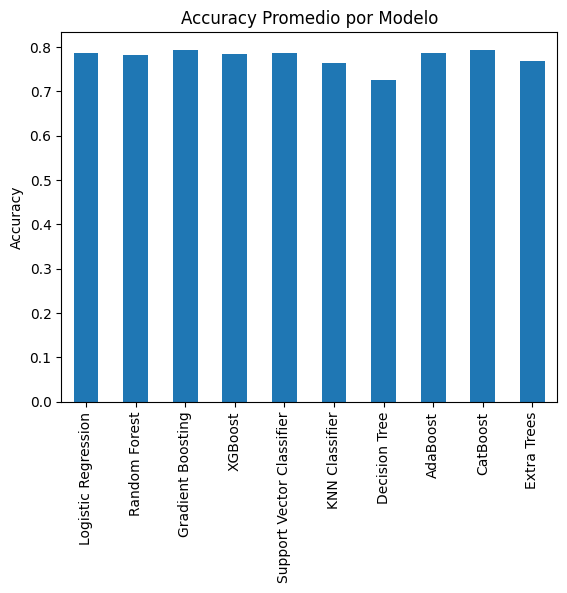

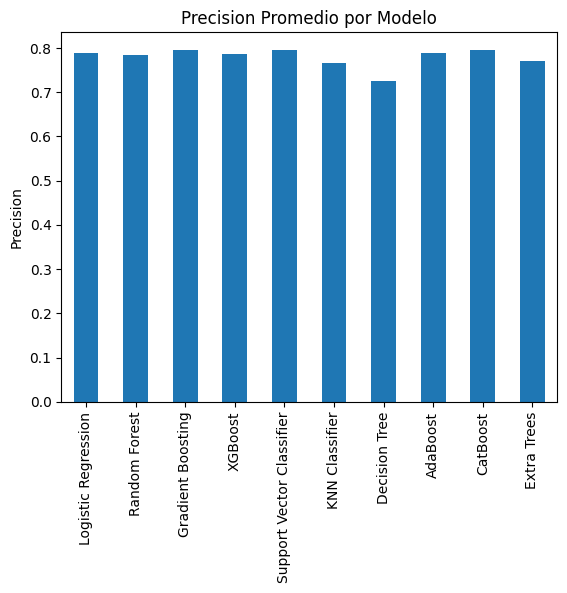

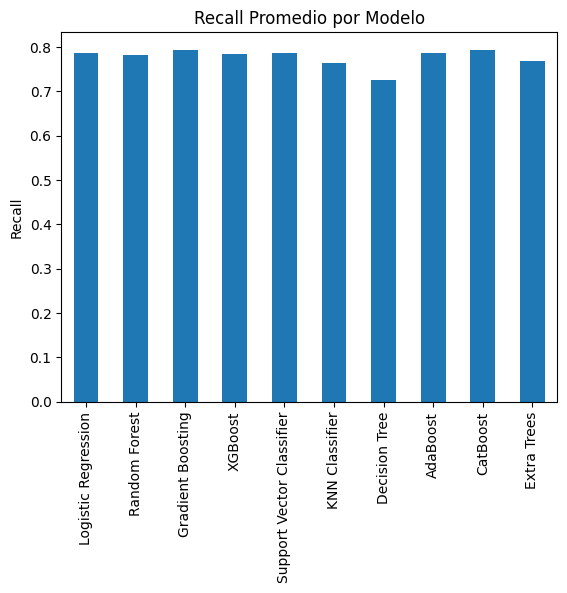

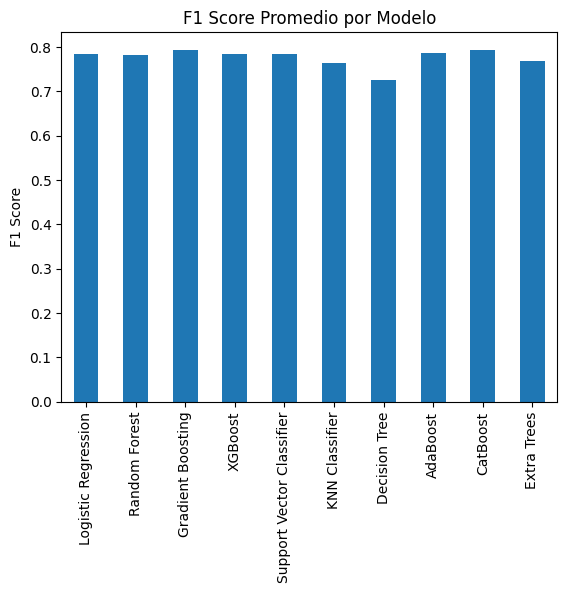

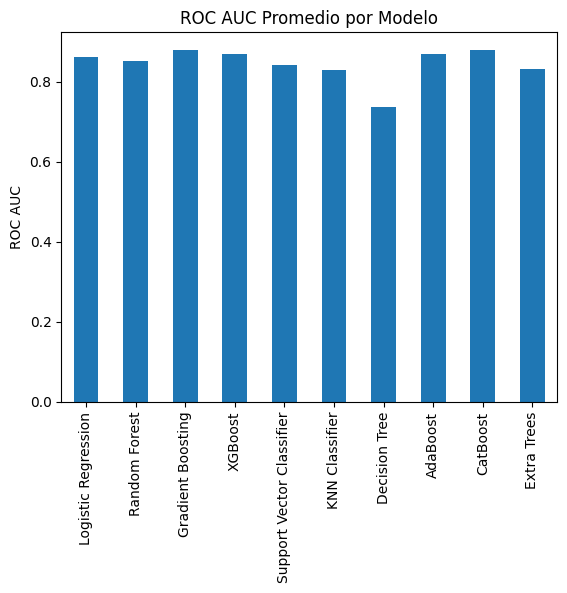

In [11]:
# Calcular los promedios de cada métrica
accuracy_mean = accuracy_df.mean()
precision_mean = precision_df.mean()
recall_mean = recall_df.mean()
f1_mean = f1_df.mean()
roc_auc_mean = roc_auc_df.mean()

# Visualizar los resultados
accuracy_mean.plot(kind='bar', title='Accuracy Promedio por Modelo')
plt.ylabel('Accuracy')
plt.show()

precision_mean.plot(kind='bar', title='Precision Promedio por Modelo')
plt.ylabel('Precision')
plt.show()

recall_mean.plot(kind='bar', title='Recall Promedio por Modelo')
plt.ylabel('Recall')
plt.show()

f1_mean.plot(kind='bar', title='F1 Score Promedio por Modelo')
plt.ylabel('F1 Score')
plt.show()

roc_auc_mean.plot(kind='bar', title='ROC AUC Promedio por Modelo')
plt.ylabel('ROC AUC')
plt.show()


Logistic Regression          6.4
Random Forest                5.3
Gradient Boosting            9.1
XGBoost                      6.1
Support Vector Classifier    6.5
KNN Classifier               2.3
Decision Tree                1.0
AdaBoost                     6.4
CatBoost                     8.8
Extra Trees                  3.1
dtype: float64


c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[p

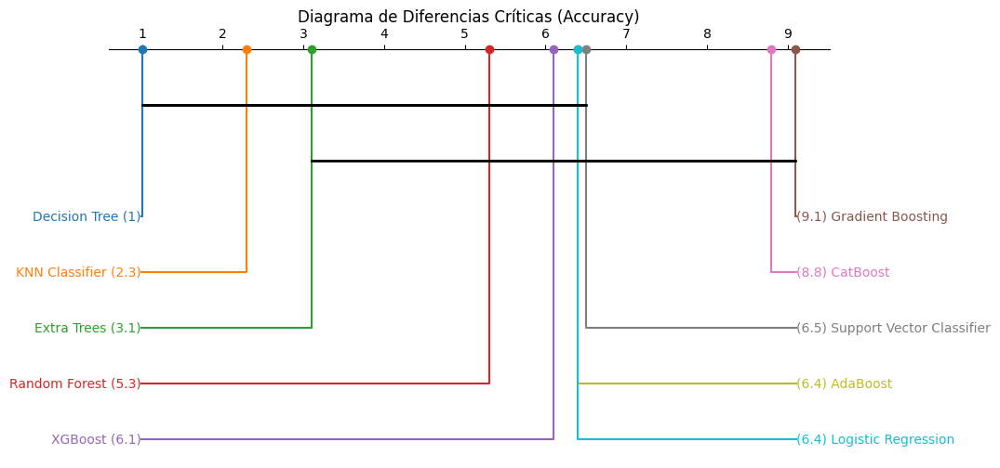

c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[p

Logistic Regression          7.0
Random Forest                5.4
Gradient Boosting            8.8
XGBoost                      5.2
Support Vector Classifier    8.2
KNN Classifier               2.4
Decision Tree                1.0
AdaBoost                     6.2
CatBoost                     8.0
Extra Trees                  2.8
dtype: float64


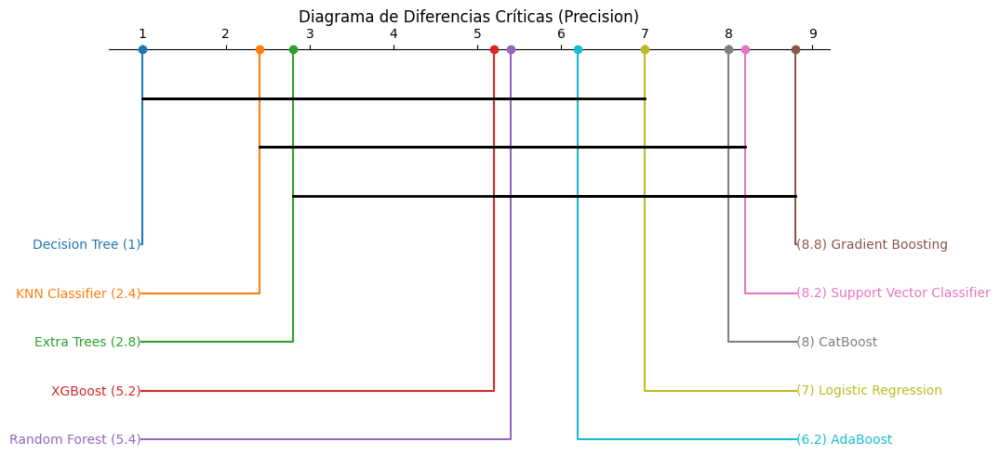

c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[p

Logistic Regression          6.4
Random Forest                5.3
Gradient Boosting            9.1
XGBoost                      6.1
Support Vector Classifier    6.5
KNN Classifier               2.3
Decision Tree                1.0
AdaBoost                     6.4
CatBoost                     8.8
Extra Trees                  3.1
dtype: float64


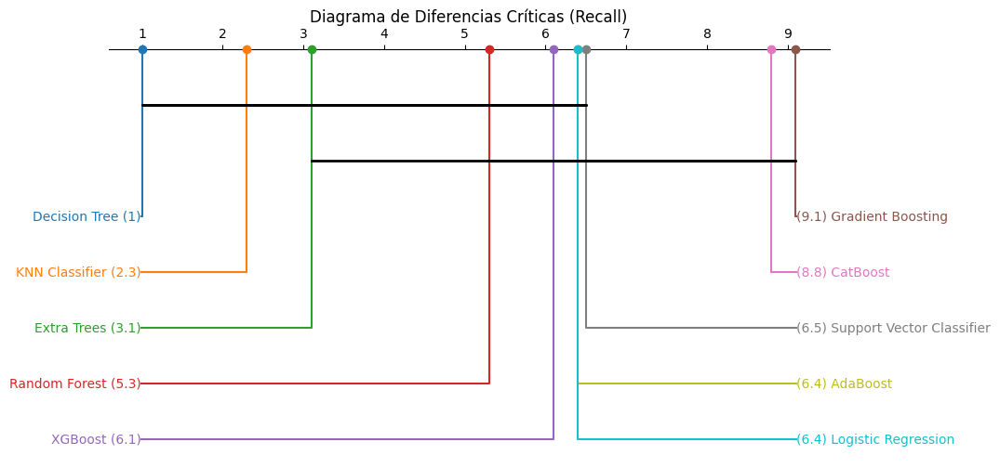

Logistic Regression          6.4
Random Forest                5.4
Gradient Boosting            9.2
XGBoost                      6.2
Support Vector Classifier    6.0
KNN Classifier               2.2
Decision Tree                1.0
AdaBoost                     6.6
CatBoost                     8.8
Extra Trees                  3.2
dtype: float64


c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[p

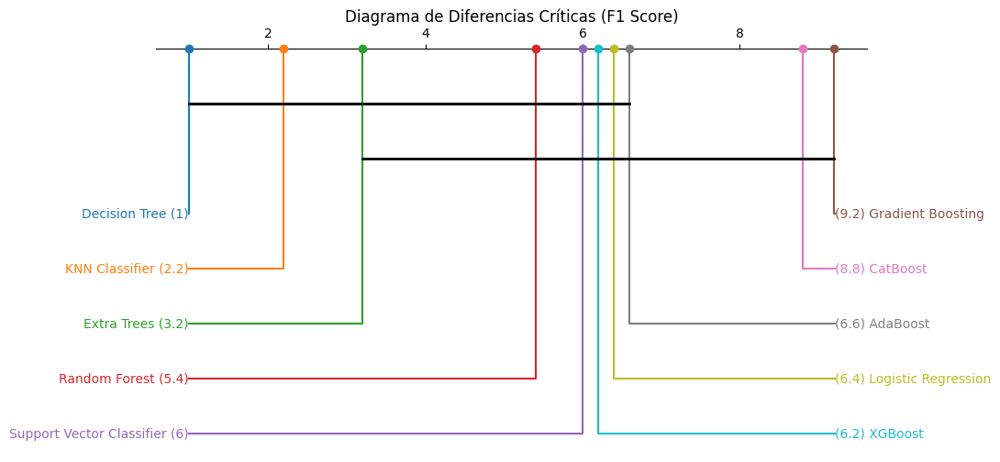

Logistic Regression          6.4
Random Forest                5.0
Gradient Boosting            9.4
XGBoost                      7.4
Support Vector Classifier    4.0
KNN Classifier               2.4
Decision Tree                1.0
AdaBoost                     7.2
CatBoost                     9.6
Extra Trees                  2.6
dtype: float64


c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[p

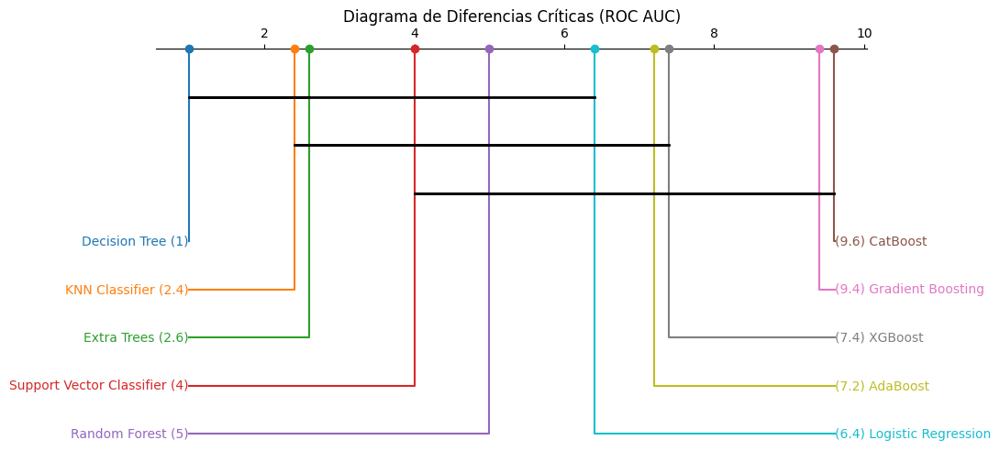

In [12]:
# Function to calculate and visualize critical differences using scikit-posthocs
def calcular_diferencias_criticas(df, metric_name):
    try:
        # Calcular los rangos promedio de los modelos
        avg_rank = df.rank(axis=1).mean(axis=0)
        print(avg_rank)

        # Realizar la prueba post-hoc de Nemenyi
        cd_result = sp.posthoc_nemenyi_friedman(df.values)

        # Graficar el diagrama de diferencias críticas
        plt.figure(figsize=(10, 6), dpi=100)
        plt.title(f'Diagrama de Diferencias Críticas ({metric_name})')
        sp.critical_difference_diagram(avg_rank, cd_result)
        plt.show()

    except ValueError as e:
        print(f"Error al calcular diferencias críticas para {metric_name}: {e}")

# Calcular y graficar diferencias críticas para cada métrica
calcular_diferencias_criticas(accuracy_df, 'Accuracy')
calcular_diferencias_criticas(precision_df, 'Precision')
calcular_diferencias_criticas(recall_df, 'Recall')
calcular_diferencias_criticas(f1_df, 'F1 Score')
calcular_diferencias_criticas(roc_auc_df, 'ROC AUC')


### Comparación Bayesiana

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmplom7iljy
Comparación bayesiana entre Logistic Regression y Random Forest en Accuracy: (0.16113501128212707, 0.8081203515802466, 0.03074463713762632)


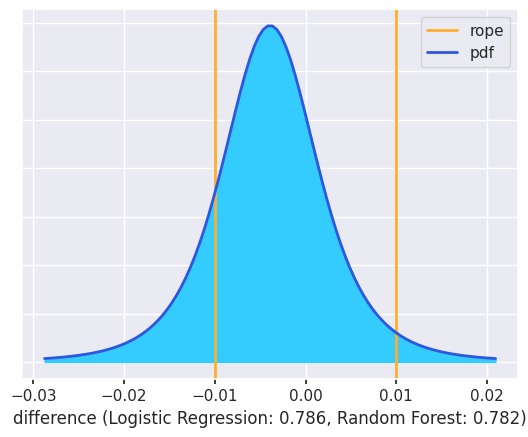

Comparación bayesiana entre Logistic Regression y Gradient Boosting en Accuracy: (0.019077380710409608, 0.6241222309962231, 0.35680038829336724)


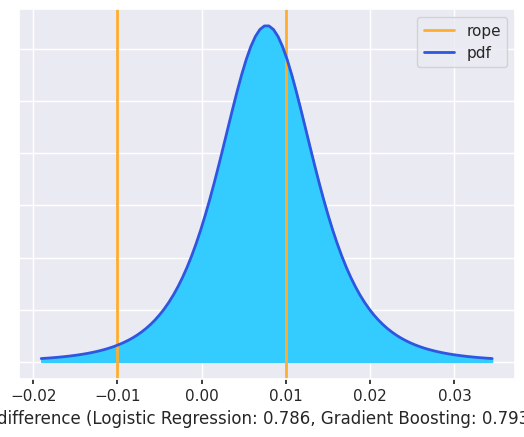

Comparación bayesiana entre Logistic Regression y XGBoost en Accuracy: (0.06263160106749045, 0.8920544743014899, 0.045313924631019686)


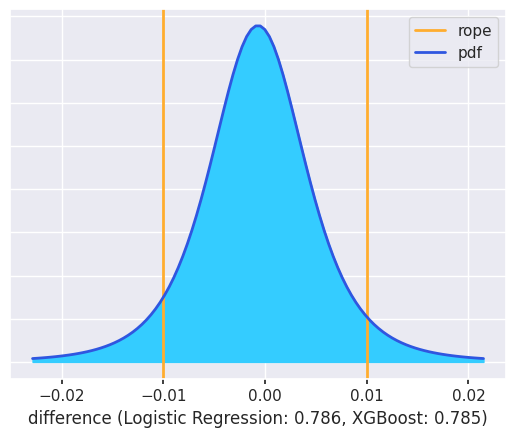

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en Accuracy: (0.1192412322981286, 0.7334309395187596, 0.14732782818311185)


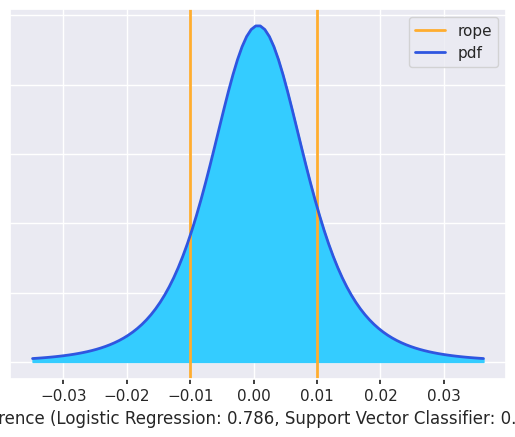

Comparación bayesiana entre Logistic Regression y KNN Classifier en Accuracy: (0.9652710272839424, 0.033468340082068226, 0.0012606326339893448)


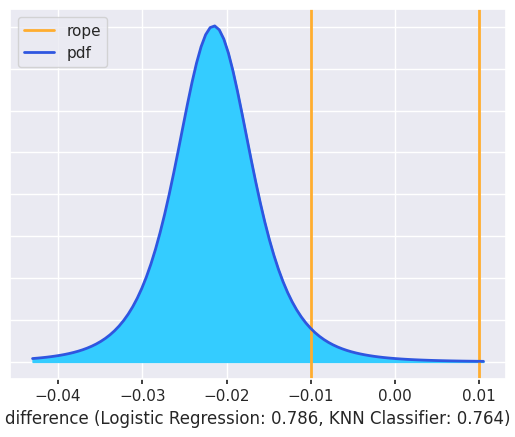

Comparación bayesiana entre Logistic Regression y Decision Tree en Accuracy: (0.9999388480999388, 4.472724446913379e-05, 1.6424655592039983e-05)


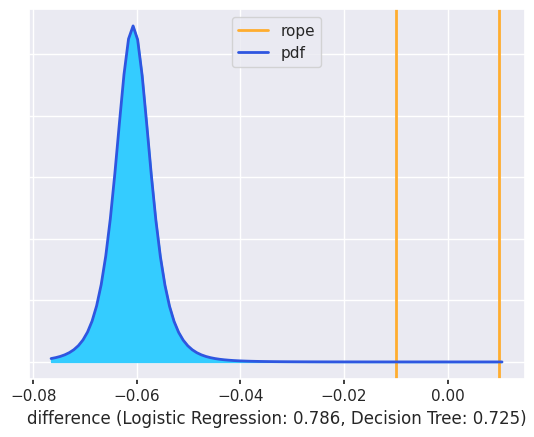

Comparación bayesiana entre Logistic Regression y AdaBoost en Accuracy: (0.04238122020107552, 0.9016278947608134, 0.055990885038111116)


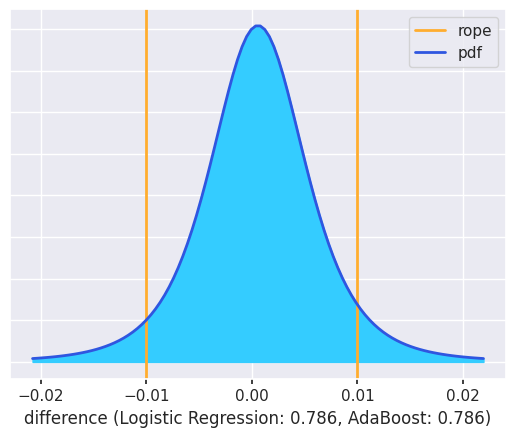

Comparación bayesiana entre Logistic Regression y CatBoost en Accuracy: (0.008796492887511127, 0.6247350795641432, 0.36646842754834563)


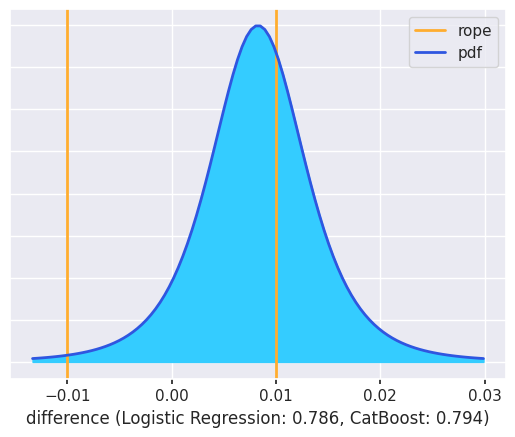

Comparación bayesiana entre Logistic Regression y Extra Trees en Accuracy: (0.8912560743448951, 0.10617880016935344, 0.002565125485751496)


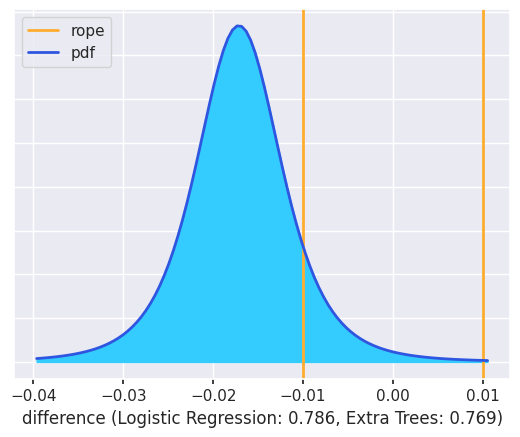

Comparación bayesiana entre Random Forest y Gradient Boosting en Accuracy: (0.008548293389072713, 0.3829867403180949, 0.6084649662928324)


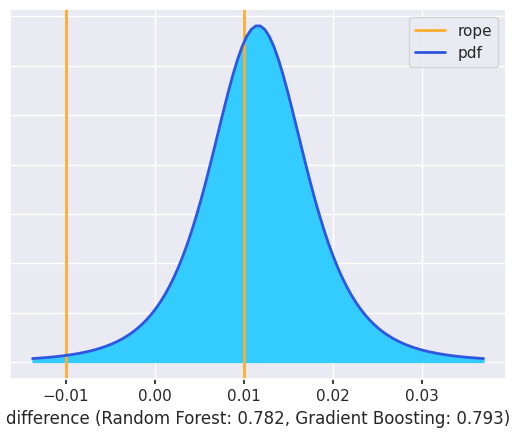

Comparación bayesiana entre Random Forest y XGBoost en Accuracy: (0.034184943947974646, 0.8293860703227703, 0.136428985729255)


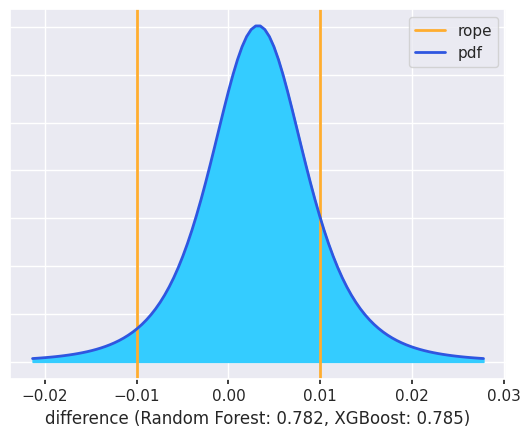

Comparación bayesiana entre Random Forest y Support Vector Classifier en Accuracy: (0.07465132890025981, 0.6522790130143922, 0.273069658085348)


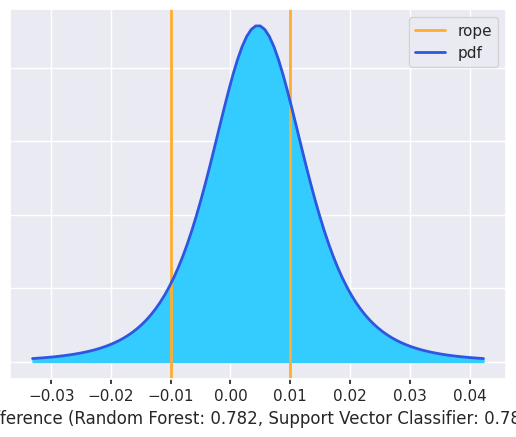

Comparación bayesiana entre Random Forest y KNN Classifier en Accuracy: (0.8177520733736637, 0.17193927470594939, 0.01030865192038688)


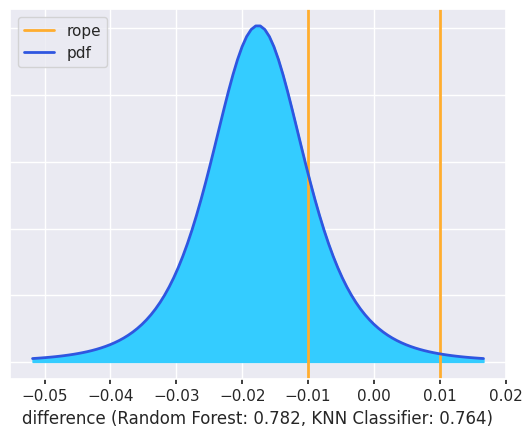

Comparación bayesiana entre Random Forest y Decision Tree en Accuracy: (0.9998246817011389, 0.00013193500482622245, 4.3383294034859965e-05)


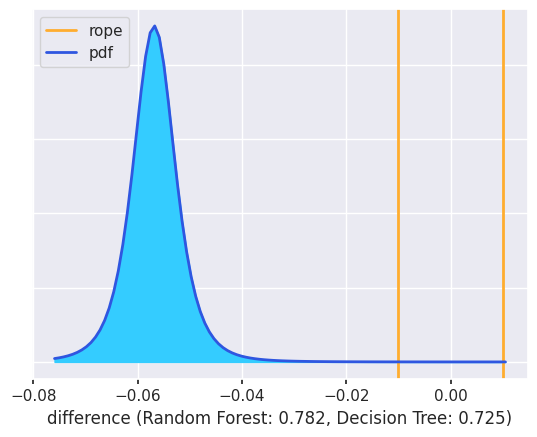

Comparación bayesiana entre Random Forest y AdaBoost en Accuracy: (0.044757584348933, 0.73340502343459, 0.22183739221647703)


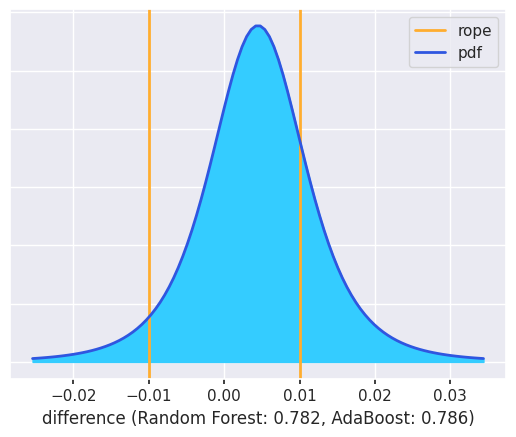

Comparación bayesiana entre Random Forest y CatBoost en Accuracy: (0.0008824586223020048, 0.2512511928585216, 0.7478663485191764)


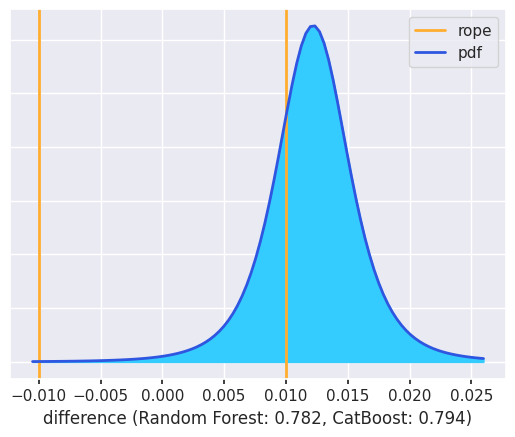

Comparación bayesiana entre Random Forest y Extra Trees en Accuracy: (0.7418074907197654, 0.25473251698144794, 0.003459992298786685)


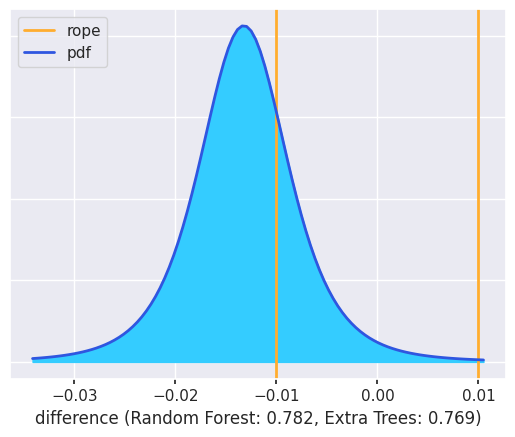

Comparación bayesiana entre Gradient Boosting y XGBoost en Accuracy: (0.3242907703239647, 0.6732885921826957, 0.00242063749333965)


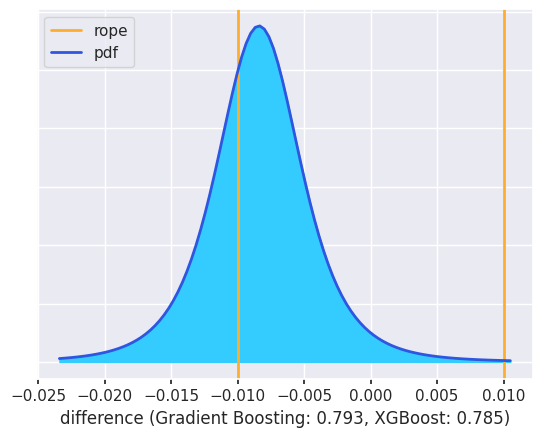

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en Accuracy: (0.3003155586755727, 0.6838024154524376, 0.015882025871989724)


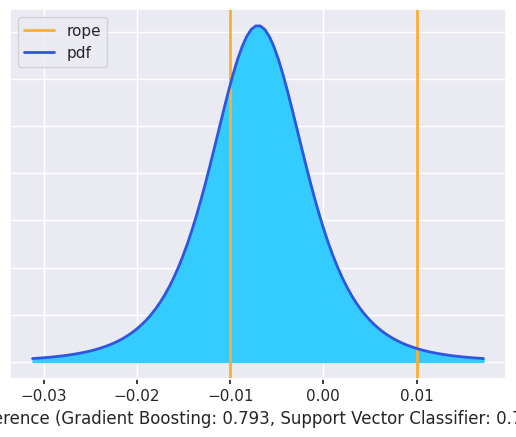

Comparación bayesiana entre Gradient Boosting y KNN Classifier en Accuracy: (0.9766327935442384, 0.021171344153391614, 0.002195862302370011)


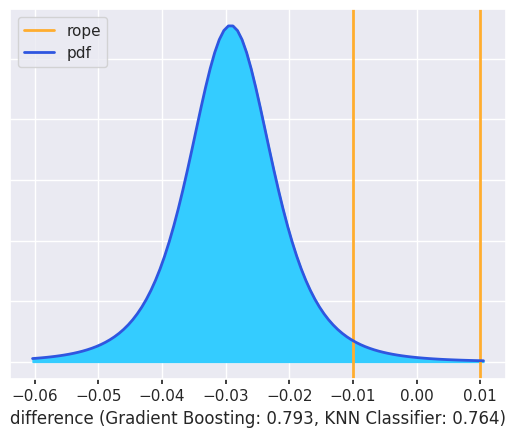

Comparación bayesiana entre Gradient Boosting y Decision Tree en Accuracy: (0.9995231113292344, 0.0003243158523014156, 0.00015257281846414728)


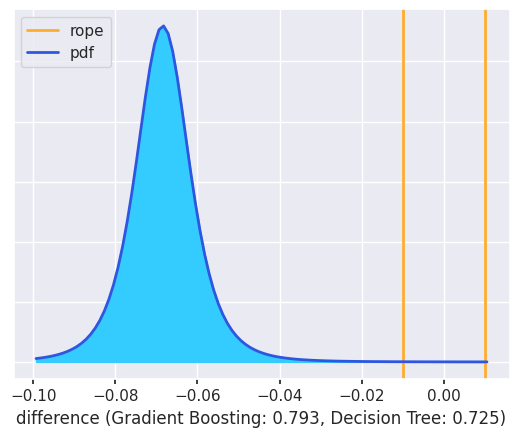

Comparación bayesiana entre Gradient Boosting y AdaBoost en Accuracy: (0.3128820715543096, 0.6698952043275631, 0.01722272411812731)


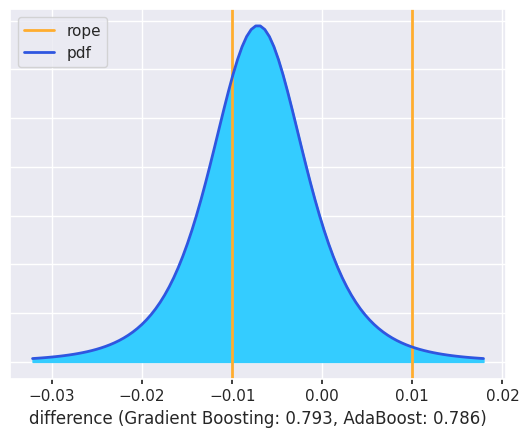

Comparación bayesiana entre Gradient Boosting y CatBoost en Accuracy: (0.049541137489213724, 0.8859198844422214, 0.0645389780685649)


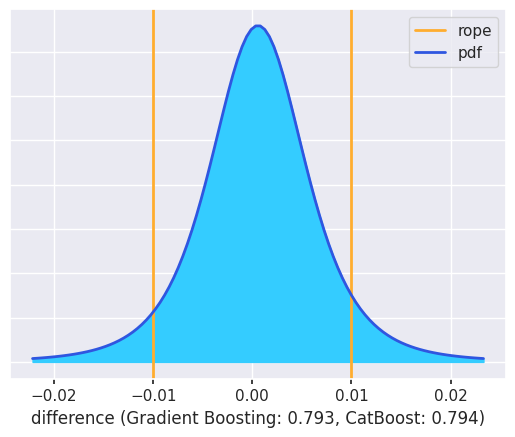

Comparación bayesiana entre Gradient Boosting y Extra Trees en Accuracy: (0.9324875411914255, 0.061601229321209594, 0.0059112294873648885)


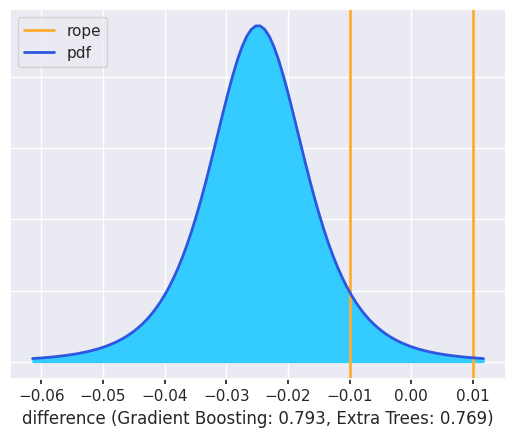

Comparación bayesiana entre XGBoost y Support Vector Classifier en Accuracy: (0.014510776315052345, 0.9529470487962506, 0.03254217488869704)


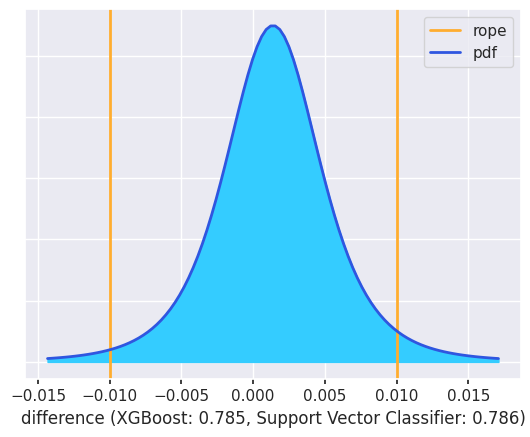

Comparación bayesiana entre XGBoost y KNN Classifier en Accuracy: (0.9300232070723502, 0.06679428019916411, 0.003182512728485687)


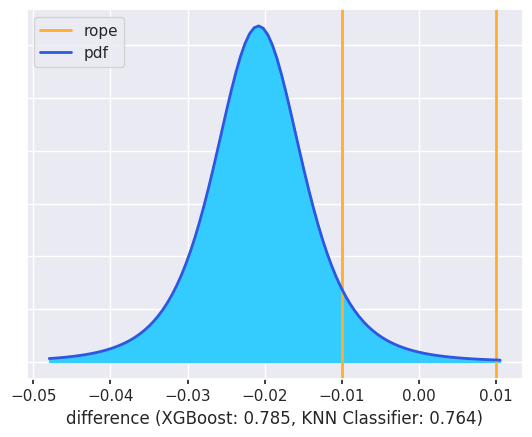

Comparación bayesiana entre XGBoost y Decision Tree en Accuracy: (0.9992638216402443, 0.0005341934031838358, 0.00020198495657186566)


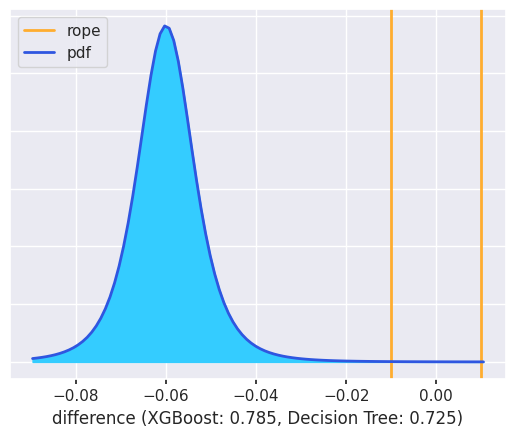

Comparación bayesiana entre XGBoost y AdaBoost en Accuracy: (0.06755417789839188, 0.8219460242821457, 0.1104997978194624)


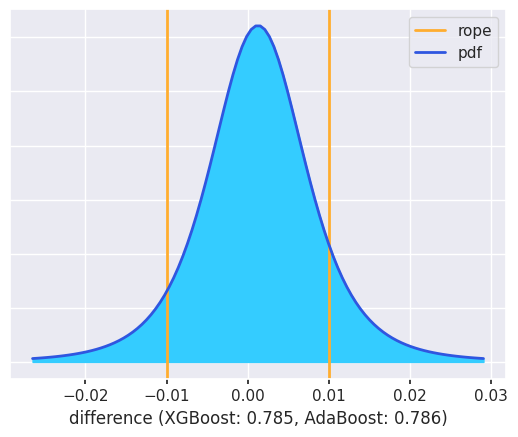

Comparación bayesiana entre XGBoost y CatBoost en Accuracy: (0.00661139066967489, 0.5787242382277393, 0.4146643711025858)


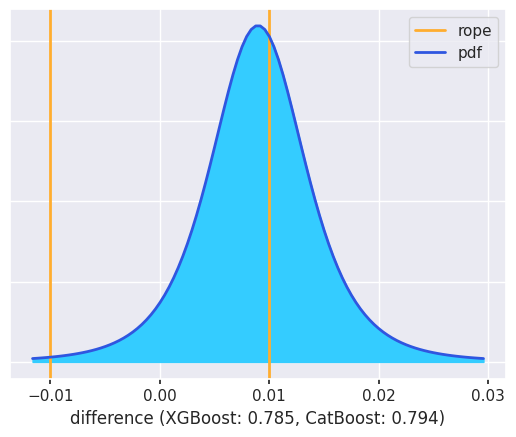

Comparación bayesiana entre XGBoost y Extra Trees en Accuracy: (0.7709461533068289, 0.2149427781441703, 0.014111068549000794)


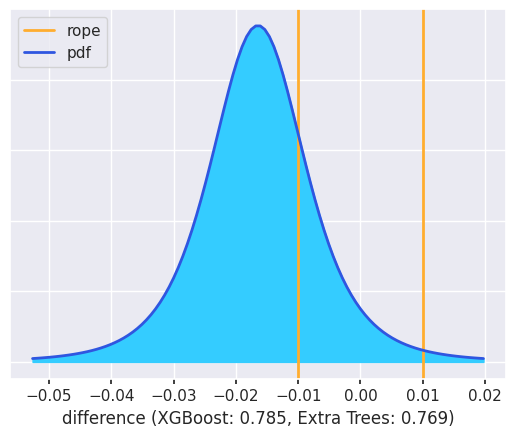

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en Accuracy: (0.9221196863888729, 0.07289209161620491, 0.004988221994922215)


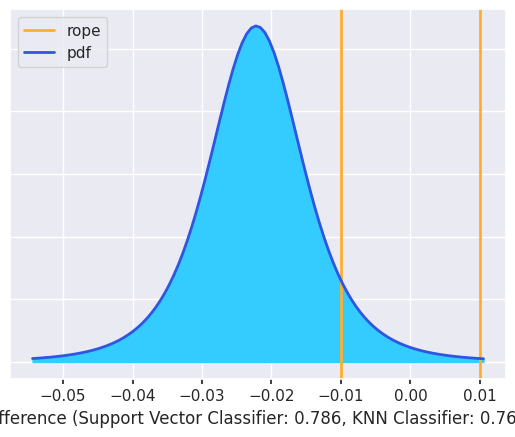

Comparación bayesiana entre Support Vector Classifier y Decision Tree en Accuracy: (0.9974887474259477, 0.0017698117792352974, 0.0007414407948169721)


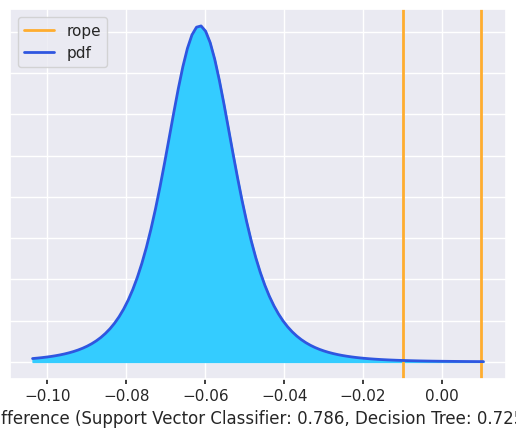

Comparación bayesiana entre Support Vector Classifier y AdaBoost en Accuracy: (0.13619102148646314, 0.7323595560696018, 0.1314494224439351)


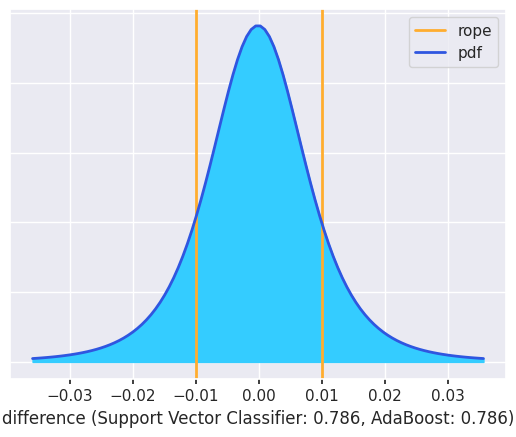

Comparación bayesiana entre Support Vector Classifier y CatBoost en Accuracy: (0.04290231353771754, 0.5713970757757865, 0.38570061068649597)


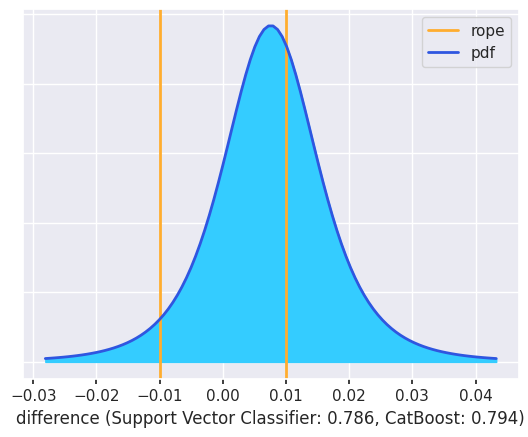

Comparación bayesiana entre Support Vector Classifier y Extra Trees en Accuracy: (0.7487891400035078, 0.2216878116937433, 0.029523048302748878)


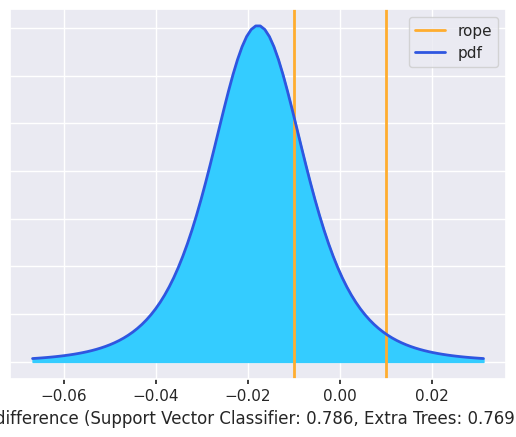

Comparación bayesiana entre KNN Classifier y Decision Tree en Accuracy: (0.997953962483689, 0.0017608168955963732, 0.0002852206207146768)


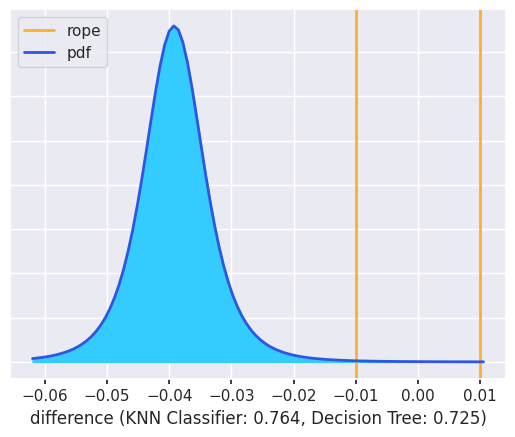

Comparación bayesiana entre KNN Classifier y AdaBoost en Accuracy: (0.00019818566807415077, 0.00709989957758983, 0.992701914754336)


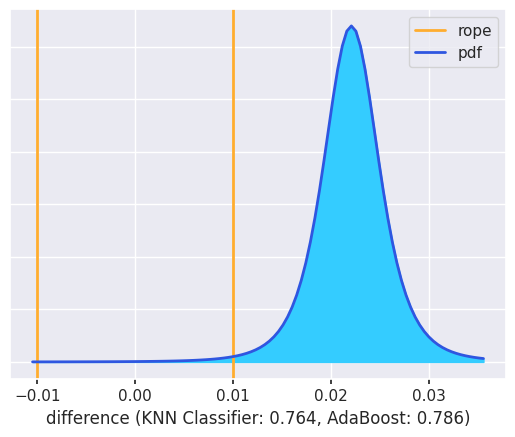

Comparación bayesiana entre KNN Classifier y CatBoost en Accuracy: (0.00400247156466828, 0.03157680750474934, 0.9644207209305824)


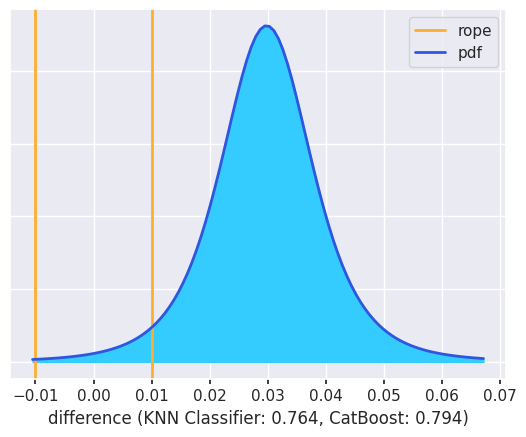

Comparación bayesiana entre KNN Classifier y Extra Trees en Accuracy: (0.04197719602427465, 0.747761763523207, 0.21026104045251837)


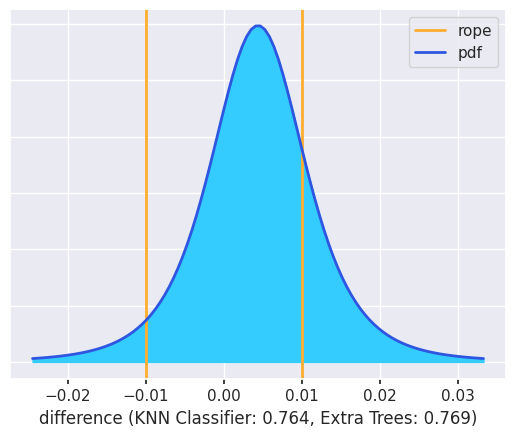

Comparación bayesiana entre Decision Tree y AdaBoost en Accuracy: (3.281500558208479e-05, 8.712653530928982e-05, 0.9998800584591087)


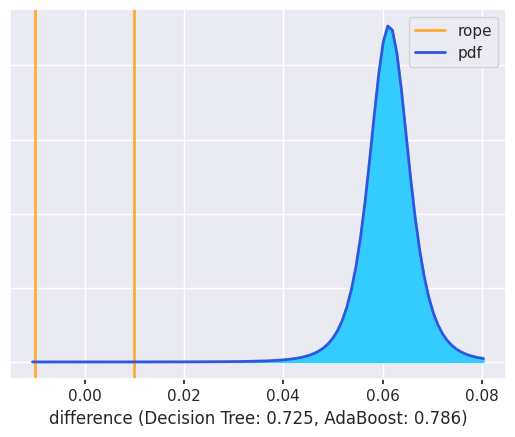

Comparación bayesiana entre Decision Tree y CatBoost en Accuracy: (6.24405566714348e-05, 0.00013345924448493474, 0.9998041001988436)


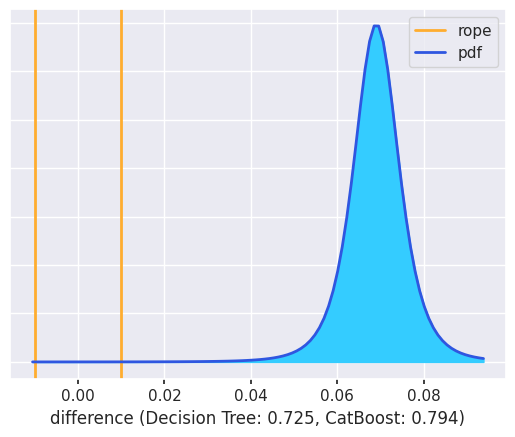

Comparación bayesiana entre Decision Tree y Extra Trees en Accuracy: (2.4792030429543403e-06, 1.3428202190635119e-05, 0.9999840925947664)


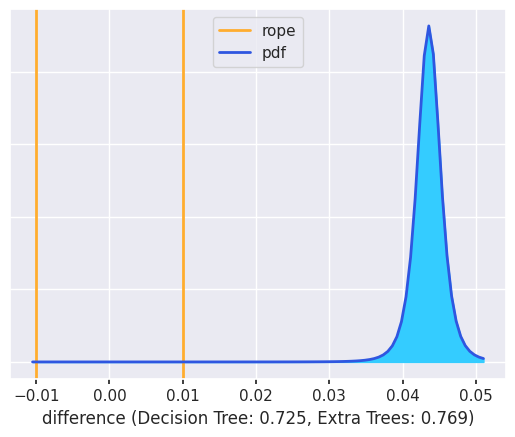

Comparación bayesiana entre AdaBoost y CatBoost en Accuracy: (0.03648444794530915, 0.5785830646678075, 0.38493248738688335)


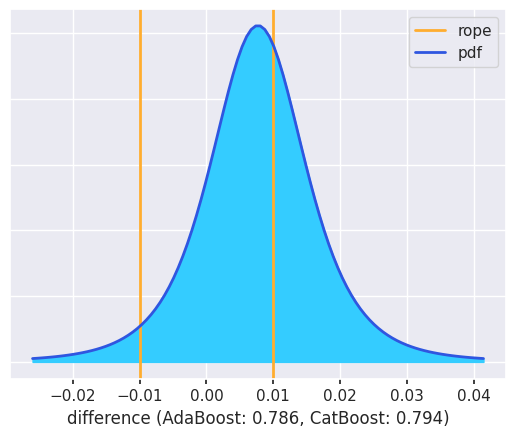

Comparación bayesiana entre AdaBoost y Extra Trees en Accuracy: (0.890115954163111, 0.10667126364838742, 0.0032127821885016283)


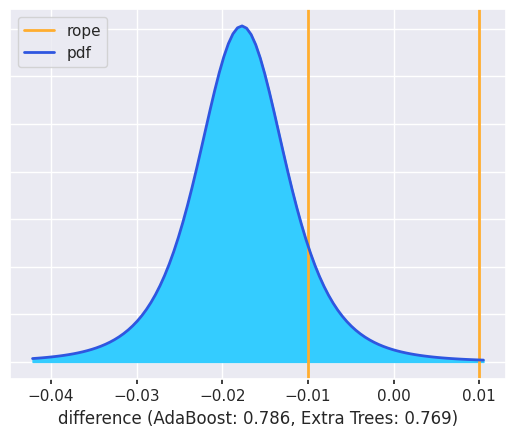

Comparación bayesiana entre CatBoost y Extra Trees en Accuracy: (0.9663959765716805, 0.03130397391799733, 0.002300049510322144)


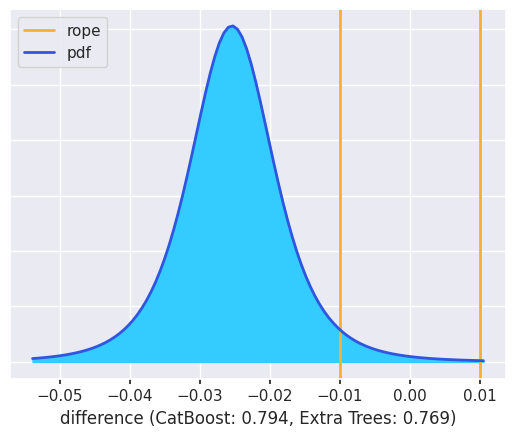

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmpl9x2ebad
Comparación bayesiana entre Logistic Regression y Random Forest en Precision: (0.2685264735253192, 0.6876245850436268, 0.043848941431054)


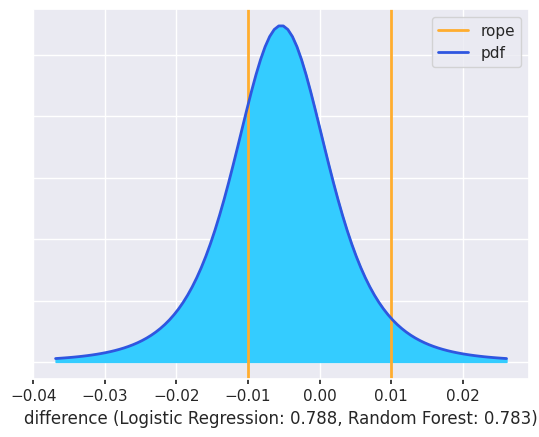

Comparación bayesiana entre Logistic Regression y Gradient Boosting en Precision: (0.02233316636996964, 0.6461607446973382, 0.3315060889326922)


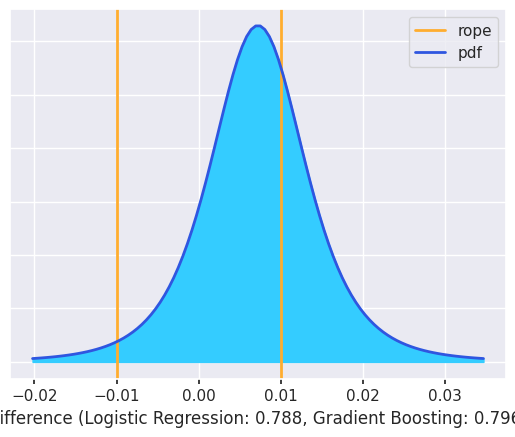

Comparación bayesiana entre Logistic Regression y XGBoost en Precision: (0.13684523794935516, 0.8111225159176986, 0.052032246132946214)


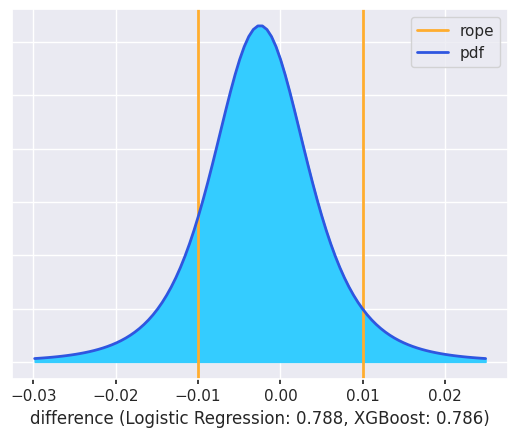

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en Precision: (0.04314810555916047, 0.5791441267421421, 0.3777077676986974)


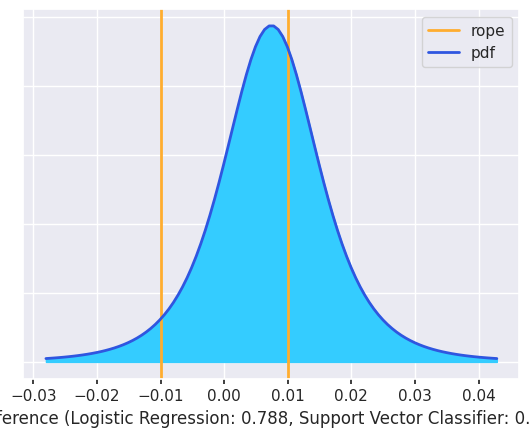

Comparación bayesiana entre Logistic Regression y KNN Classifier en Precision: (0.9826503492297242, 0.01663304738982474, 0.0007166033804510974)


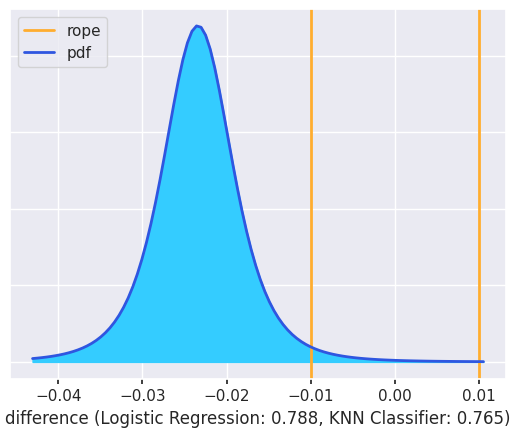

Comparación bayesiana entre Logistic Regression y Decision Tree en Precision: (0.9999564100085628, 3.148016560305944e-05, 1.2109825834105692e-05)


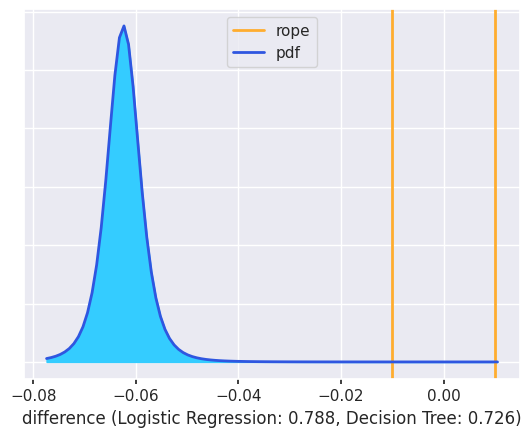

Comparación bayesiana entre Logistic Regression y AdaBoost en Precision: (0.04068589790729549, 0.919573096548247, 0.039741005544457475)


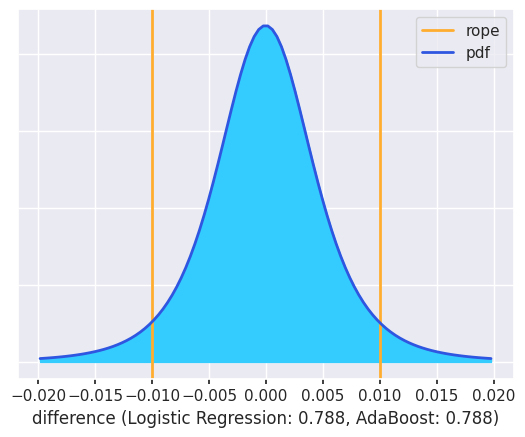

Comparación bayesiana entre Logistic Regression y CatBoost en Precision: (0.0175896483439378, 0.6839623605804853, 0.29844799107557685)


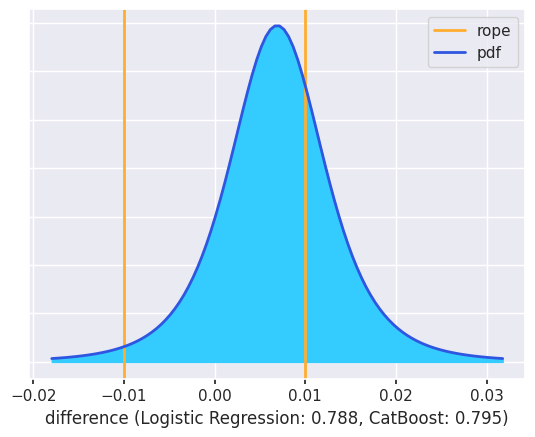

Comparación bayesiana entre Logistic Regression y Extra Trees en Precision: (0.8931832743718958, 0.10384234278181104, 0.0029743828462931443)


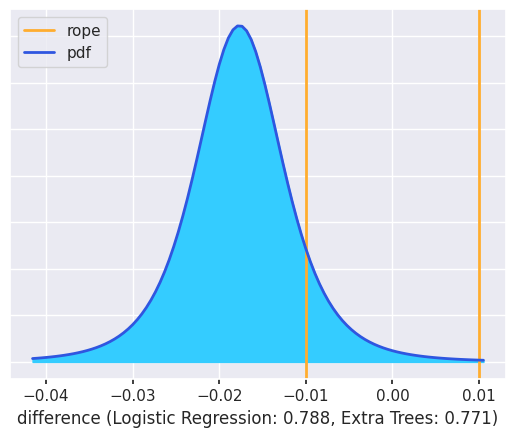

Comparación bayesiana entre Random Forest y Gradient Boosting en Precision: (0.013405178207238409, 0.344173485139179, 0.6424213366535826)


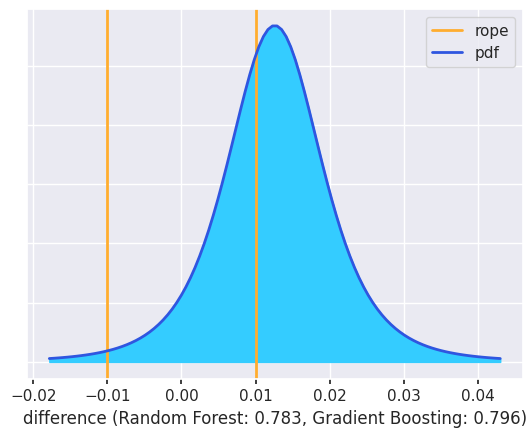

Comparación bayesiana entre Random Forest y XGBoost en Precision: (0.03603005244819804, 0.8368346625407407, 0.1271352850110613)


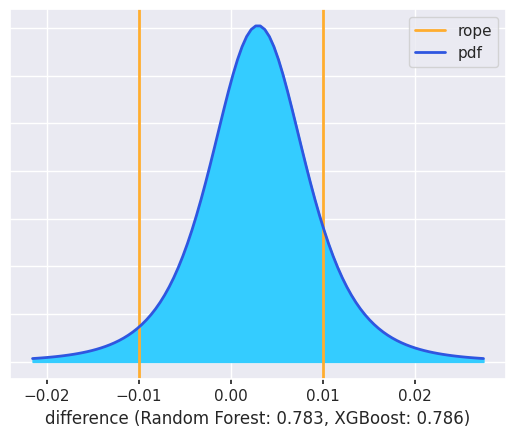

Comparación bayesiana entre Random Forest y Support Vector Classifier en Precision: (0.03311904756971288, 0.3530034611926376, 0.6138774912376496)


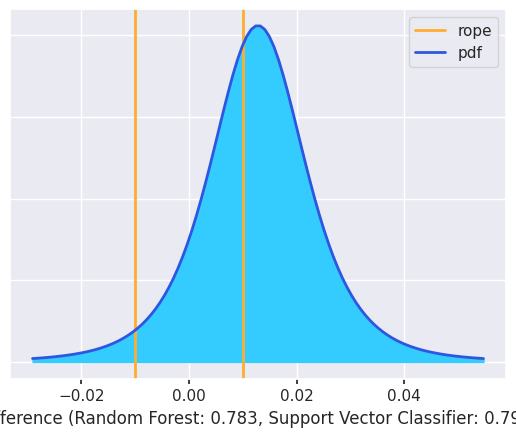

Comparación bayesiana entre Random Forest y KNN Classifier en Precision: (0.8157009599673999, 0.17225781819439057, 0.012041221838209548)


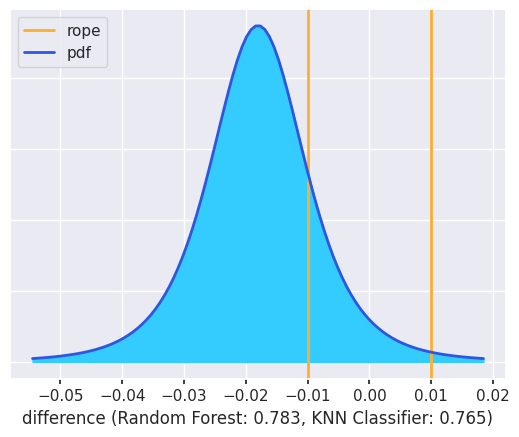

Comparación bayesiana entre Random Forest y Decision Tree en Precision: (0.9996493022512399, 0.0002625352451864904, 8.816250357357447e-05)


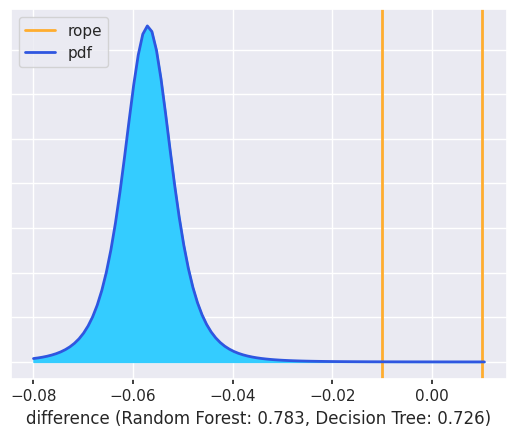

Comparación bayesiana entre Random Forest y AdaBoost en Precision: (0.06893094168797498, 0.6290310592155216, 0.3020379990965034)


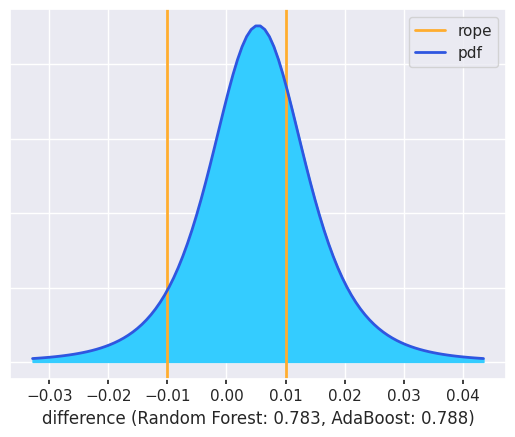

Comparación bayesiana entre Random Forest y CatBoost en Precision: (0.0007828832363754857, 0.2370829770238404, 0.7621341397397842)


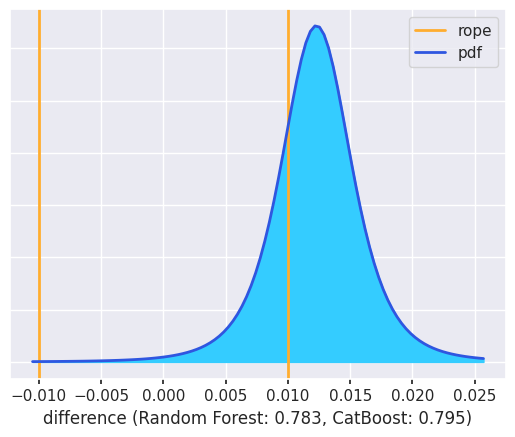

Comparación bayesiana entre Random Forest y Extra Trees en Precision: (0.7050970171098729, 0.29260947426922423, 0.002293508620902829)


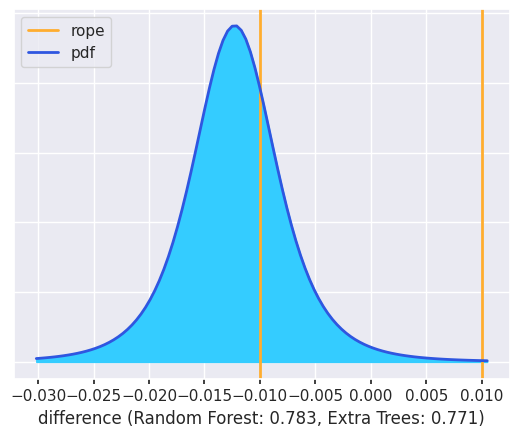

Comparación bayesiana entre Gradient Boosting y XGBoost en Precision: (0.4671779570227541, 0.5294620737524329, 0.0033599692248129642)


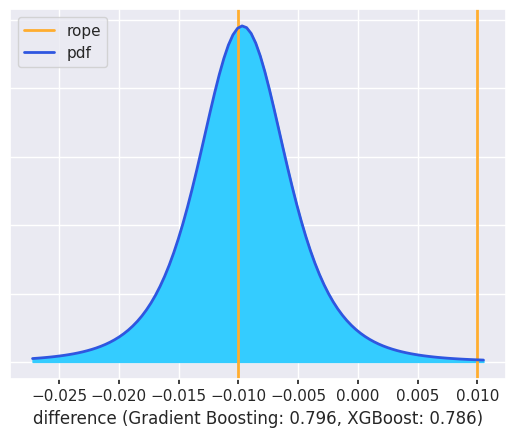

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en Precision: (0.048100178655370585, 0.8982352985066849, 0.05366452283794454)


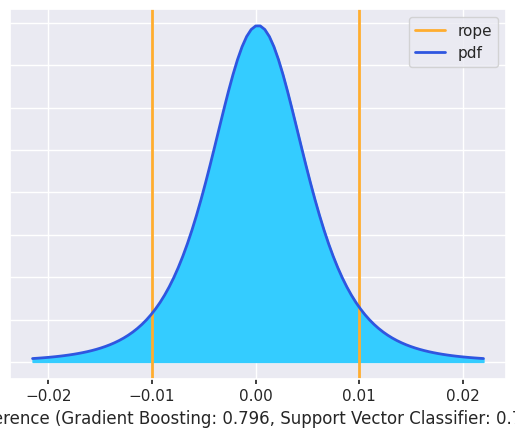

Comparación bayesiana entre Gradient Boosting y KNN Classifier en Precision: (0.9868423071454825, 0.011920123019864892, 0.0012375698346526187)


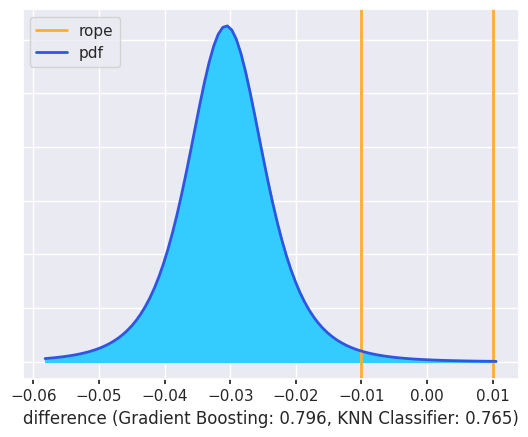

Comparación bayesiana entre Gradient Boosting y Decision Tree en Precision: (0.9996755927713036, 0.00021925846439019292, 0.00010514876430622877)


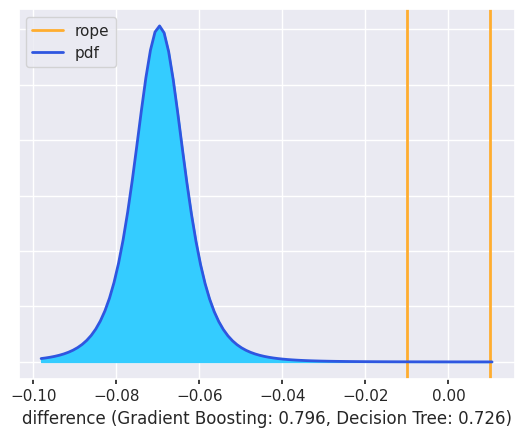

Comparación bayesiana entre Gradient Boosting y AdaBoost en Precision: (0.3095969050614307, 0.6763938320457323, 0.014009262892836993)


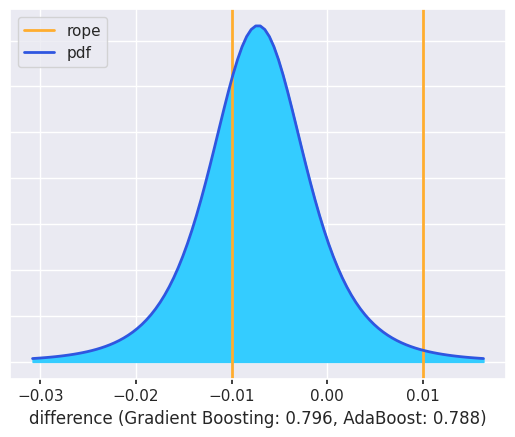

Comparación bayesiana entre Gradient Boosting y CatBoost en Precision: (0.0715373968451508, 0.8656390102332271, 0.0628235929216221)


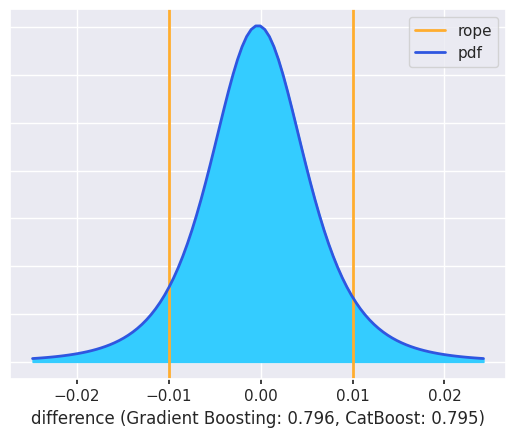

Comparación bayesiana entre Gradient Boosting y Extra Trees en Precision: (0.937032864232063, 0.05765864476262783, 0.005308491005309168)


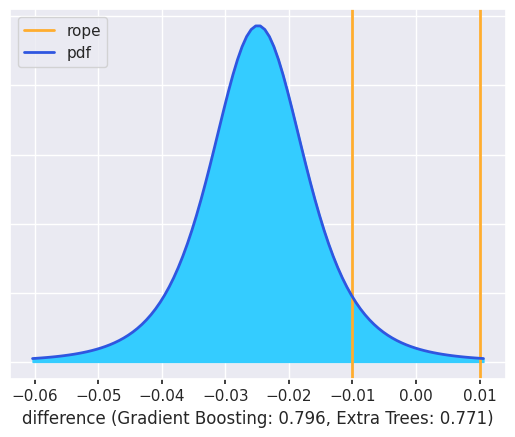

Comparación bayesiana entre XGBoost y Support Vector Classifier en Precision: (0.005985432302266864, 0.5026593249837197, 0.49135524271401343)


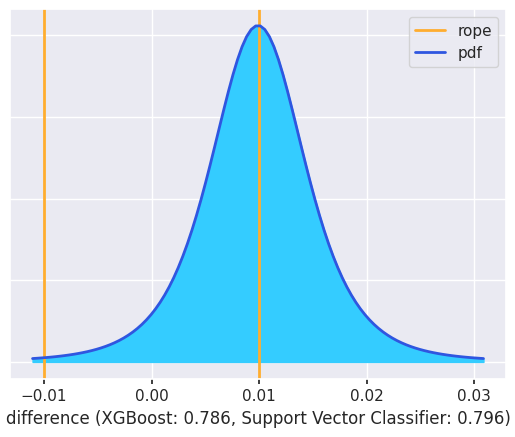

Comparación bayesiana entre XGBoost y KNN Classifier en Precision: (0.9397705781766009, 0.05767441403288931, 0.002555007790509767)


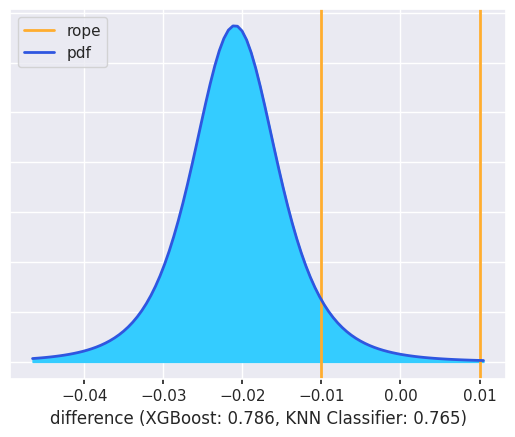

Comparación bayesiana entre XGBoost y Decision Tree en Precision: (0.999393745870097, 0.00044108317310986855, 0.00016517095679313698)


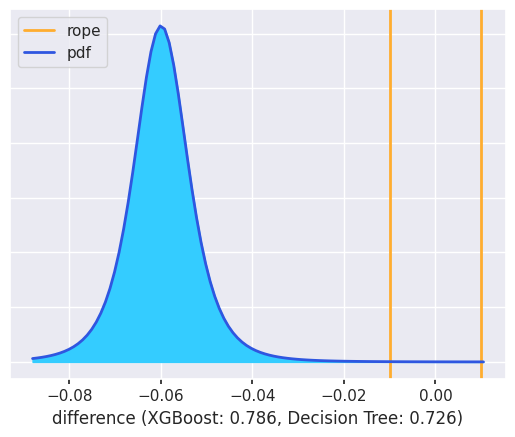

Comparación bayesiana entre XGBoost y AdaBoost en Precision: (0.07259603077466163, 0.7614153995845943, 0.16598856964074415)


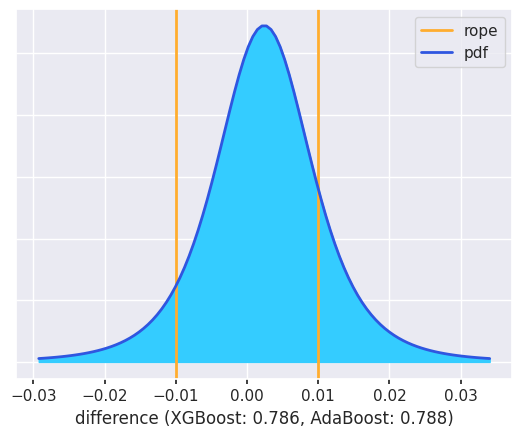

Comparación bayesiana entre XGBoost y CatBoost en Precision: (0.00589072197729124, 0.5477769366737406, 0.44633234134896815)


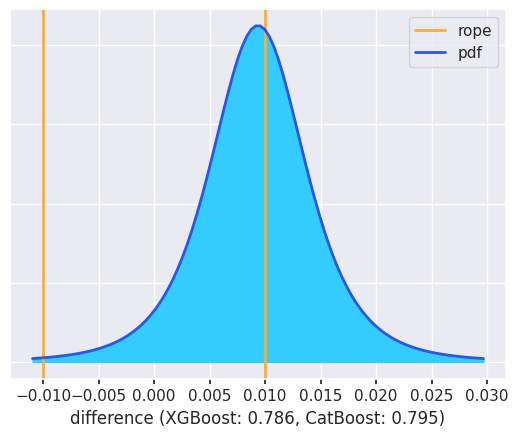

Comparación bayesiana entre XGBoost y Extra Trees en Precision: (0.7451204975950069, 0.24248184184655786, 0.012397660558435275)


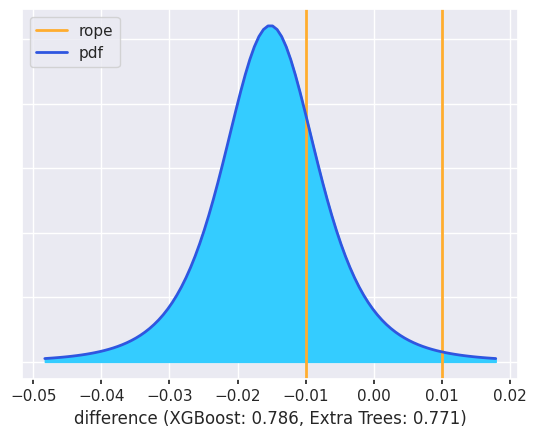

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en Precision: (0.9928900818120373, 0.006490172031720753, 0.0006197461562419404)


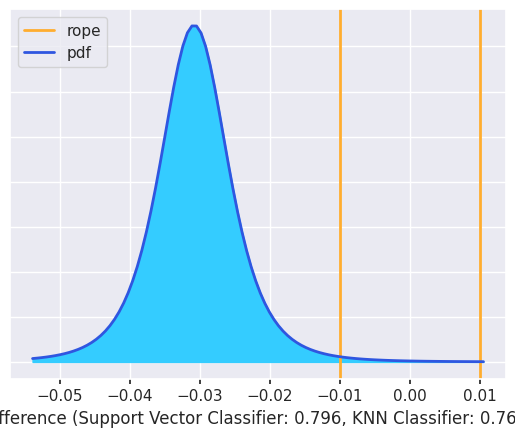

Comparación bayesiana entre Support Vector Classifier y Decision Tree en Precision: (0.9991145505782677, 0.0005915480699415498, 0.0002939013517907485)


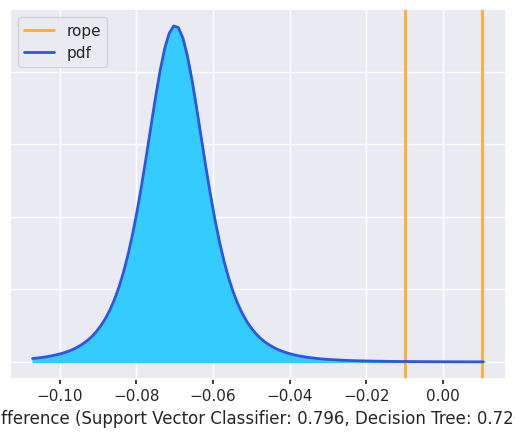

Comparación bayesiana entre Support Vector Classifier y AdaBoost en Precision: (0.3554331708300823, 0.6190987221650969, 0.025468107004820828)


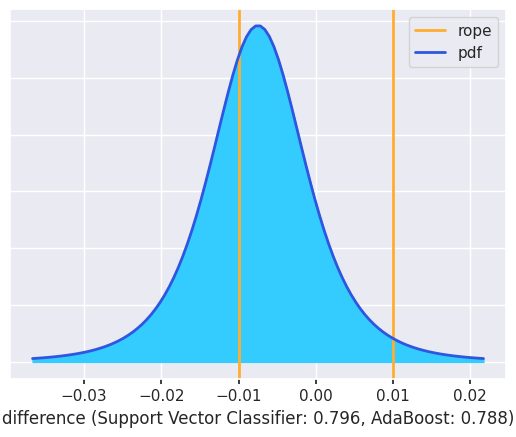

Comparación bayesiana entre Support Vector Classifier y CatBoost en Precision: (0.164056370442651, 0.6941135138298722, 0.14183011572747684)


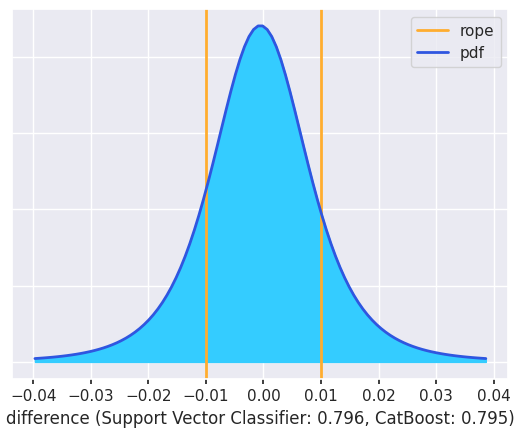

Comparación bayesiana entre Support Vector Classifier y Extra Trees en Precision: (0.8971957401910944, 0.09047369660011217, 0.012330563208793444)


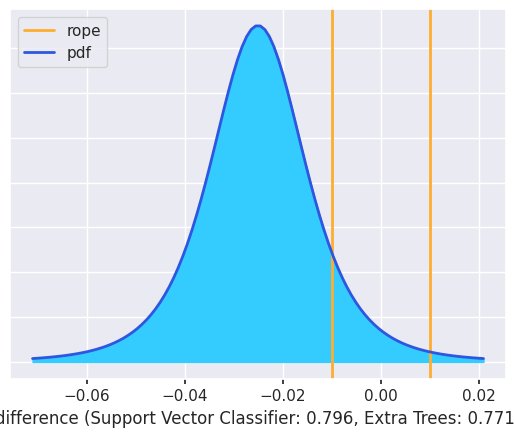

Comparación bayesiana entre KNN Classifier y Decision Tree en Precision: (0.9984880465875102, 0.0013071210090156438, 0.00020483240347413112)


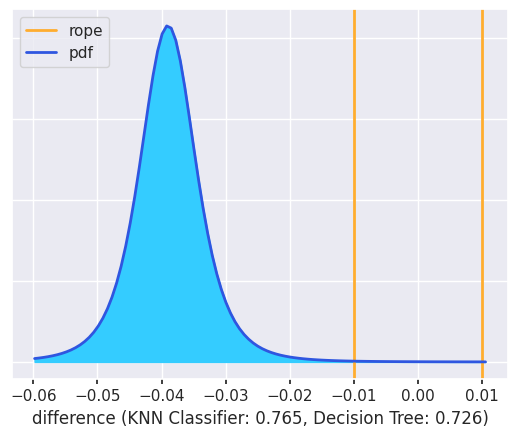

Comparación bayesiana entre KNN Classifier y AdaBoost en Precision: (0.0003905595491087787, 0.010231859495764217, 0.989377580955127)


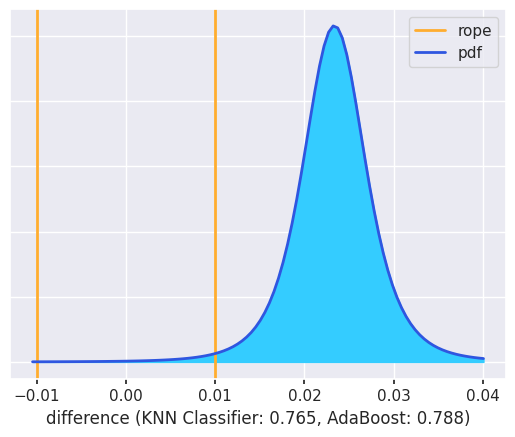

Comparación bayesiana entre KNN Classifier y CatBoost en Precision: (0.002959719412004752, 0.02433207753943767, 0.9727082030485575)


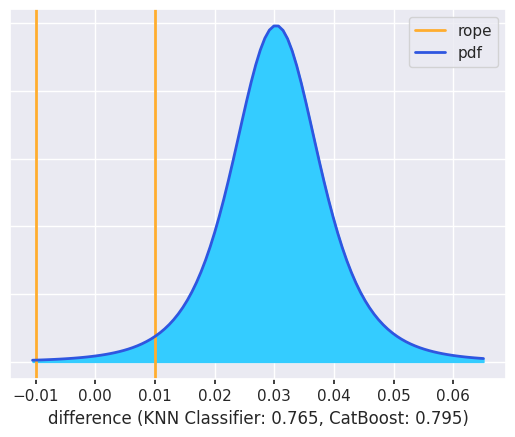

Comparación bayesiana entre KNN Classifier y Extra Trees en Precision: (0.04125289587217327, 0.6750676029843694, 0.2836795011434573)


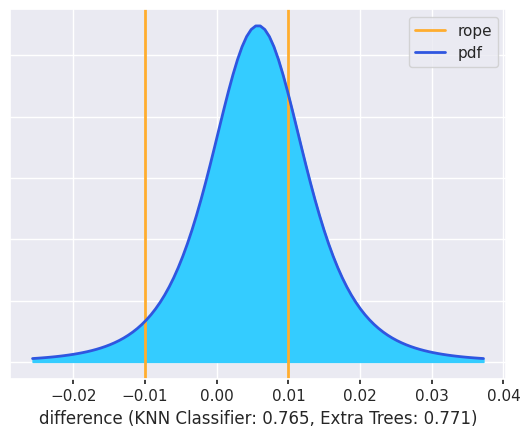

Comparación bayesiana entre Decision Tree y AdaBoost en Precision: (3.935496553078559e-05, 0.00010107835472827897, 0.999859566679741)


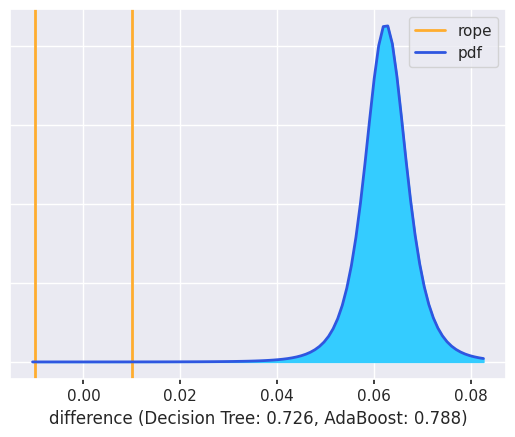

Comparación bayesiana entre Decision Tree y CatBoost en Precision: (4.6627137877165305e-05, 9.941456363704582e-05, 0.9998539582984858)


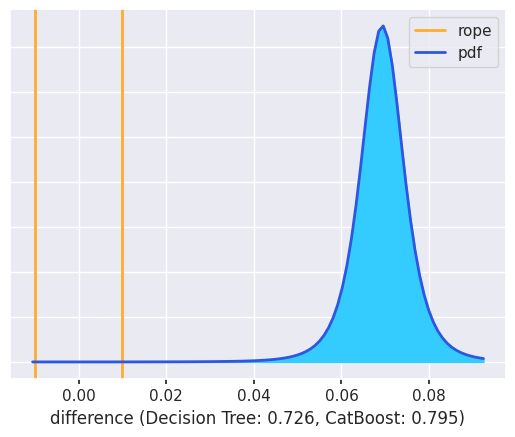

Comparación bayesiana entre Decision Tree y Extra Trees en Precision: (1.3564790147734532e-05, 6.828956468185599e-05, 0.9999181456451705)


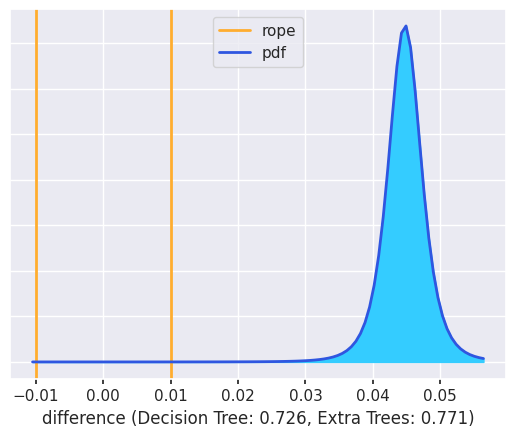

Comparación bayesiana entre AdaBoost y CatBoost en Precision: (0.04495710136679171, 0.6005793145455198, 0.3544635840876884)


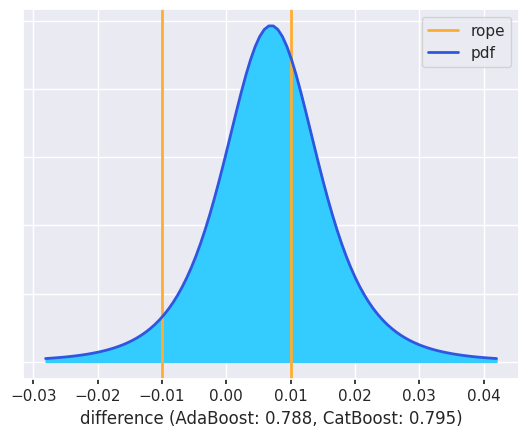

Comparación bayesiana entre AdaBoost y Extra Trees en Precision: (0.8379339455497772, 0.15447811850030557, 0.007587935949917246)


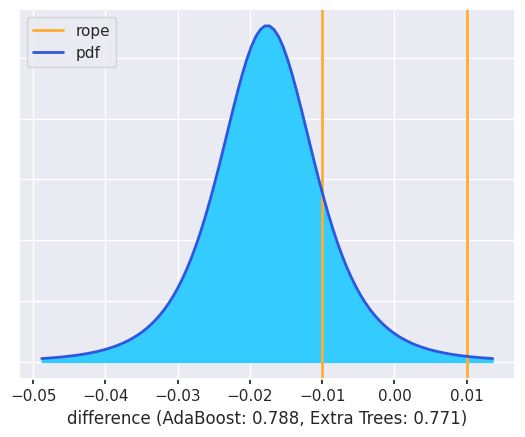

Comparación bayesiana entre CatBoost y Extra Trees en Precision: (0.9806881190820361, 0.01832625926365672, 0.000985621654307156)


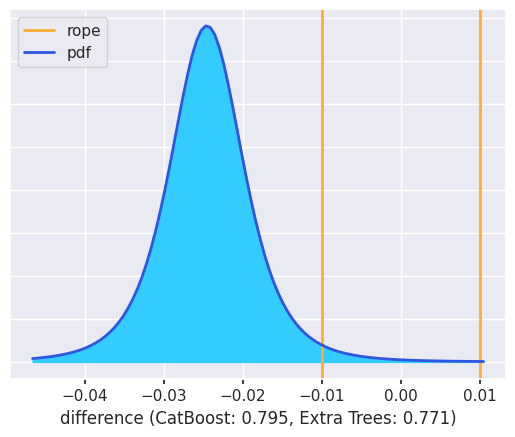

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmp77rn6f09
Comparación bayesiana entre Logistic Regression y Random Forest en Recall: (0.16113501128212707, 0.8081203515802466, 0.03074463713762632)


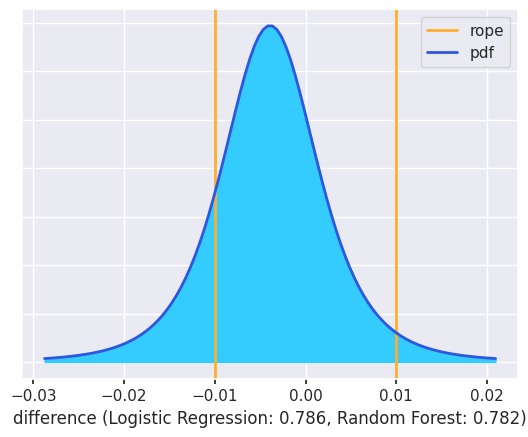

Comparación bayesiana entre Logistic Regression y Gradient Boosting en Recall: (0.019077380710409608, 0.6241222309962231, 0.35680038829336724)


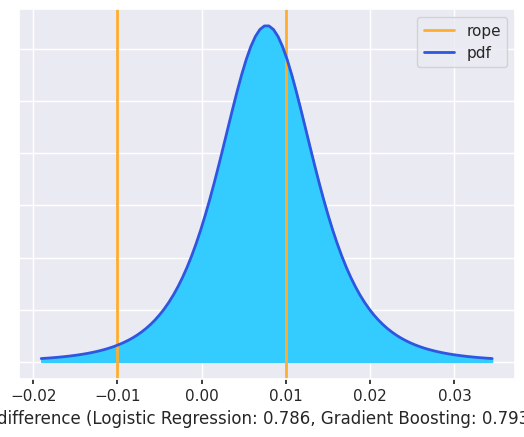

Comparación bayesiana entre Logistic Regression y XGBoost en Recall: (0.06263160106749045, 0.8920544743014899, 0.045313924631019686)


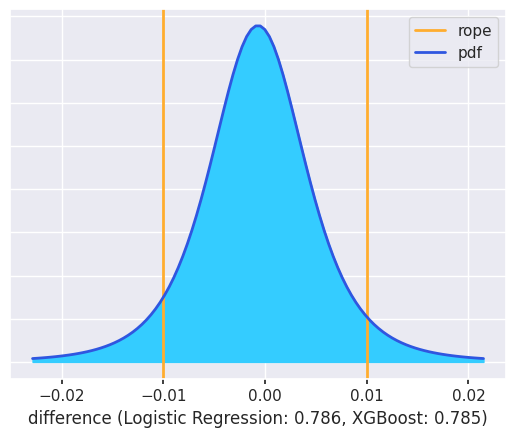

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en Recall: (0.1192412322981286, 0.7334309395187596, 0.14732782818311185)


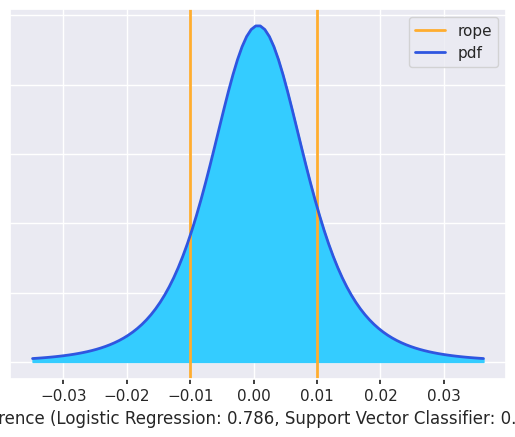

Comparación bayesiana entre Logistic Regression y KNN Classifier en Recall: (0.9652710272839424, 0.033468340082068226, 0.0012606326339893448)


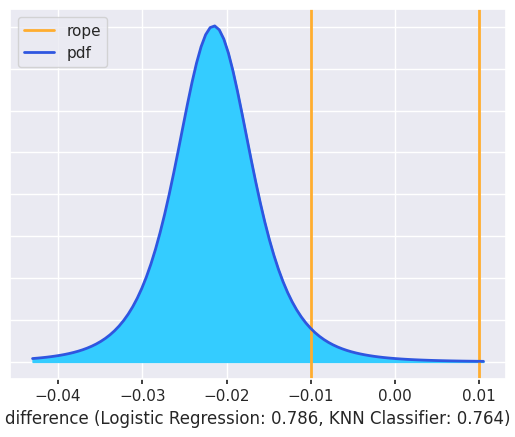

Comparación bayesiana entre Logistic Regression y Decision Tree en Recall: (0.9999388480999388, 4.472724446913379e-05, 1.6424655592039983e-05)


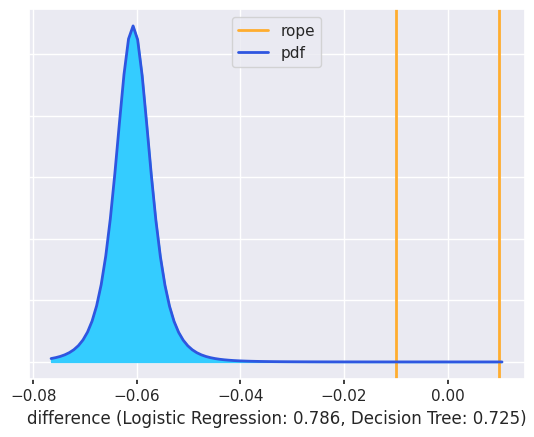

Comparación bayesiana entre Logistic Regression y AdaBoost en Recall: (0.04238122020107552, 0.9016278947608134, 0.055990885038111116)


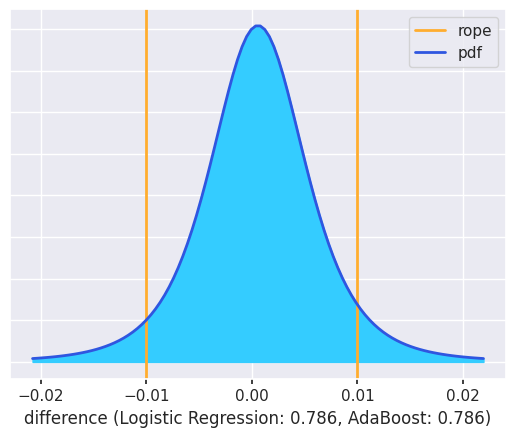

Comparación bayesiana entre Logistic Regression y CatBoost en Recall: (0.008796492887511127, 0.6247350795641432, 0.36646842754834563)


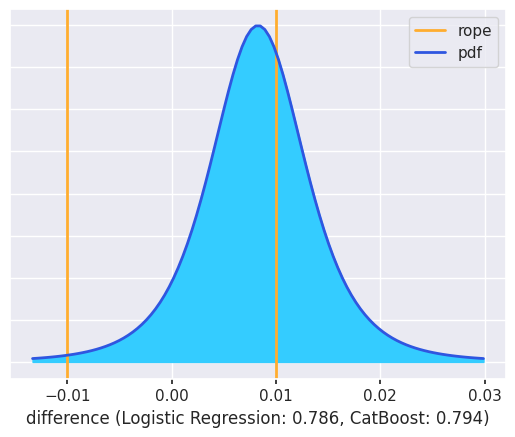

Comparación bayesiana entre Logistic Regression y Extra Trees en Recall: (0.8912560743448951, 0.10617880016935344, 0.002565125485751496)


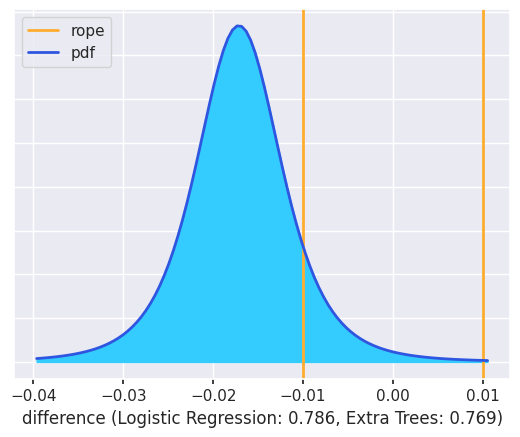

Comparación bayesiana entre Random Forest y Gradient Boosting en Recall: (0.008548293389072713, 0.3829867403180949, 0.6084649662928324)


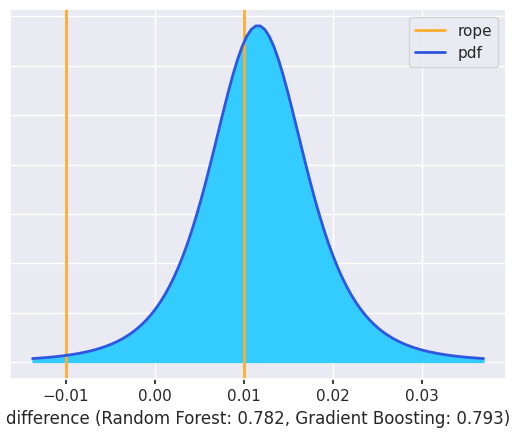

Comparación bayesiana entre Random Forest y XGBoost en Recall: (0.034184943947974646, 0.8293860703227703, 0.136428985729255)


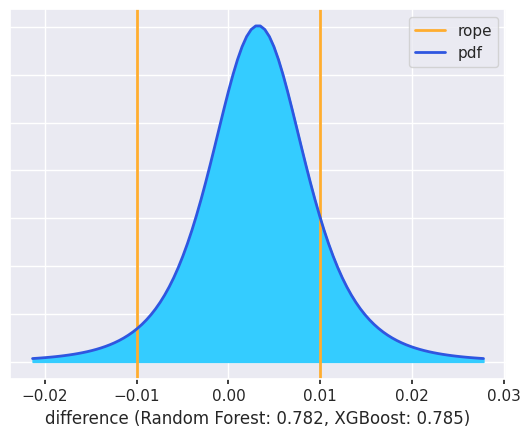

Comparación bayesiana entre Random Forest y Support Vector Classifier en Recall: (0.07465132890025981, 0.6522790130143922, 0.273069658085348)


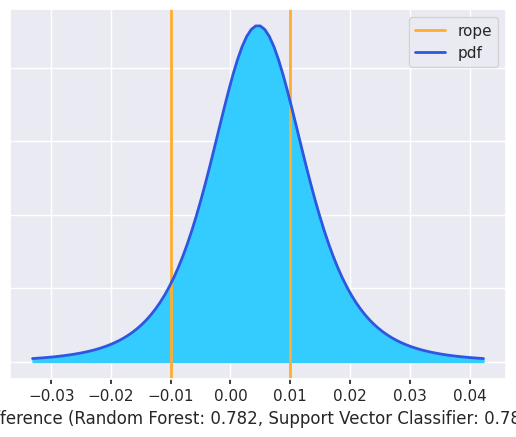

Comparación bayesiana entre Random Forest y KNN Classifier en Recall: (0.8177520733736637, 0.17193927470594939, 0.01030865192038688)


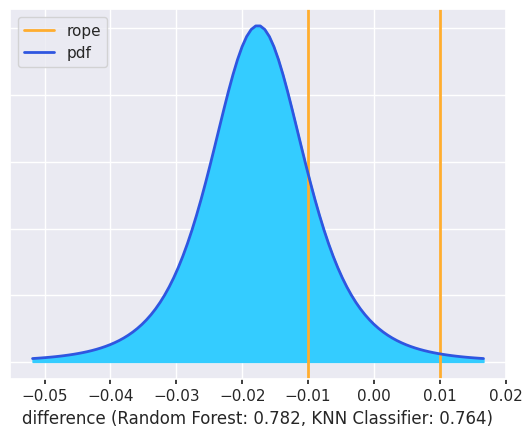

Comparación bayesiana entre Random Forest y Decision Tree en Recall: (0.9998246817011389, 0.00013193500482622245, 4.3383294034859965e-05)


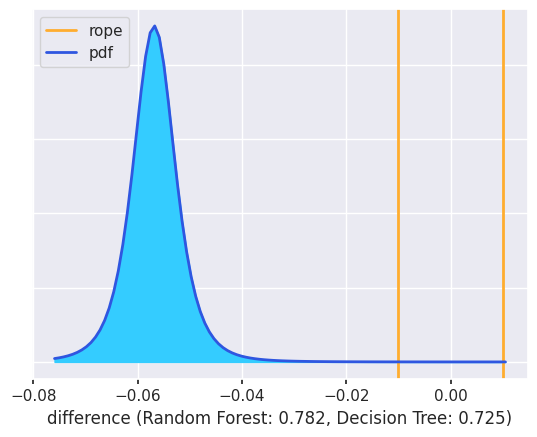

Comparación bayesiana entre Random Forest y AdaBoost en Recall: (0.044757584348933, 0.73340502343459, 0.22183739221647703)


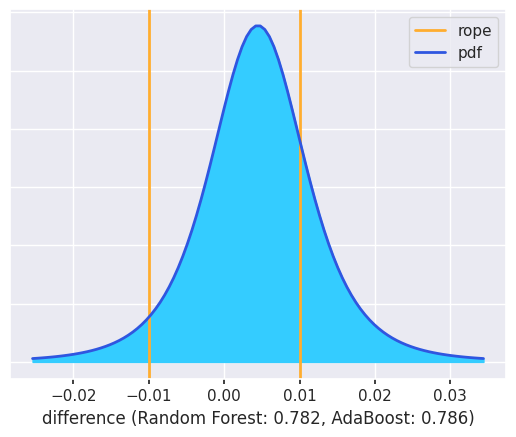

Comparación bayesiana entre Random Forest y CatBoost en Recall: (0.0008824586223020048, 0.2512511928585216, 0.7478663485191764)


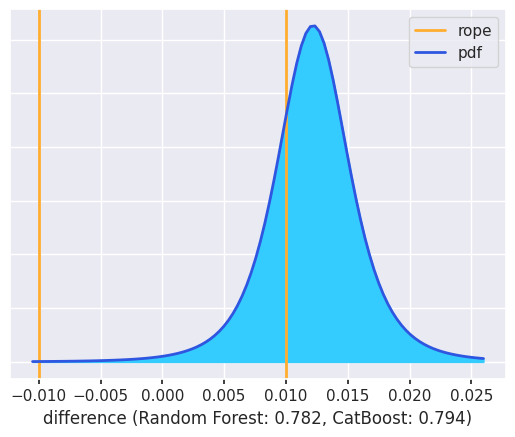

Comparación bayesiana entre Random Forest y Extra Trees en Recall: (0.7418074907197654, 0.25473251698144794, 0.003459992298786685)


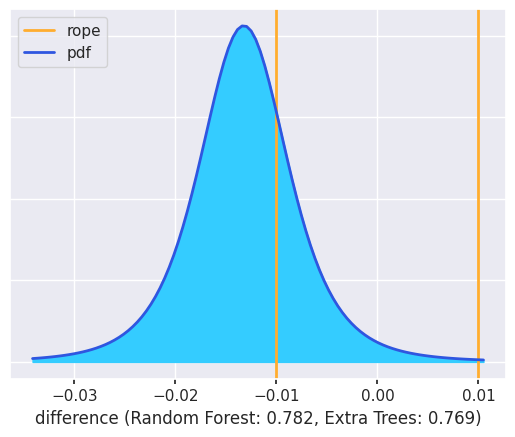

Comparación bayesiana entre Gradient Boosting y XGBoost en Recall: (0.3242907703239647, 0.6732885921826957, 0.00242063749333965)


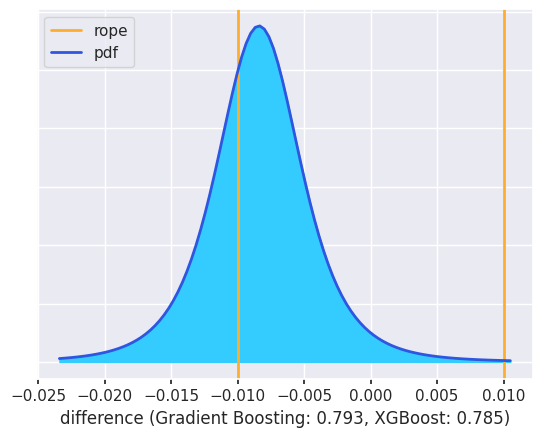

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en Recall: (0.3003155586755727, 0.6838024154524376, 0.015882025871989724)


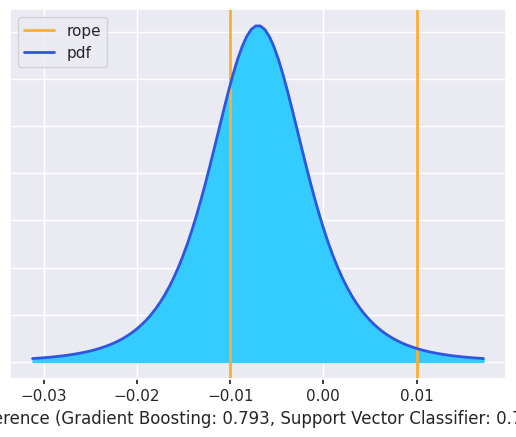

Comparación bayesiana entre Gradient Boosting y KNN Classifier en Recall: (0.9766327935442384, 0.021171344153391614, 0.002195862302370011)


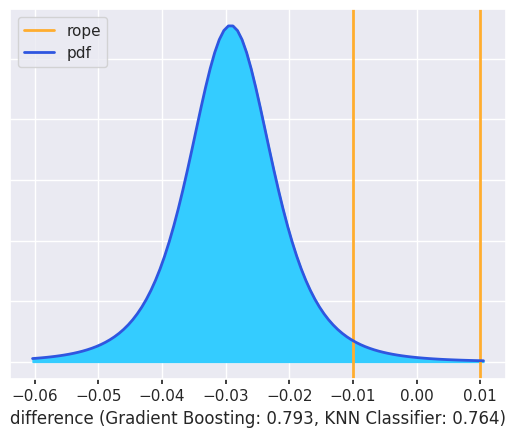

Comparación bayesiana entre Gradient Boosting y Decision Tree en Recall: (0.9995231113292344, 0.0003243158523014156, 0.00015257281846414728)


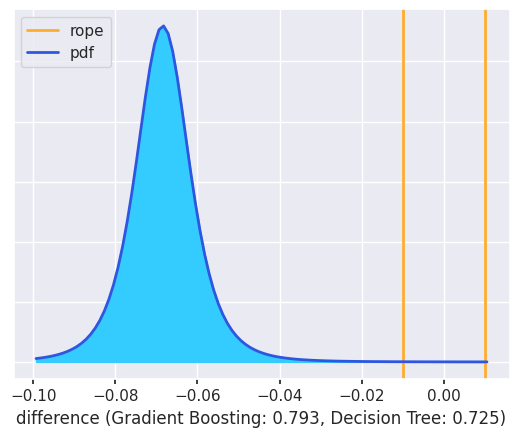

Comparación bayesiana entre Gradient Boosting y AdaBoost en Recall: (0.3128820715543096, 0.6698952043275631, 0.01722272411812731)


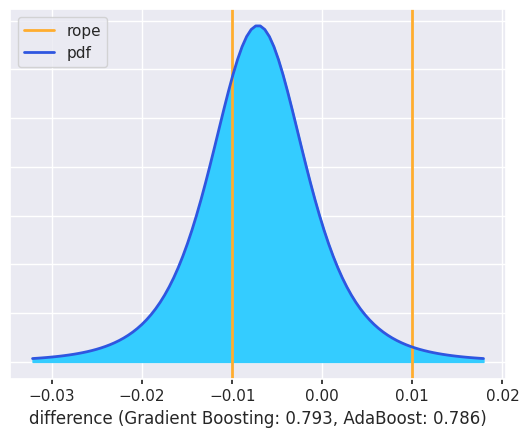

Comparación bayesiana entre Gradient Boosting y CatBoost en Recall: (0.049541137489213724, 0.8859198844422214, 0.0645389780685649)


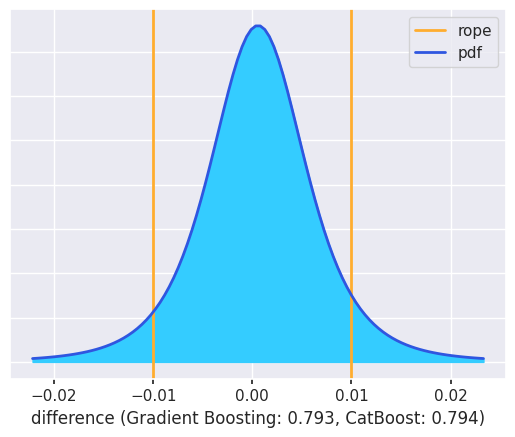

Comparación bayesiana entre Gradient Boosting y Extra Trees en Recall: (0.9324875411914255, 0.061601229321209594, 0.0059112294873648885)


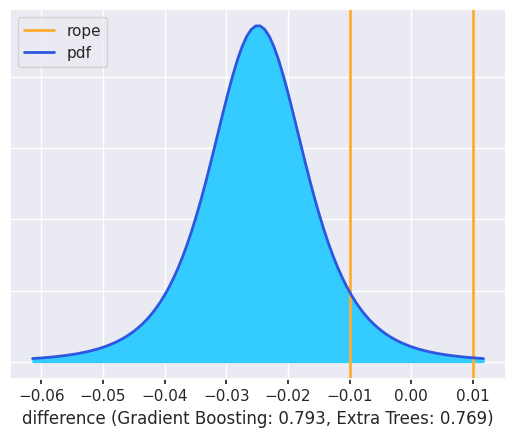

Comparación bayesiana entre XGBoost y Support Vector Classifier en Recall: (0.014510776315052345, 0.9529470487962506, 0.03254217488869704)


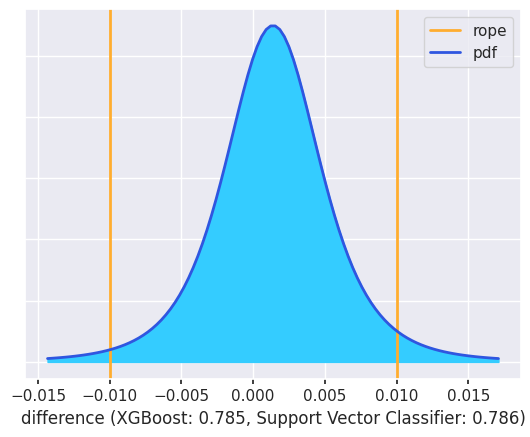

Comparación bayesiana entre XGBoost y KNN Classifier en Recall: (0.9300232070723502, 0.06679428019916411, 0.003182512728485687)


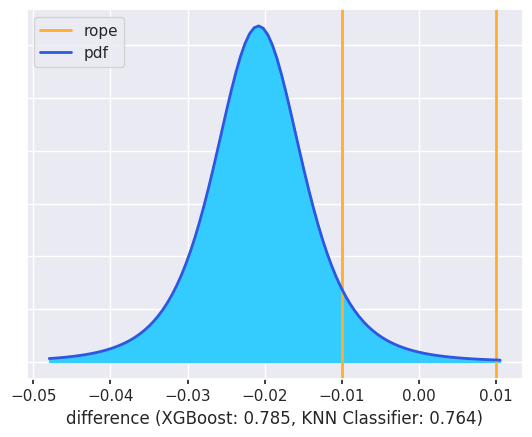

Comparación bayesiana entre XGBoost y Decision Tree en Recall: (0.9992638216402443, 0.0005341934031838358, 0.00020198495657186566)


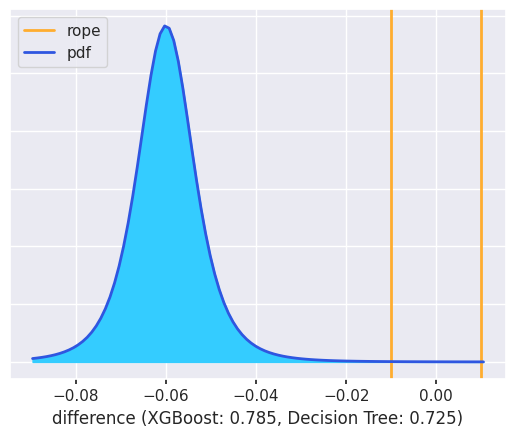

Comparación bayesiana entre XGBoost y AdaBoost en Recall: (0.06755417789839188, 0.8219460242821457, 0.1104997978194624)


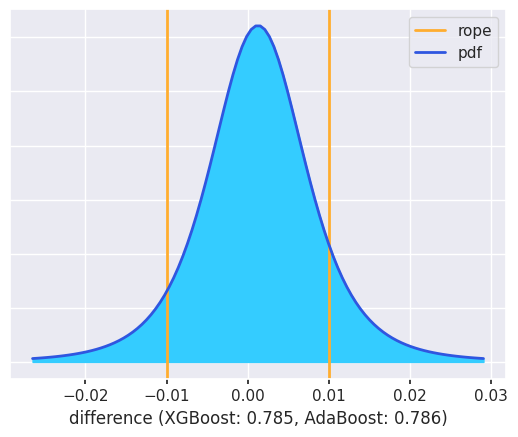

Comparación bayesiana entre XGBoost y CatBoost en Recall: (0.00661139066967489, 0.5787242382277393, 0.4146643711025858)


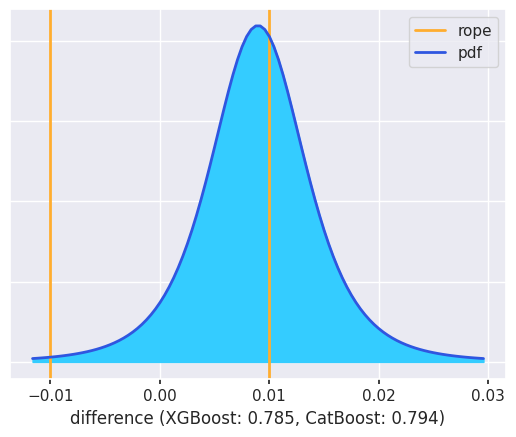

Comparación bayesiana entre XGBoost y Extra Trees en Recall: (0.7709461533068289, 0.2149427781441703, 0.014111068549000794)


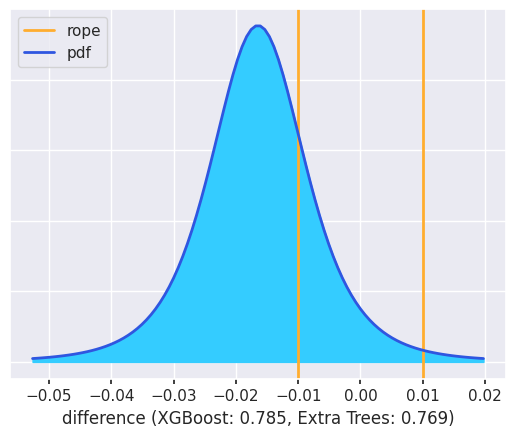

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en Recall: (0.9221196863888729, 0.07289209161620491, 0.004988221994922215)


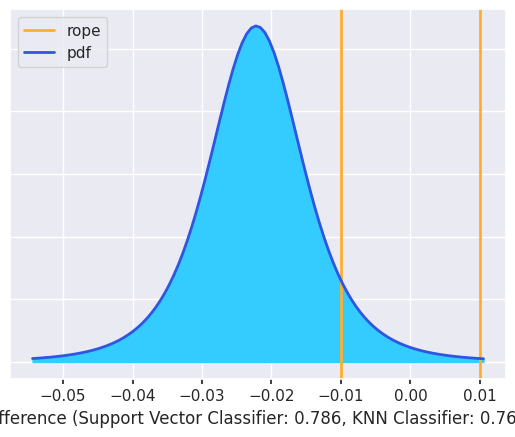

Comparación bayesiana entre Support Vector Classifier y Decision Tree en Recall: (0.9974887474259477, 0.0017698117792352974, 0.0007414407948169721)


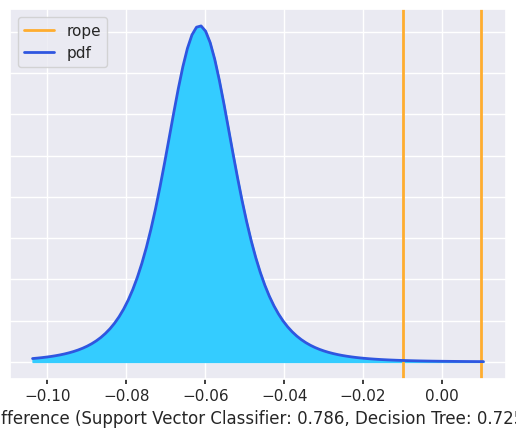

Comparación bayesiana entre Support Vector Classifier y AdaBoost en Recall: (0.13619102148646314, 0.7323595560696018, 0.1314494224439351)


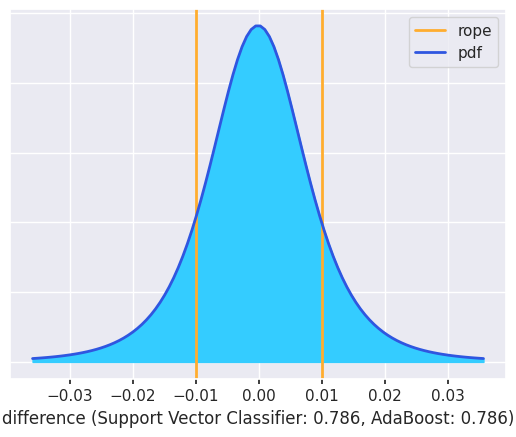

Comparación bayesiana entre Support Vector Classifier y CatBoost en Recall: (0.04290231353771754, 0.5713970757757865, 0.38570061068649597)


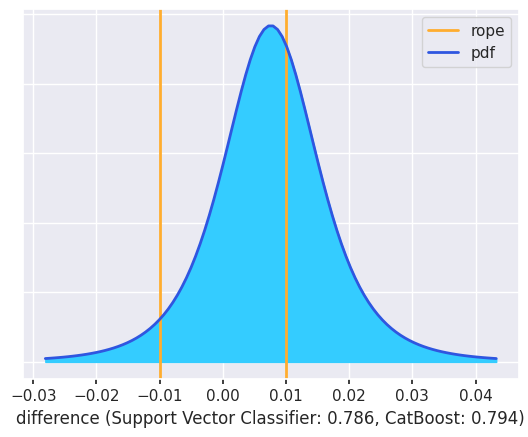

Comparación bayesiana entre Support Vector Classifier y Extra Trees en Recall: (0.7487891400035078, 0.2216878116937433, 0.029523048302748878)


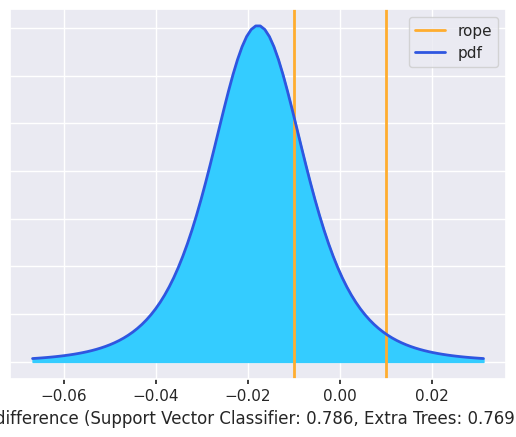

Comparación bayesiana entre KNN Classifier y Decision Tree en Recall: (0.997953962483689, 0.0017608168955963732, 0.0002852206207146768)


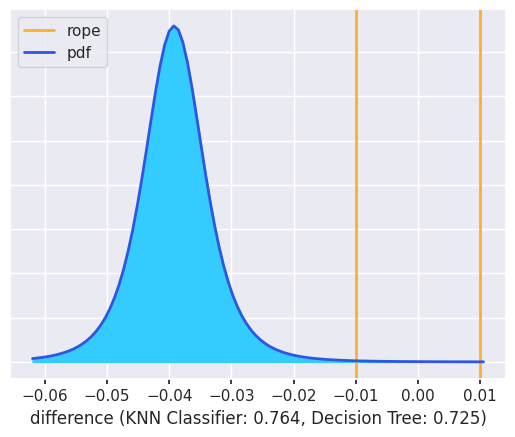

Comparación bayesiana entre KNN Classifier y AdaBoost en Recall: (0.00019818566807415077, 0.00709989957758983, 0.992701914754336)


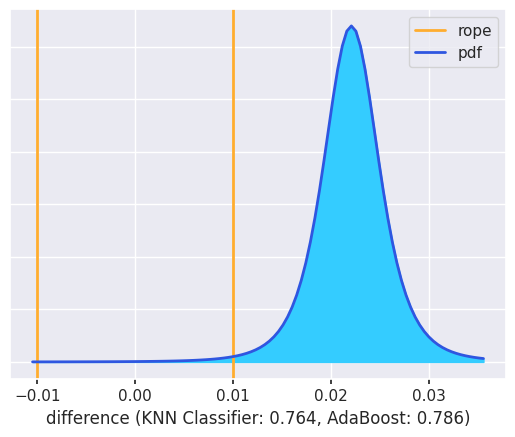

Comparación bayesiana entre KNN Classifier y CatBoost en Recall: (0.00400247156466828, 0.03157680750474934, 0.9644207209305824)


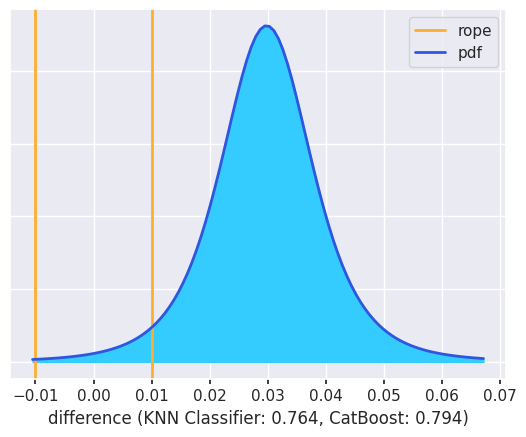

Comparación bayesiana entre KNN Classifier y Extra Trees en Recall: (0.04197719602427465, 0.747761763523207, 0.21026104045251837)


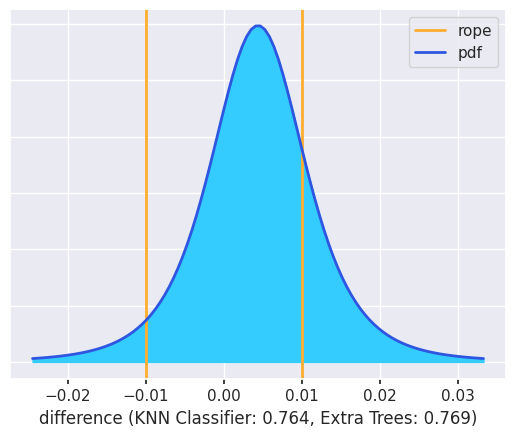

Comparación bayesiana entre Decision Tree y AdaBoost en Recall: (3.281500558208479e-05, 8.712653530928982e-05, 0.9998800584591087)


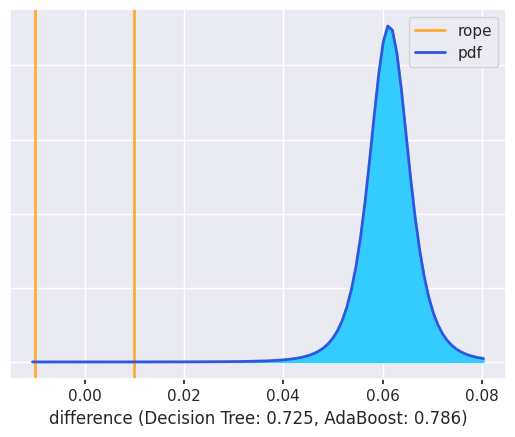

Comparación bayesiana entre Decision Tree y CatBoost en Recall: (6.24405566714348e-05, 0.00013345924448493474, 0.9998041001988436)


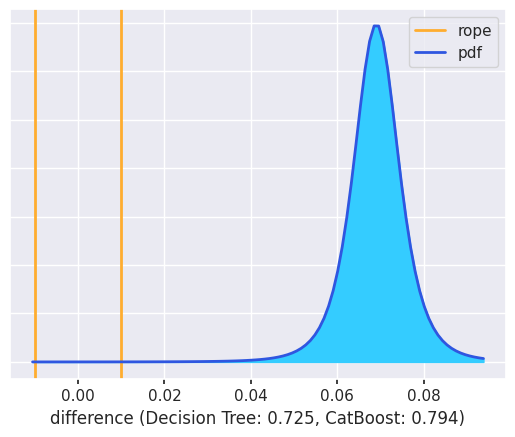

Comparación bayesiana entre Decision Tree y Extra Trees en Recall: (2.4792030429543403e-06, 1.3428202190635119e-05, 0.9999840925947664)


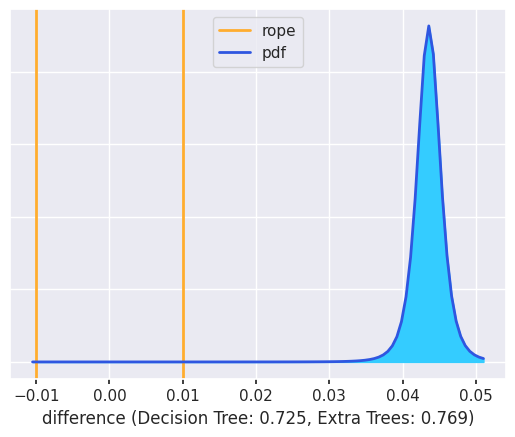

Comparación bayesiana entre AdaBoost y CatBoost en Recall: (0.03648444794530915, 0.5785830646678075, 0.38493248738688335)


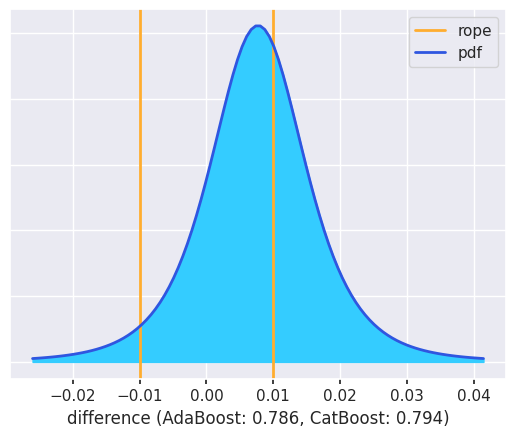

Comparación bayesiana entre AdaBoost y Extra Trees en Recall: (0.890115954163111, 0.10667126364838742, 0.0032127821885016283)


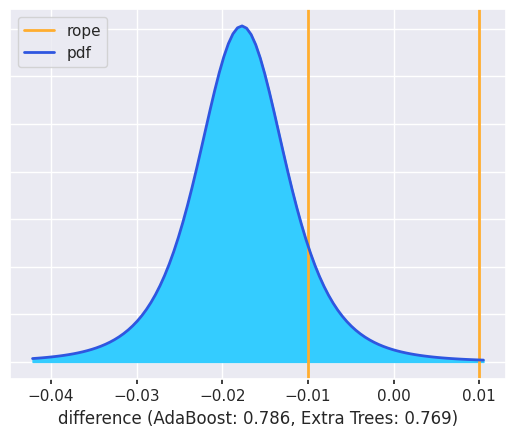

Comparación bayesiana entre CatBoost y Extra Trees en Recall: (0.9663959765716805, 0.03130397391799733, 0.002300049510322144)


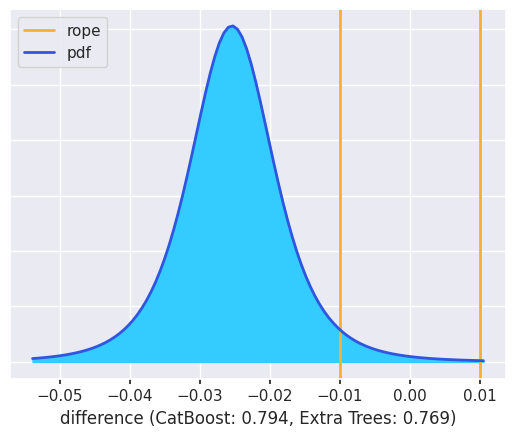

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmpydqmmnhk
Comparación bayesiana entre Logistic Regression y Random Forest en F1 Score: (0.14078034586556878, 0.8284418652100574, 0.030777788924373883)


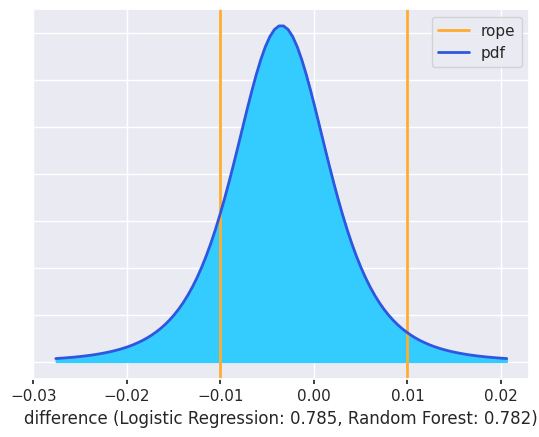

Comparación bayesiana entre Logistic Regression y Gradient Boosting en F1 Score: (0.018380029150099366, 0.6177521971939962, 0.3638677736559044)


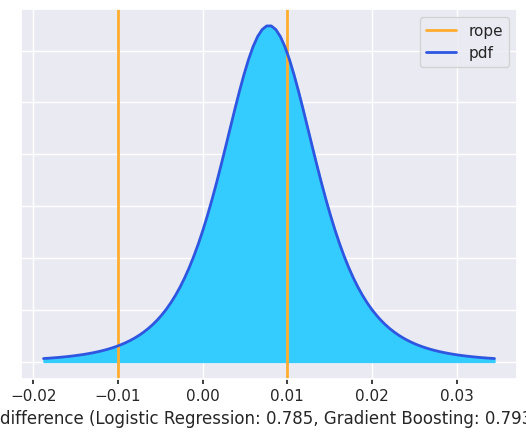

Comparación bayesiana entre Logistic Regression y XGBoost en F1 Score: (0.051650472800263886, 0.9035016933836365, 0.04484783381609958)


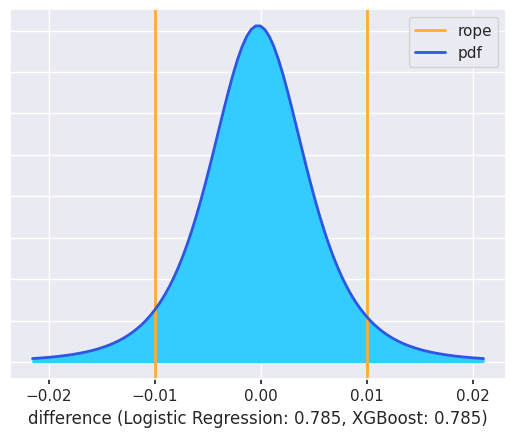

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en F1 Score: (0.1526327389433115, 0.7221808525100609, 0.12518640854662755)


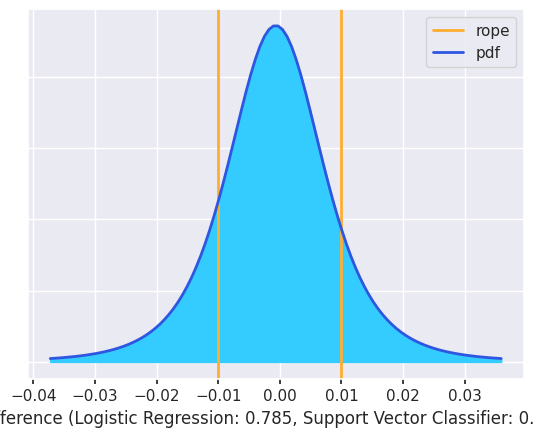

Comparación bayesiana entre Logistic Regression y KNN Classifier en F1 Score: (0.9588299545432266, 0.039694204407698, 0.0014758410490753882)


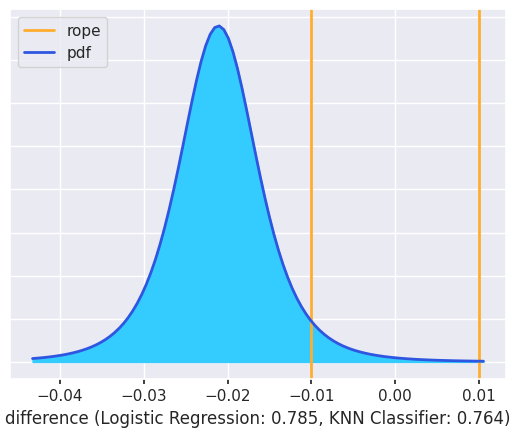

Comparación bayesiana entre Logistic Regression y Decision Tree en F1 Score: (0.9999268214643656, 5.360989022296092e-05, 1.956864541141634e-05)


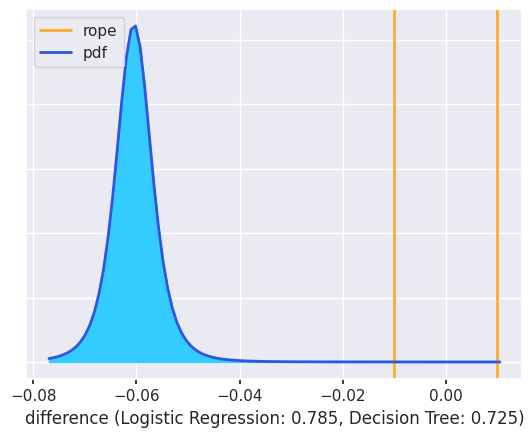

Comparación bayesiana entre Logistic Regression y AdaBoost en F1 Score: (0.04282258611753746, 0.8967208863403353, 0.06045652754212727)


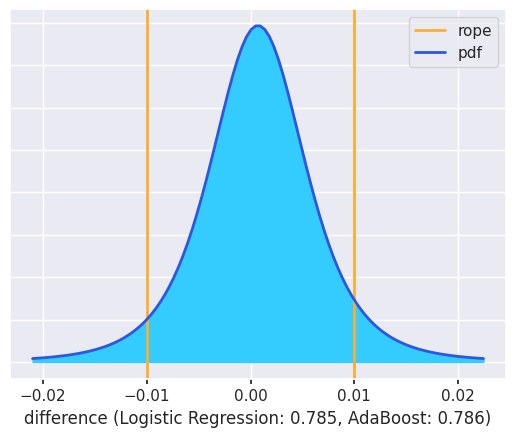

Comparación bayesiana entre Logistic Regression y CatBoost en F1 Score: (0.0076312632845904034, 0.6052561444336083, 0.3871125922818013)


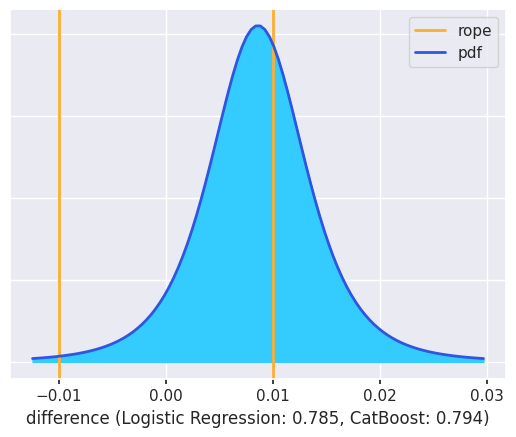

Comparación bayesiana entre Logistic Regression y Extra Trees en F1 Score: (0.8765883664807539, 0.12031833701473915, 0.0030932965045069594)


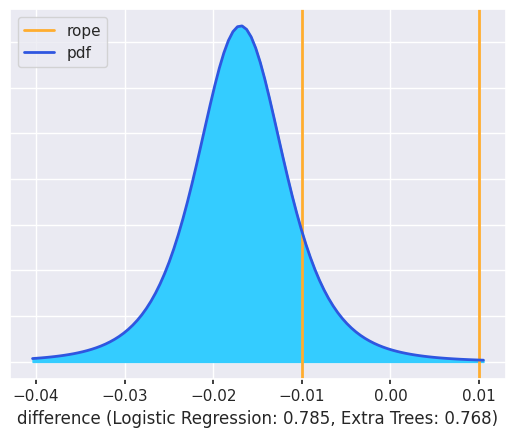

Comparación bayesiana entre Random Forest y Gradient Boosting en F1 Score: (0.008409731886036768, 0.4004267926081271, 0.5911634755058361)


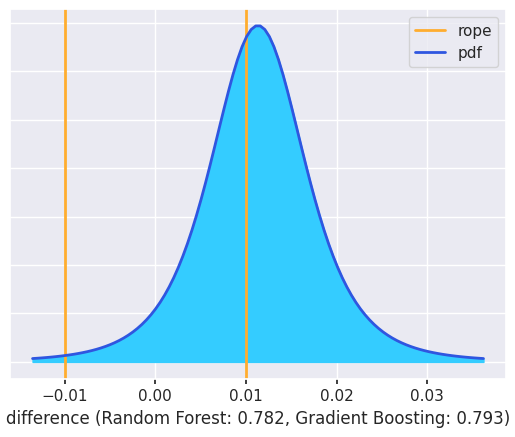

Comparación bayesiana entre Random Forest y XGBoost en F1 Score: (0.03559893474560809, 0.825921774755942, 0.13847929049844998)


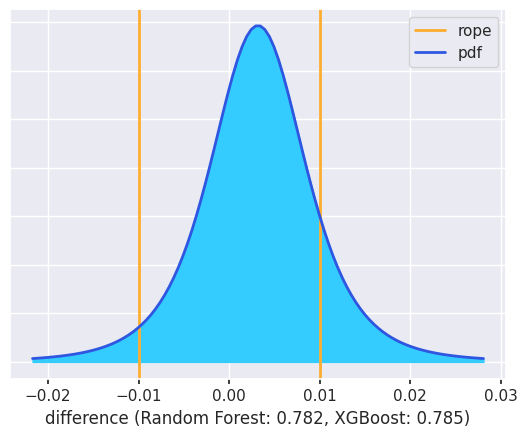

Comparación bayesiana entre Random Forest y Support Vector Classifier en F1 Score: (0.1028677755427093, 0.6743412773415229, 0.22279094711576775)


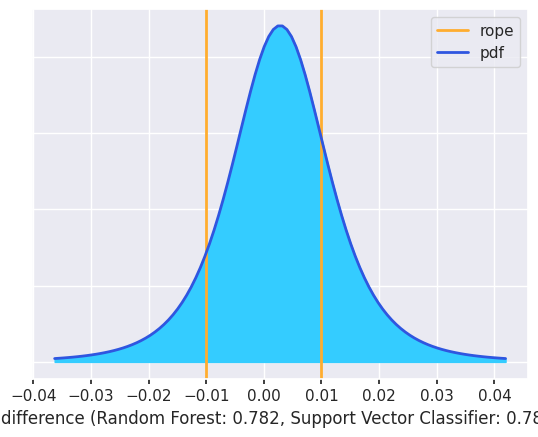

Comparación bayesiana entre Random Forest y KNN Classifier en F1 Score: (0.8200200660017553, 0.16998989539134812, 0.009990038606896623)


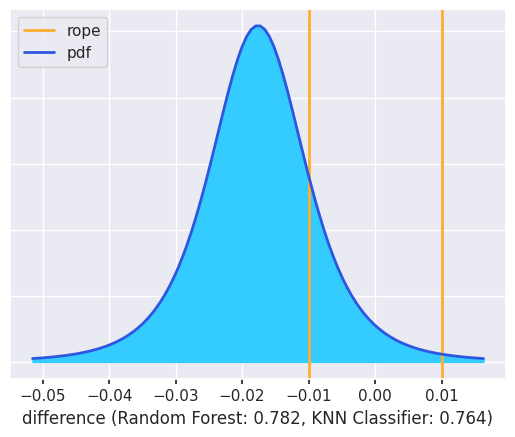

Comparación bayesiana entre Random Forest y Decision Tree en F1 Score: (0.9998539598581658, 0.00010983752479698516, 3.6202617037184304e-05)


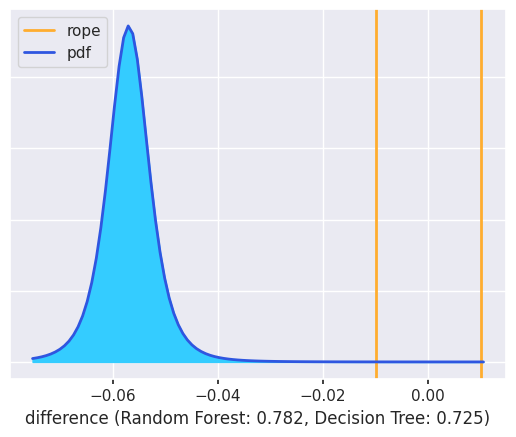

Comparación bayesiana entre Random Forest y AdaBoost en F1 Score: (0.04169163360156994, 0.756868579448356, 0.20143978695007414)


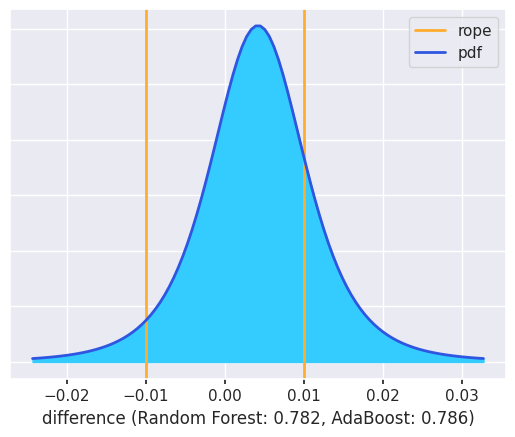

Comparación bayesiana entre Random Forest y CatBoost en F1 Score: (0.0010305513157673298, 0.26815847938220805, 0.7308109693020246)


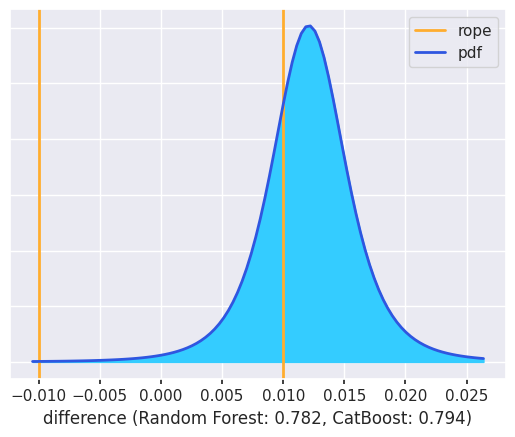

Comparación bayesiana entre Random Forest y Extra Trees en F1 Score: (0.7469752784614645, 0.24925788075824318, 0.0037668407802923243)


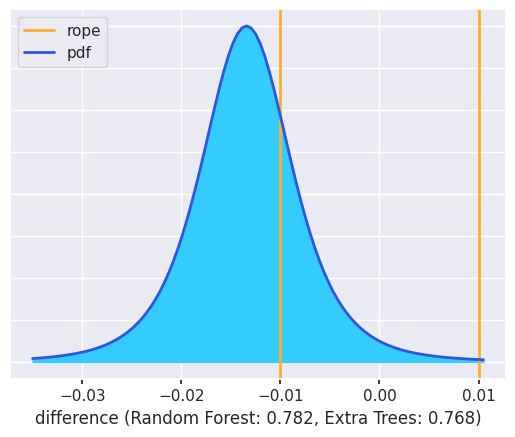

Comparación bayesiana entre Gradient Boosting y XGBoost en F1 Score: (0.2941416374668183, 0.703520810444831, 0.002337552088350736)


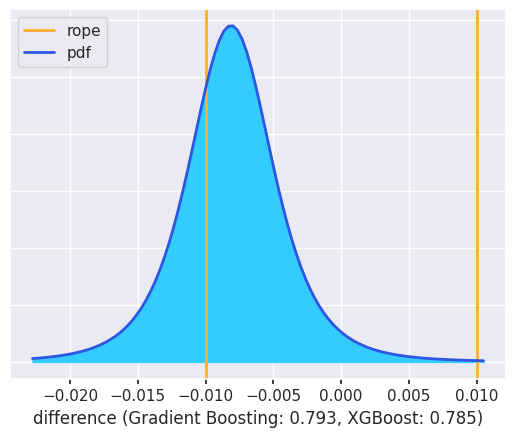

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en F1 Score: (0.40197510127965697, 0.582947474711116, 0.01507742400922707)


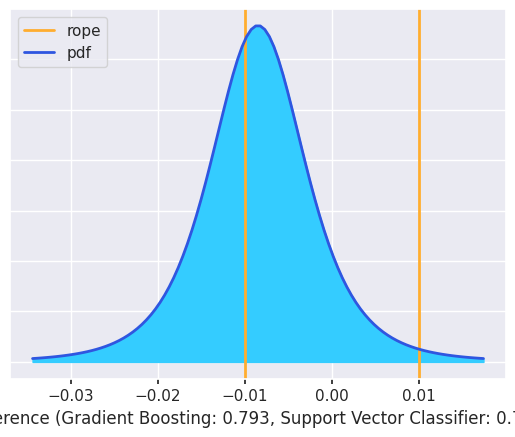

Comparación bayesiana entre Gradient Boosting y KNN Classifier en F1 Score: (0.9740259543493924, 0.023528825309419132, 0.0024452203411884366)


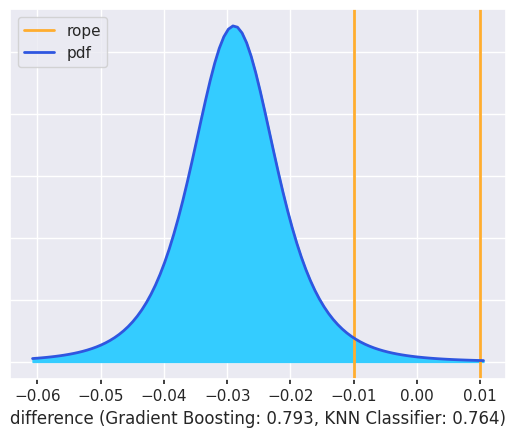

Comparación bayesiana entre Gradient Boosting y Decision Tree en F1 Score: (0.9994820638466148, 0.00035233235215181846, 0.0001656038012334271)


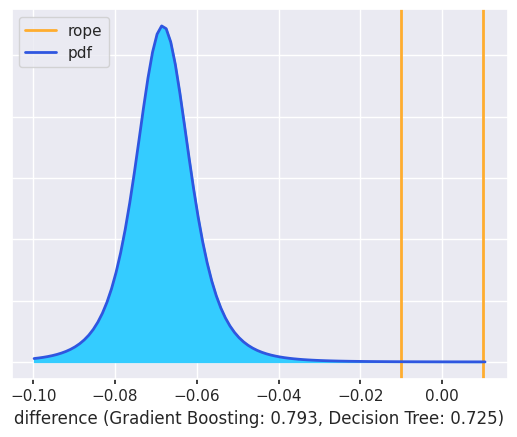

Comparación bayesiana entre Gradient Boosting y AdaBoost en F1 Score: (0.31338288025029193, 0.6688935370548291, 0.017723582694878948)


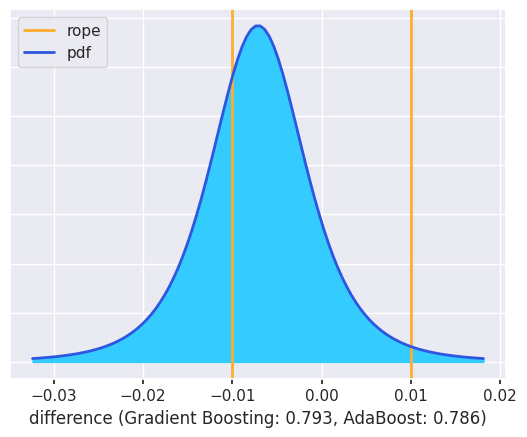

Comparación bayesiana entre Gradient Boosting y CatBoost en F1 Score: (0.046413922918235956, 0.8876401593587726, 0.06594591772299141)


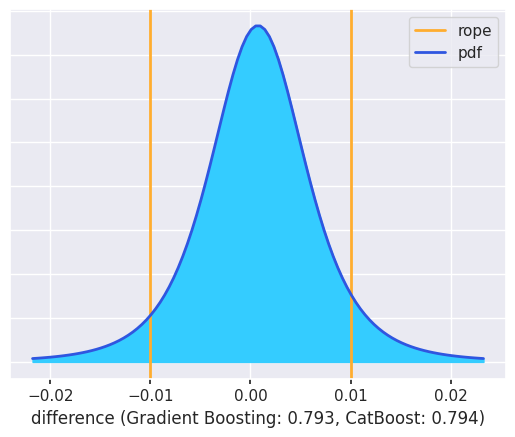

Comparación bayesiana entre Gradient Boosting y Extra Trees en F1 Score: (0.9280064472853184, 0.06552681435682184, 0.006466738357859714)


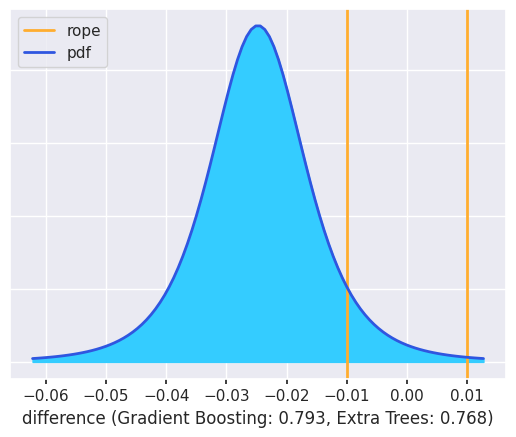

Comparación bayesiana entre XGBoost y Support Vector Classifier en F1 Score: (0.03026597198417033, 0.9452264768353216, 0.02450755118050807)


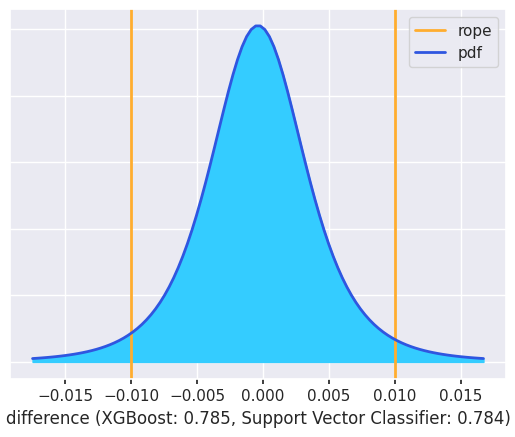

Comparación bayesiana entre XGBoost y KNN Classifier en F1 Score: (0.9280940688537735, 0.06858456819628822, 0.0033213629499382336)


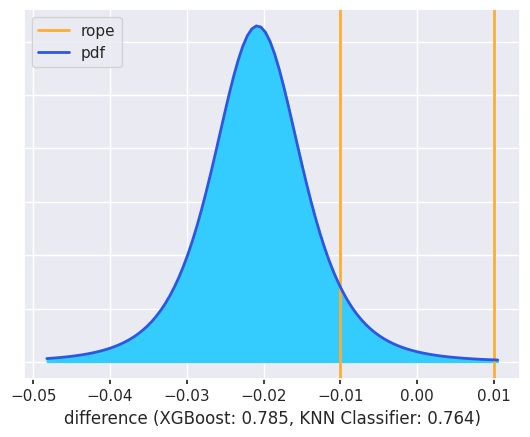

Comparación bayesiana entre XGBoost y Decision Tree en F1 Score: (0.9992290382068264, 0.00055853270959072, 0.00021242908358287682)


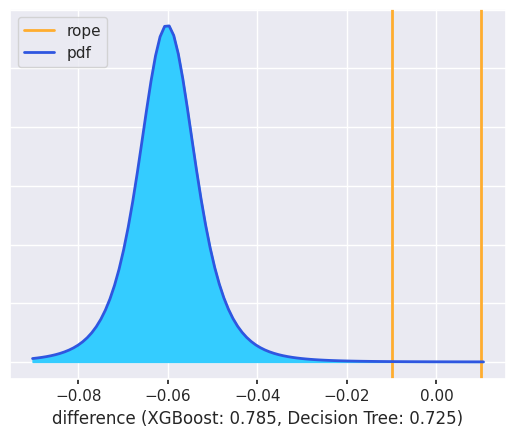

Comparación bayesiana entre XGBoost y AdaBoost en F1 Score: (0.06712830725243485, 0.8323289820335112, 0.10054271071405385)


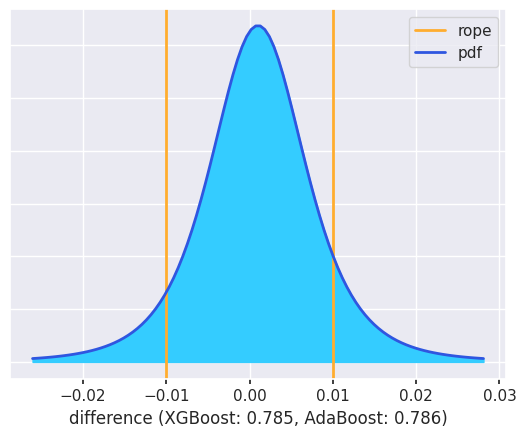

Comparación bayesiana entre XGBoost y CatBoost en F1 Score: (0.006904619992944101, 0.5844633888055135, 0.40863199120154237)


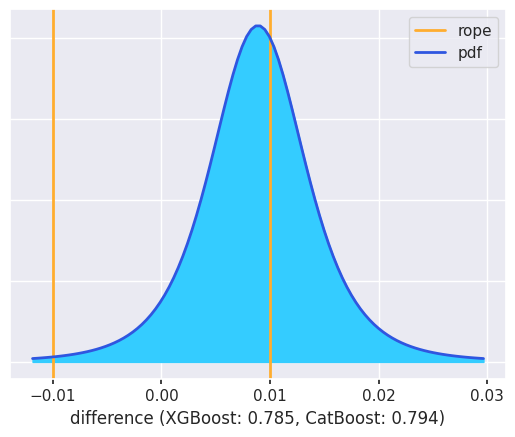

Comparación bayesiana entre XGBoost y Extra Trees en F1 Score: (0.7707292170693707, 0.2142268361643449, 0.0150439467662844)


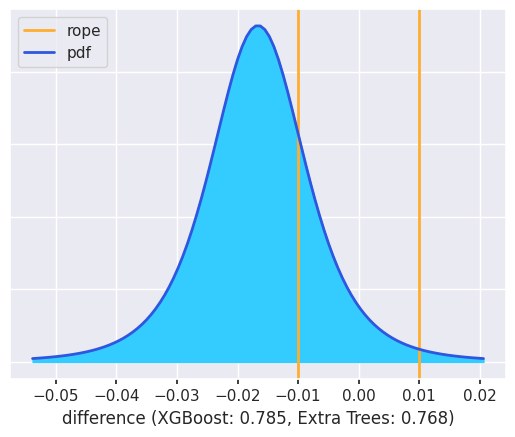

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en F1 Score: (0.8789160161770242, 0.1130255639251444, 0.008058419897831404)


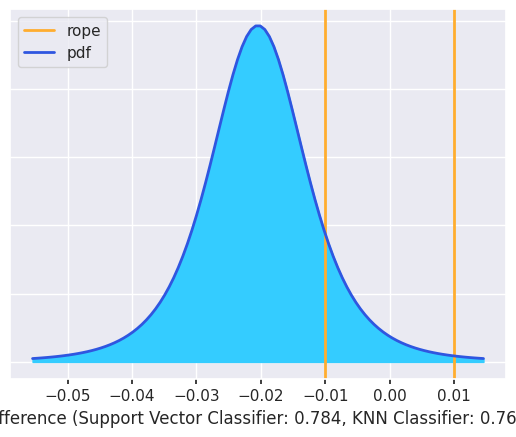

Comparación bayesiana entre Support Vector Classifier y Decision Tree en F1 Score: (0.9965544473855569, 0.0024461784237729267, 0.0009993741906701992)


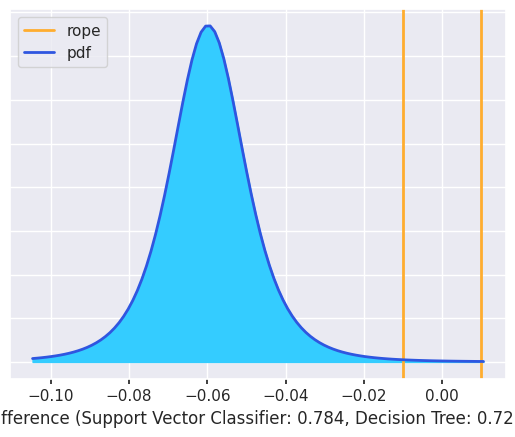

Comparación bayesiana entre Support Vector Classifier y AdaBoost en F1 Score: (0.11915466706122024, 0.7036426304080959, 0.17720270253068382)


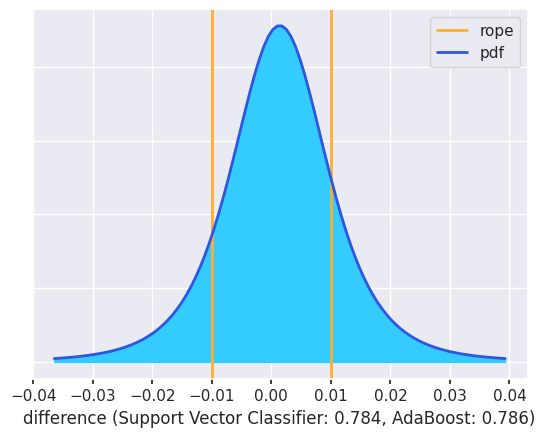

Comparación bayesiana entre Support Vector Classifier y CatBoost en F1 Score: (0.03596027459588586, 0.498731532524458, 0.4653081928796561)


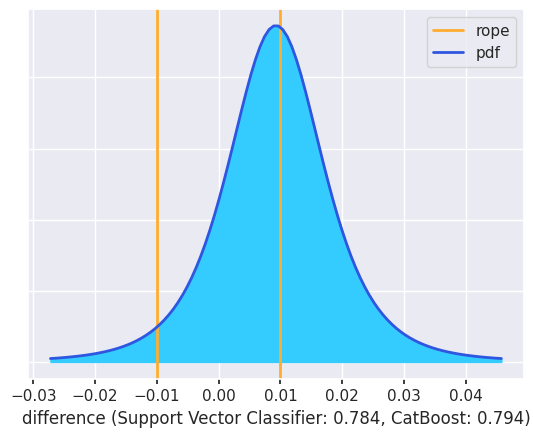

Comparación bayesiana entre Support Vector Classifier y Extra Trees en F1 Score: (0.6961174412720228, 0.26408191513101287, 0.039800643596964336)


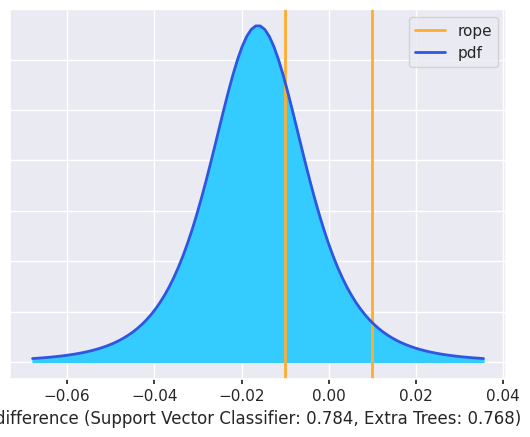

Comparación bayesiana entre KNN Classifier y Decision Tree en F1 Score: (0.997744669772747, 0.0019365136012916562, 0.00031881662596133786)


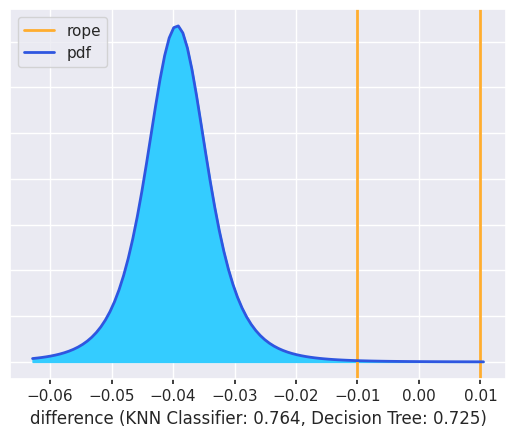

Comparación bayesiana entre KNN Classifier y AdaBoost en F1 Score: (0.00018002671262313277, 0.00685745936698301, 0.9929625139203938)


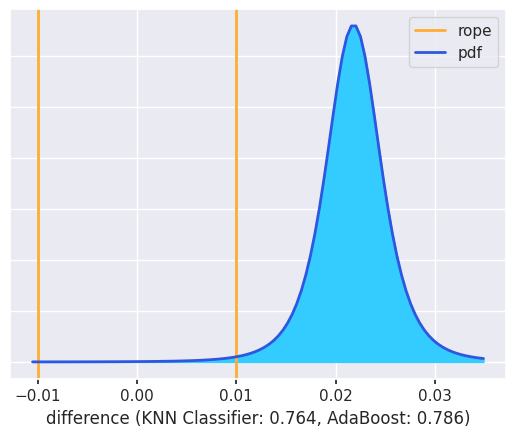

Comparación bayesiana entre KNN Classifier y CatBoost en F1 Score: (0.004236977756933929, 0.03312561954986104, 0.9626374026932051)


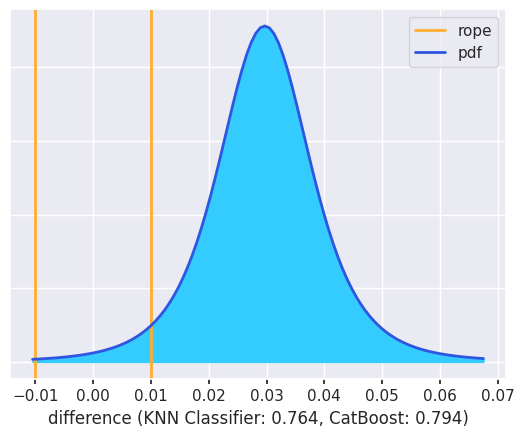

Comparación bayesiana entre KNN Classifier y Extra Trees en F1 Score: (0.042514910842988696, 0.7557624725543828, 0.20172261660262847)


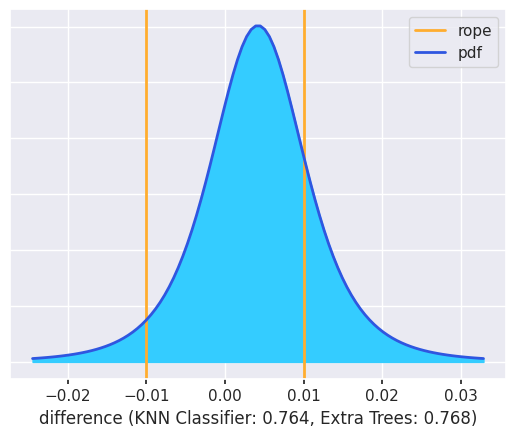

Comparación bayesiana entre Decision Tree y AdaBoost en F1 Score: (3.5346344889012264e-05, 9.406216517038324e-05, 0.9998705914899406)


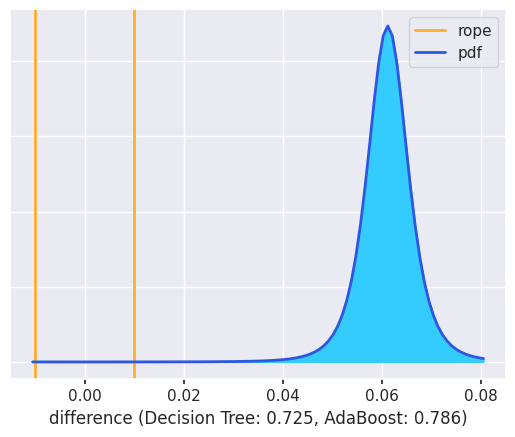

Comparación bayesiana entre Decision Tree y CatBoost en F1 Score: (6.371679821615452e-05, 0.00013596074026978044, 0.9998003224615141)


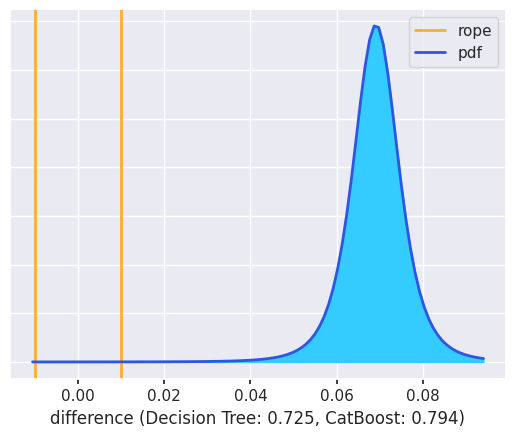

Comparación bayesiana entre Decision Tree y Extra Trees en F1 Score: (2.568604956905697e-06, 1.3933352128514542e-05, 0.9999834980429145)


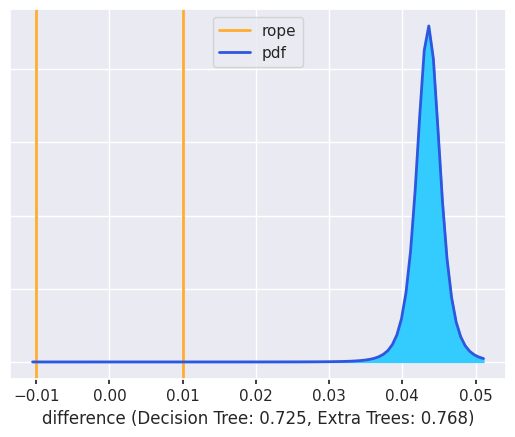

Comparación bayesiana entre AdaBoost y CatBoost en F1 Score: (0.035047287674978576, 0.5725639785388412, 0.3923887337861802)


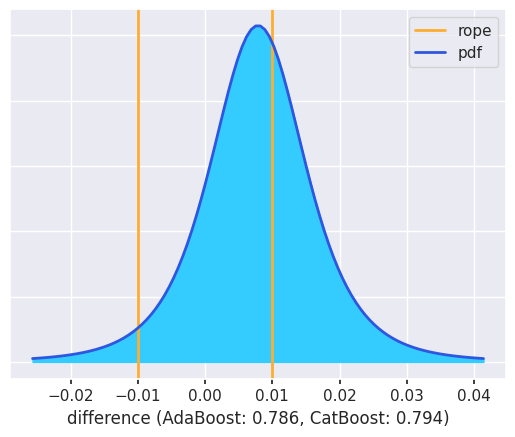

Comparación bayesiana entre AdaBoost y Extra Trees en F1 Score: (0.8929395406745034, 0.10409771929341205, 0.002962740032084521)


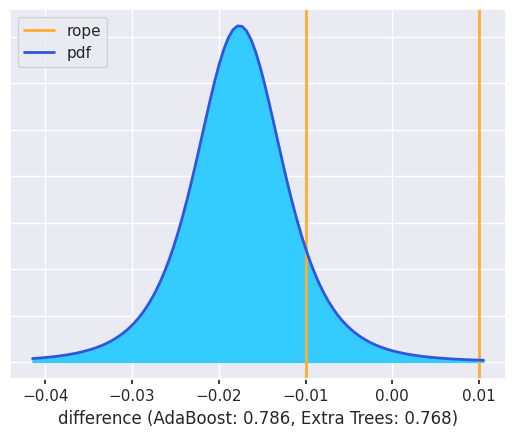

Comparación bayesiana entre CatBoost y Extra Trees en F1 Score: (0.9618576179320742, 0.03537255825363683, 0.0027698238142889187)


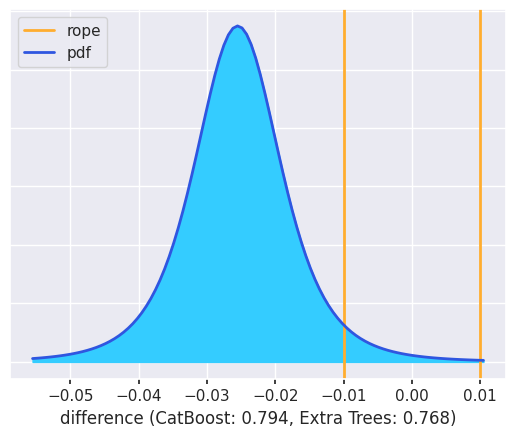

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmpscuz467z
Comparación bayesiana entre Logistic Regression y Random Forest en ROC AUC: (0.5559543258399271, 0.4370030328665596, 0.007042641293513285)


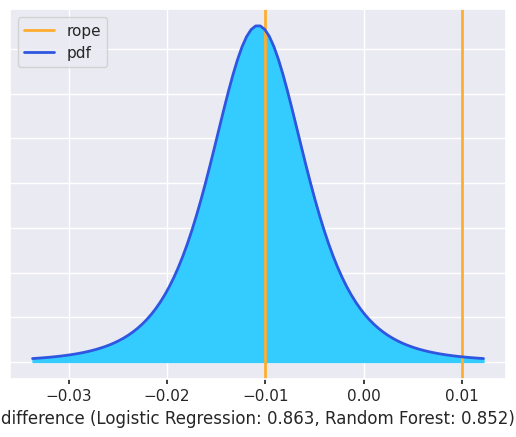

Comparación bayesiana entre Logistic Regression y Gradient Boosting en ROC AUC: (0.001581964581010732, 0.09989900381695271, 0.8985190316020365)


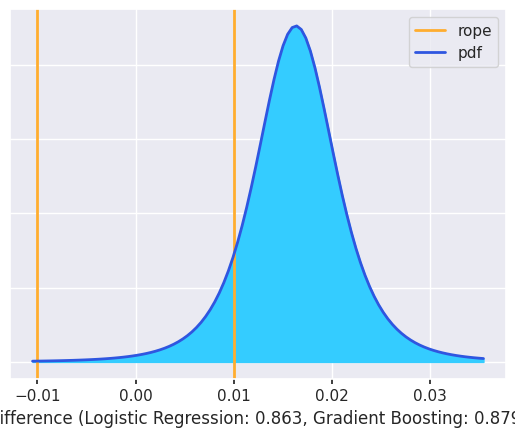

Comparación bayesiana entre Logistic Regression y XGBoost en ROC AUC: (0.014116182237796092, 0.699399220003034, 0.2864845977591699)


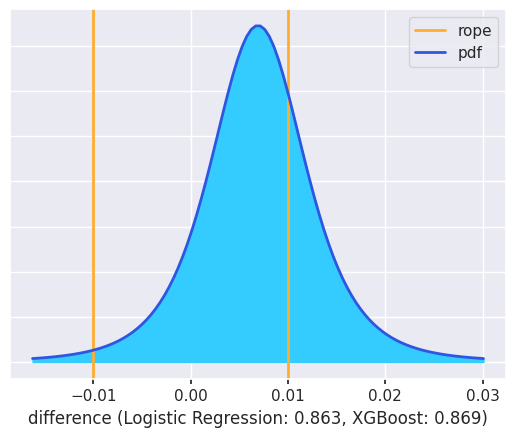

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en ROC AUC: (0.920994207459778, 0.075329998561108, 0.003675793979113995)


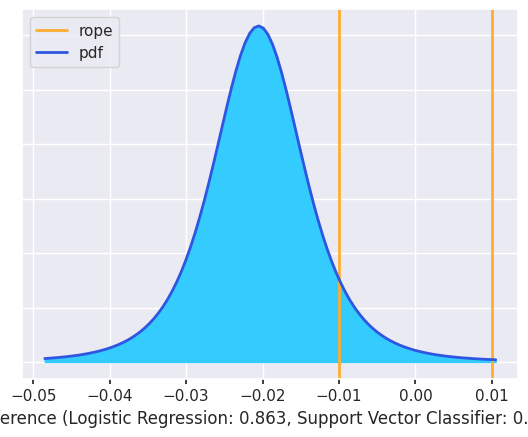

Comparación bayesiana entre Logistic Regression y KNN Classifier en ROC AUC: (0.9959124613609843, 0.0037094245907728363, 0.0003781140482428391)


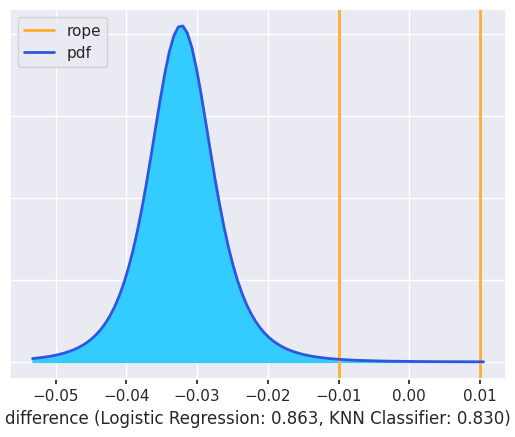

Comparación bayesiana entre Logistic Regression y Decision Tree en ROC AUC: (0.9999563733937009, 2.0510471075430026e-05, 2.31161352236553e-05)


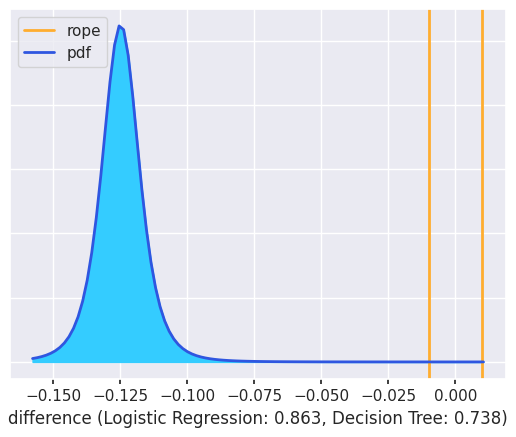

Comparación bayesiana entre Logistic Regression y AdaBoost en ROC AUC: (0.009936274160607684, 0.6758119478722375, 0.31425177796715476)


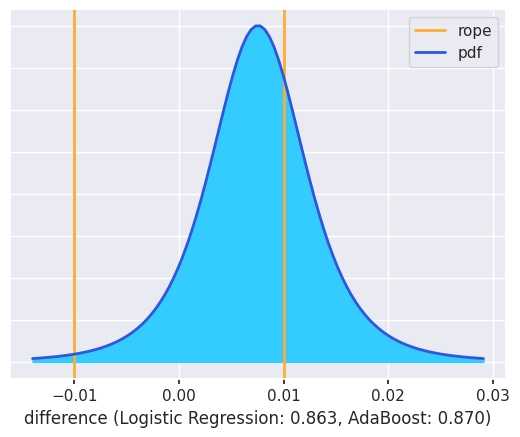

Comparación bayesiana entre Logistic Regression y CatBoost en ROC AUC: (0.0019257274901821957, 0.08535019160155966, 0.9127240809082582)


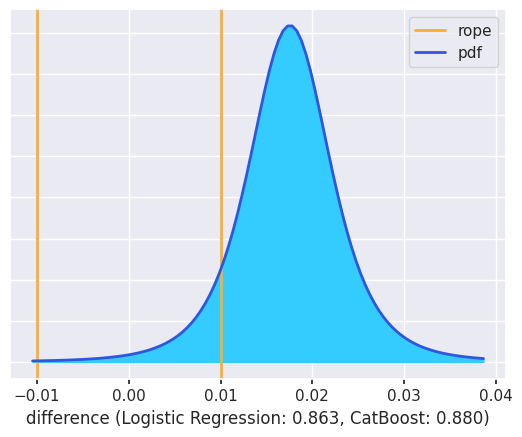

Comparación bayesiana entre Logistic Regression y Extra Trees en ROC AUC: (0.9950419892924254, 0.004522785295825393, 0.00043522541174922935)


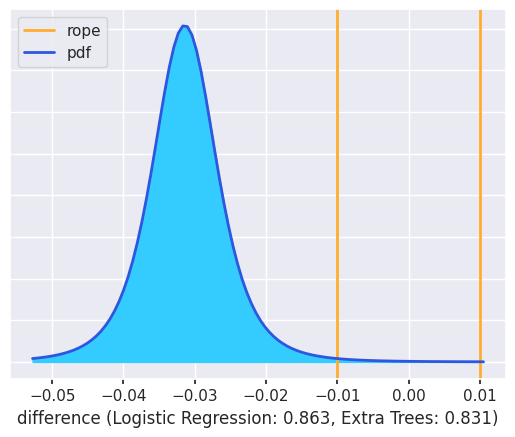

Comparación bayesiana entre Random Forest y Gradient Boosting en ROC AUC: (0.0012276900127926877, 0.016441403446285197, 0.9823309065409221)


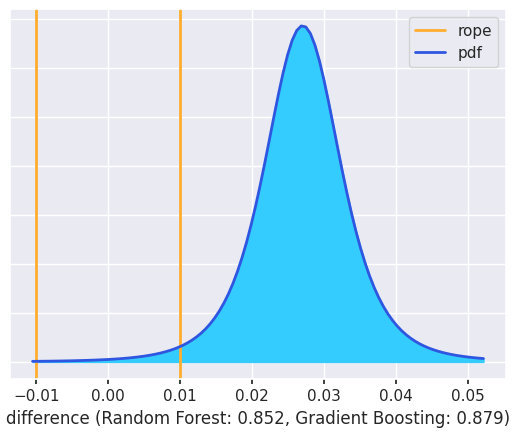

Comparación bayesiana entre Random Forest y XGBoost en ROC AUC: (0.004768316984438517, 0.12806615661176857, 0.867165526403793)


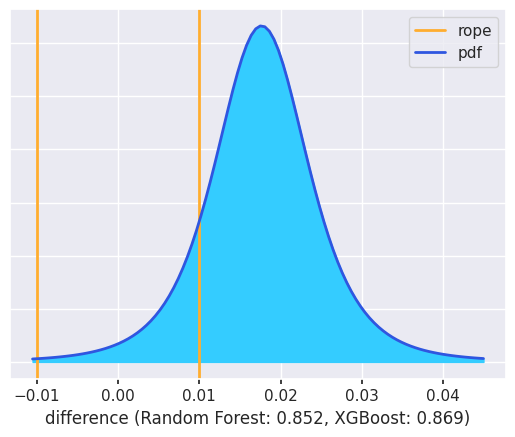

Comparación bayesiana entre Random Forest y Support Vector Classifier en ROC AUC: (0.4784024328173925, 0.518450101884642, 0.0031474652979655016)


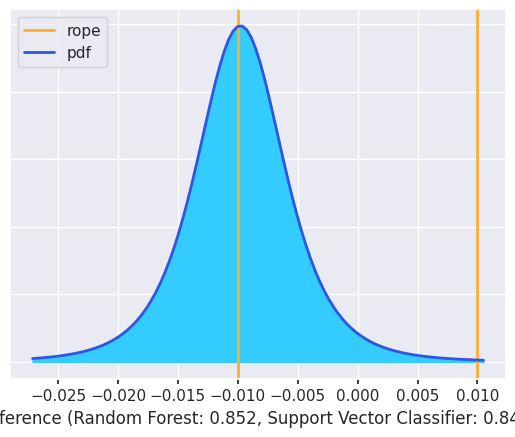

Comparación bayesiana entre Random Forest y KNN Classifier en ROC AUC: (0.9673071735676857, 0.03153412352218854, 0.001158702910125764)


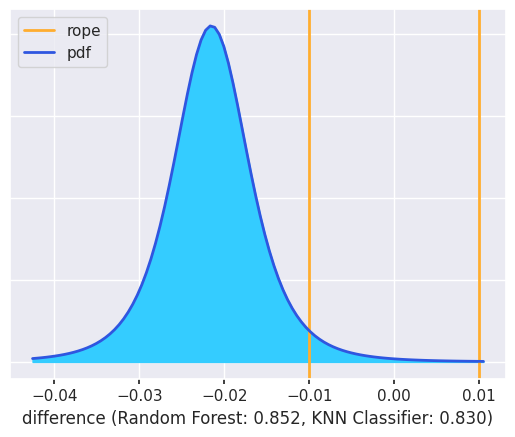

Comparación bayesiana entre Random Forest y Decision Tree en ROC AUC: (0.9999963646617459, 1.8313756279253468e-06, 1.8039626261678876e-06)


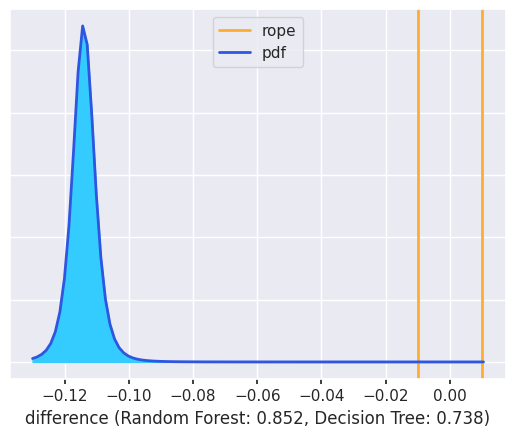

Comparación bayesiana entre Random Forest y AdaBoost en ROC AUC: (0.008776202246156786, 0.1495037701417552, 0.841720027612088)


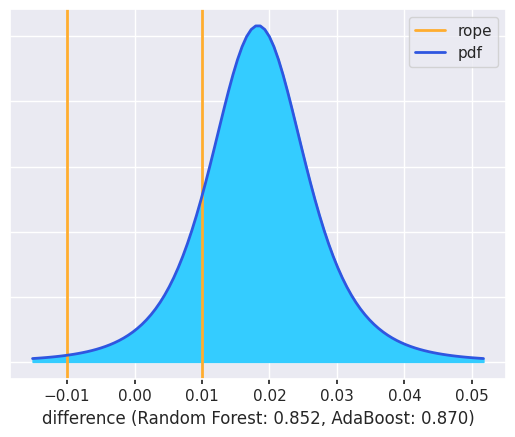

Comparación bayesiana entre Random Forest y CatBoost en ROC AUC: (0.0006723170377687495, 0.008821665253793909, 0.9905060177084374)


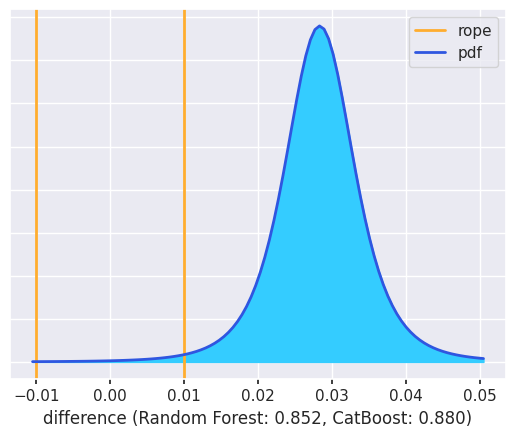

Comparación bayesiana entre Random Forest y Extra Trees en ROC AUC: (0.9977738919978288, 0.002187751470336674, 3.835653183448251e-05)


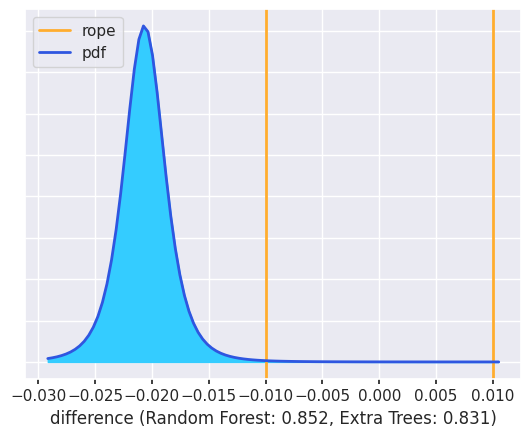

Comparación bayesiana entre Gradient Boosting y XGBoost en ROC AUC: (0.38416963817057714, 0.6155538664529336, 0.0002764953764892164)


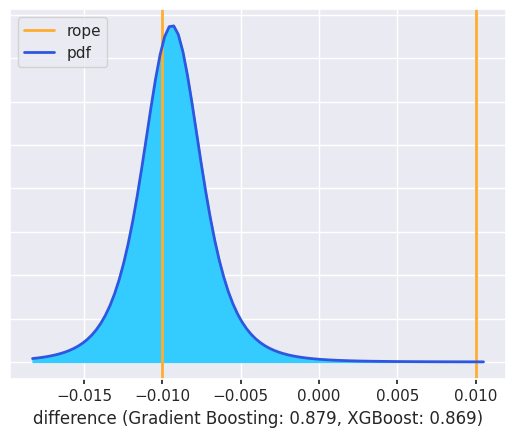

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en ROC AUC: (0.9981427260665932, 0.001632988917326328, 0.00022428501608051654)


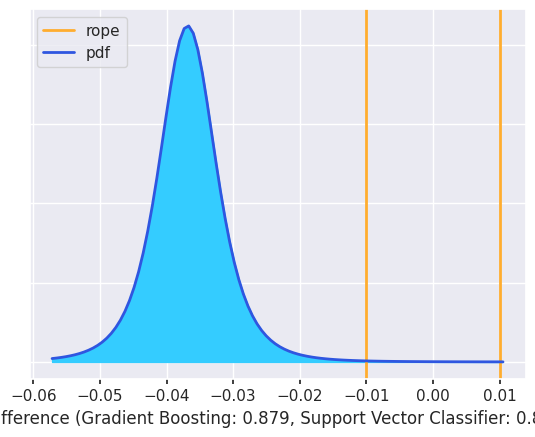

Comparación bayesiana entre Gradient Boosting y KNN Classifier en ROC AUC: (0.9994549255076854, 0.0004371870881940687, 0.00010788740412048803)


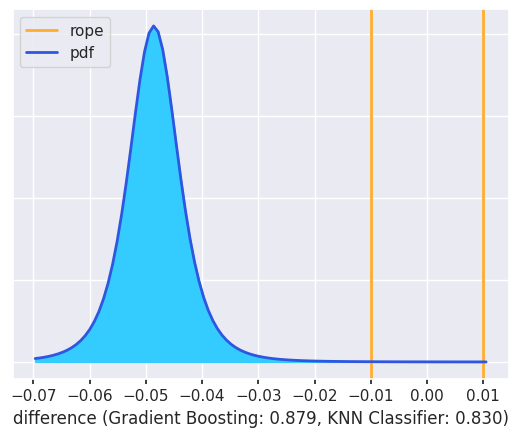

Comparación bayesiana entre Gradient Boosting y Decision Tree en ROC AUC: (0.99996942047276, 1.3154364945422437e-05, 1.742516229452651e-05)


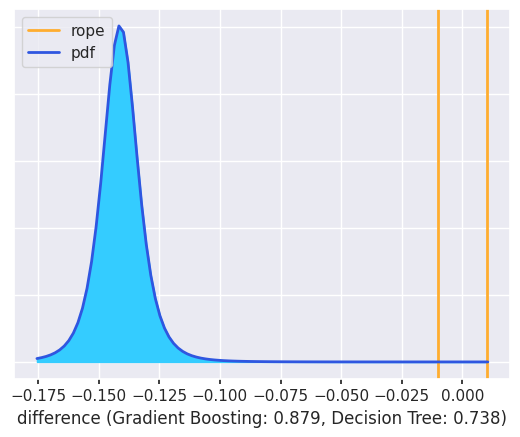

Comparación bayesiana entre Gradient Boosting y AdaBoost en ROC AUC: (0.30468840569844463, 0.6947433629826716, 0.0005682313188837274)


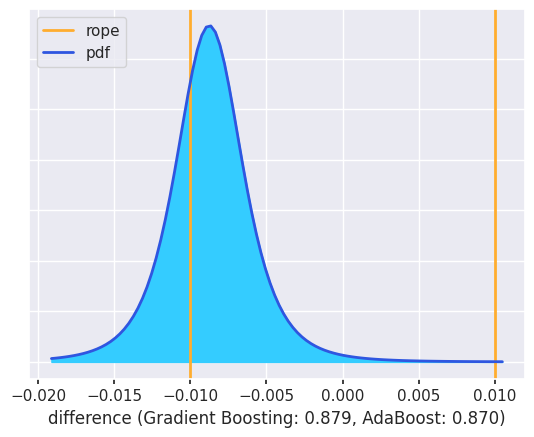

Comparación bayesiana entre Gradient Boosting y CatBoost en ROC AUC: (0.0033600647624426674, 0.9886502913621696, 0.007989643875387697)


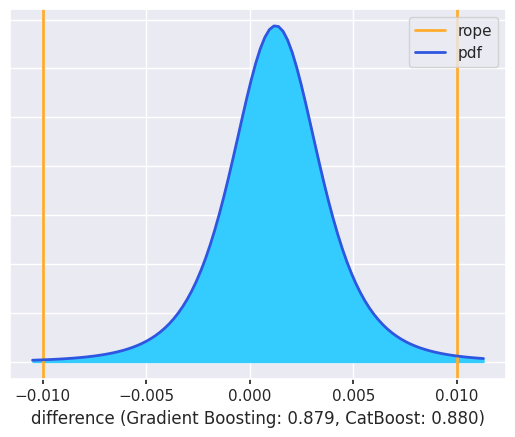

Comparación bayesiana entre Gradient Boosting y Extra Trees en ROC AUC: (0.9987202197174727, 0.001027029110884925, 0.0002527511716423625)


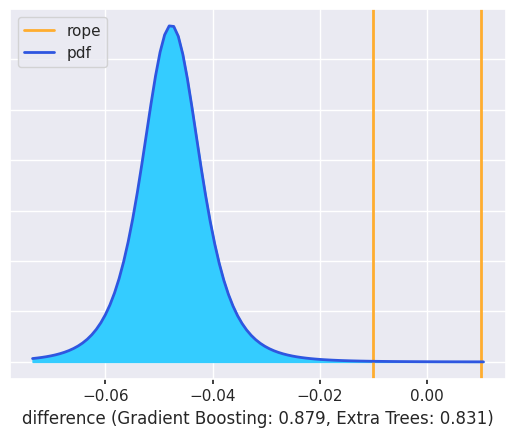

Comparación bayesiana entre XGBoost y Support Vector Classifier en ROC AUC: (0.9886582589401542, 0.0105894930007987, 0.0007522480590470559)


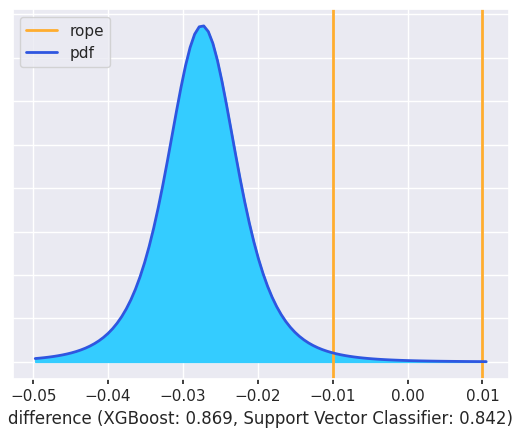

Comparación bayesiana entre XGBoost y KNN Classifier en ROC AUC: (0.9955118347929136, 0.0038277414991444436, 0.0006604237079419484)


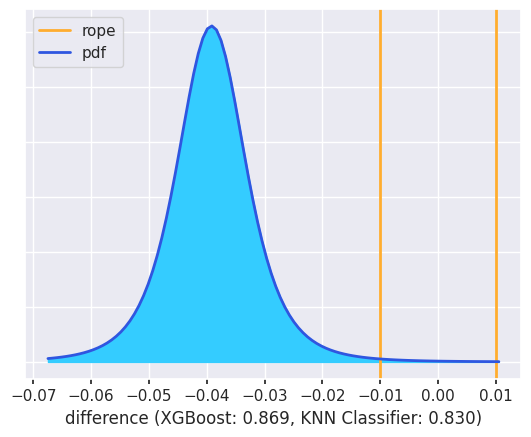

Comparación bayesiana entre XGBoost y Decision Tree en ROC AUC: (0.9999552813568493, 2.021413779029757e-05, 2.450450536040094e-05)


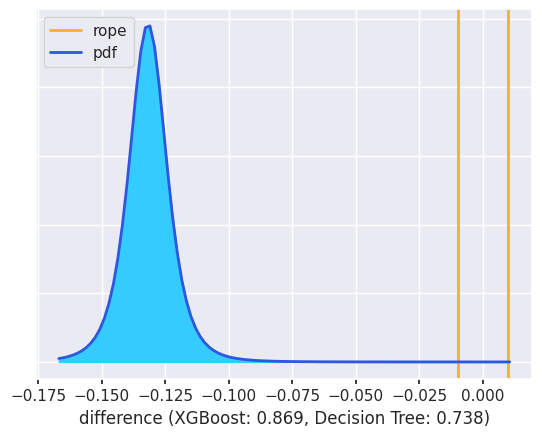

Comparación bayesiana entre XGBoost y AdaBoost en ROC AUC: (0.022160437725114335, 0.9461257902996327, 0.031713771975252936)


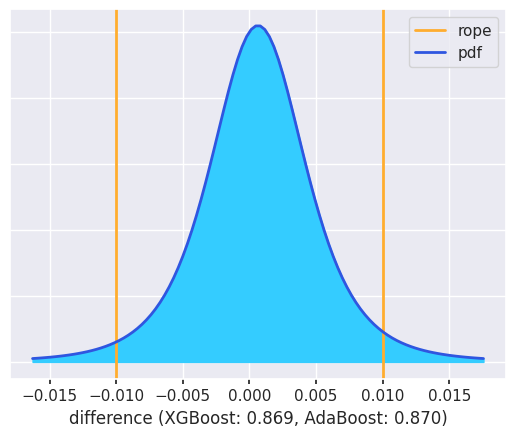

Comparación bayesiana entre XGBoost y CatBoost en ROC AUC: (3.585212086277954e-05, 0.3140484258338334, 0.6859157220453038)


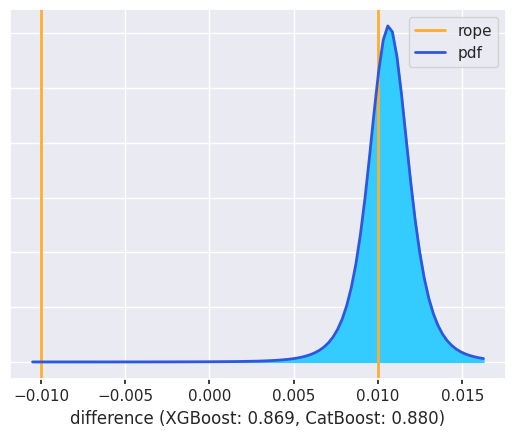

Comparación bayesiana entre XGBoost y Extra Trees en ROC AUC: (0.996373974221109, 0.003125768337911894, 0.000500257440979146)


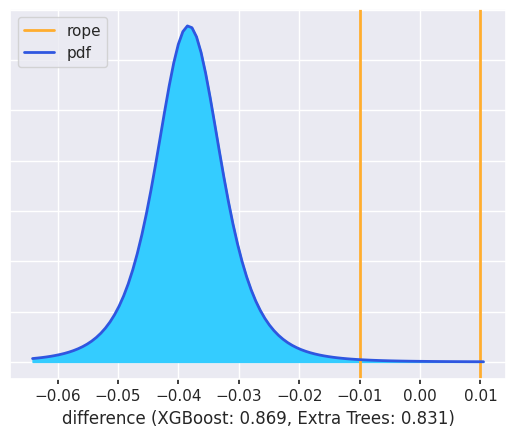

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en ROC AUC: (0.6106477735642972, 0.3796098096908753, 0.009742416744827453)


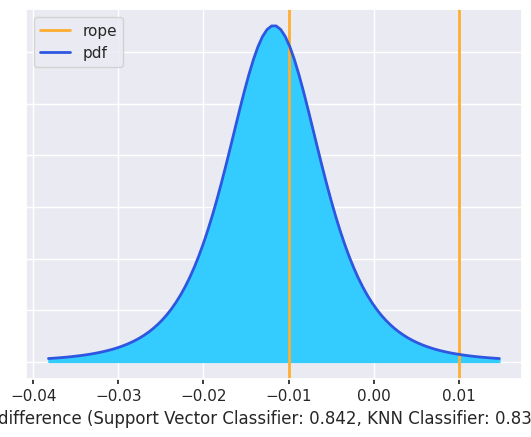

Comparación bayesiana entre Support Vector Classifier y Decision Tree en ROC AUC: (0.9999286826678745, 3.792486372644621e-05, 3.3392468399062736e-05)


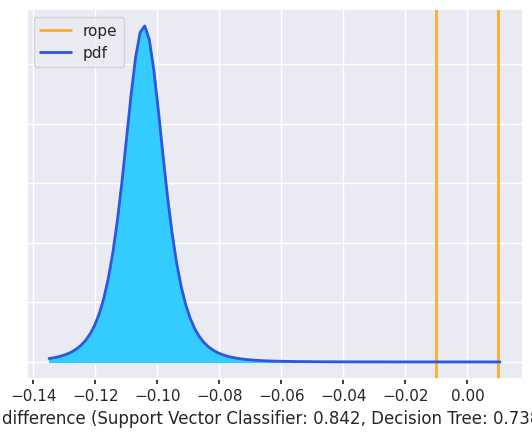

Comparación bayesiana entre Support Vector Classifier y AdaBoost en ROC AUC: (0.00157208377002297, 0.0180672617159624, 0.9803606545140147)


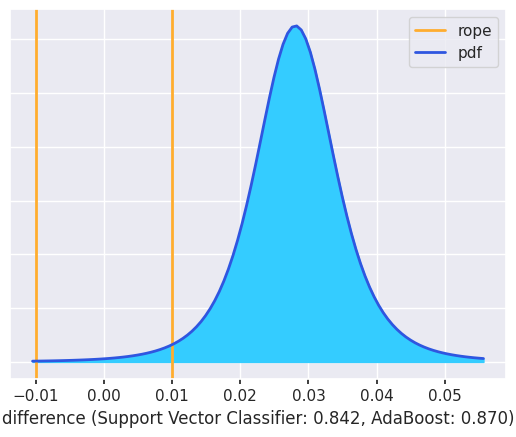

Comparación bayesiana entre Support Vector Classifier y CatBoost en ROC AUC: (0.00013526801664814236, 0.0009333352710968468, 0.9989313967122551)


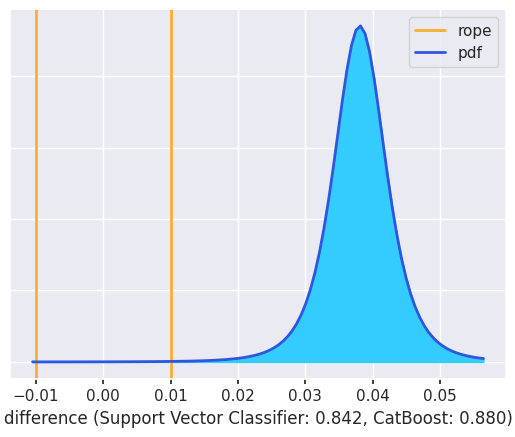

Comparación bayesiana entre Support Vector Classifier y Extra Trees en ROC AUC: (0.5719833578398289, 0.4230369136547577, 0.004979728505413394)


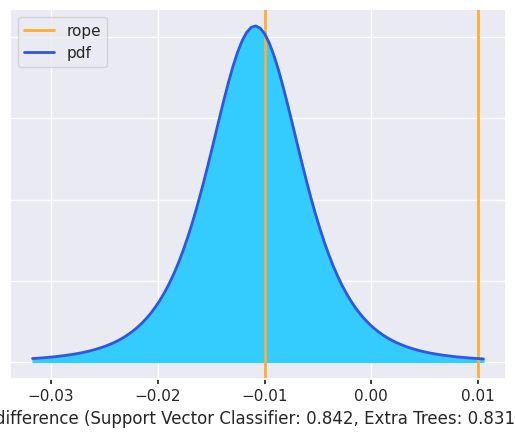

Comparación bayesiana entre KNN Classifier y Decision Tree en ROC AUC: (0.9999290858879746, 4.078368364635043e-05, 3.013042837907154e-05)


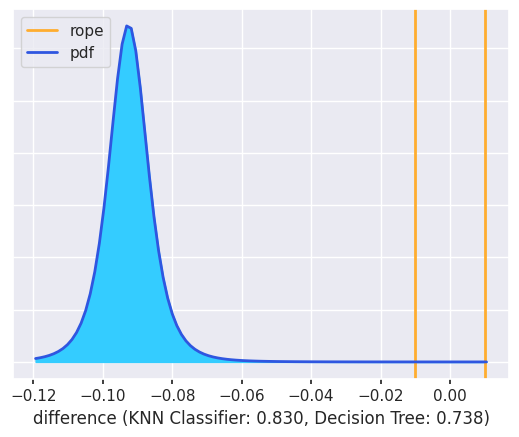

Comparación bayesiana entre KNN Classifier y AdaBoost en ROC AUC: (0.00035666829372039684, 0.0020966631676334613, 0.9975466685386462)


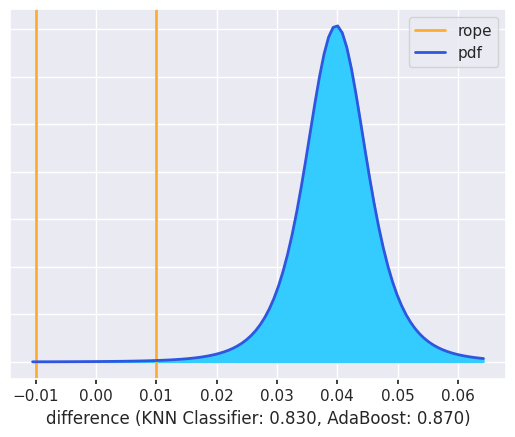

Comparación bayesiana entre KNN Classifier y CatBoost en ROC AUC: (0.00023926177689581835, 0.0008938118338733814, 0.9988669263892308)


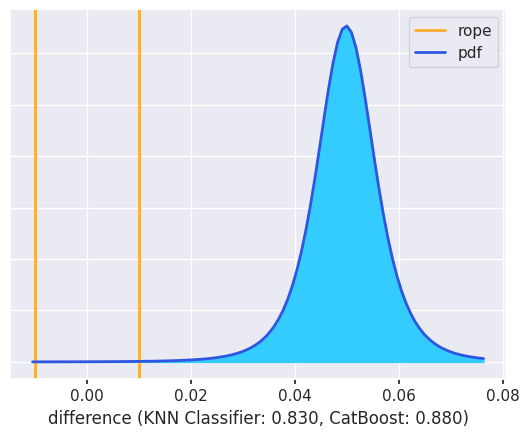

Comparación bayesiana entre KNN Classifier y Extra Trees en ROC AUC: (0.06476790923997443, 0.8433769590971715, 0.09185513166285408)


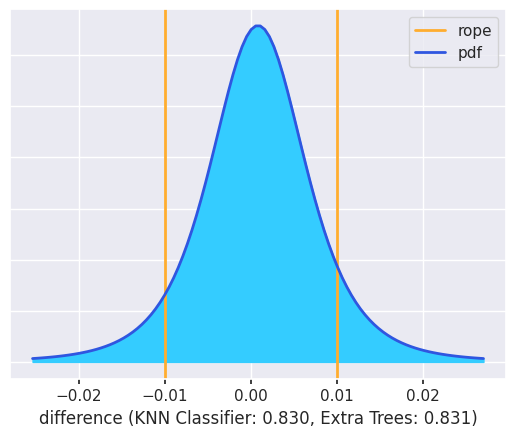

Comparación bayesiana entre Decision Tree y AdaBoost en ROC AUC: (5.509518910418447e-05, 4.482346485690236e-05, 0.9999000813460389)


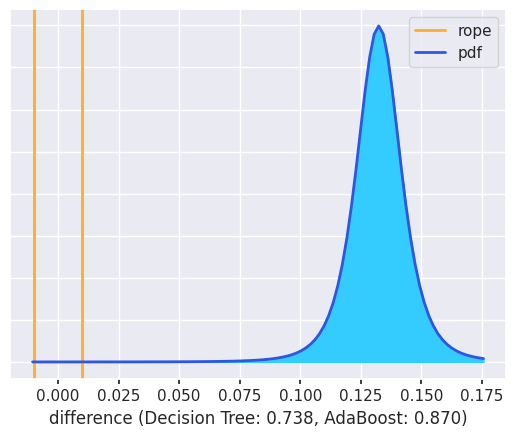

Comparación bayesiana entre Decision Tree y CatBoost en ROC AUC: (1.0880551150996438e-05, 8.140460590166931e-06, 0.9999809789882589)


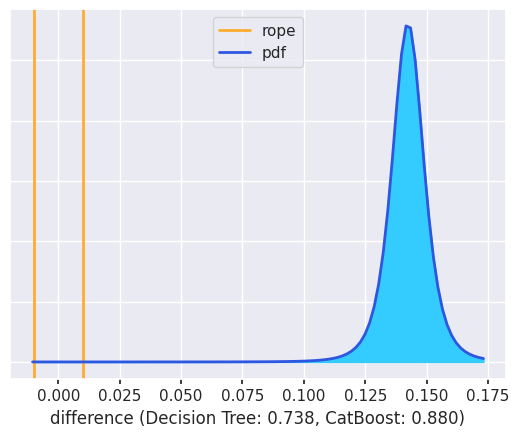

Comparación bayesiana entre Decision Tree y Extra Trees en ROC AUC: (5.936197139085084e-06, 8.012899180620536e-06, 0.9999860509036803)


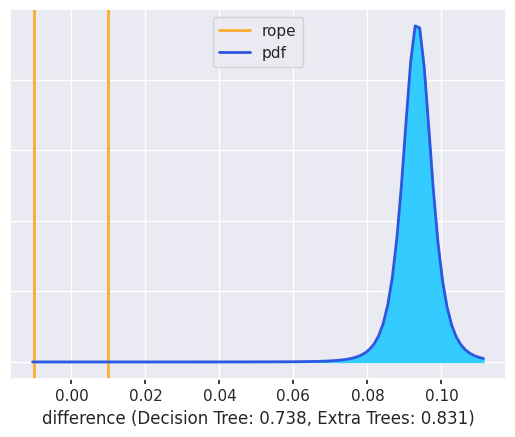

Comparación bayesiana entre AdaBoost y CatBoost en ROC AUC: (0.004642625788106286, 0.4952426888087679, 0.5001146854031259)


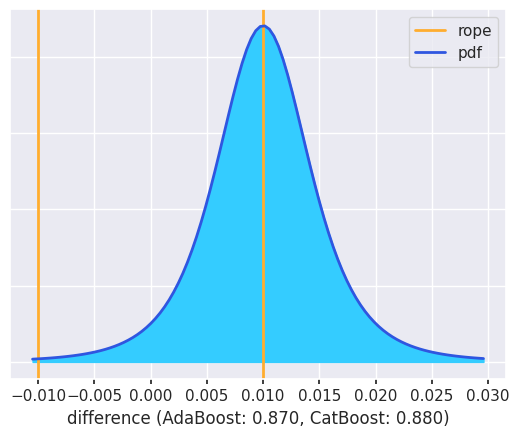

Comparación bayesiana entre AdaBoost y Extra Trees en ROC AUC: (0.9909745299713705, 0.007610079232365896, 0.001415390796263627)


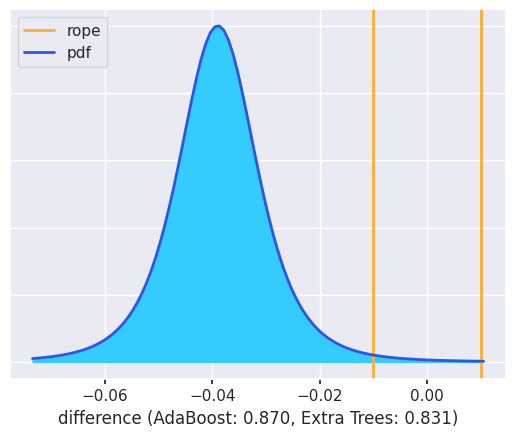

Comparación bayesiana entre CatBoost y Extra Trees en ROC AUC: (0.9995336624584099, 0.0003731319551328882, 9.320558645720123e-05)


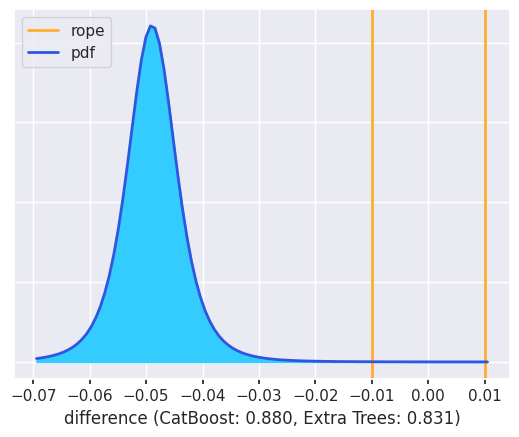

In [13]:
# Función para realizar comparaciones bayesianas entre todos los pares de clasificadores y generar gráficos
def comparaciones_bayesianas(df, nombre_metrica):
    
    rope = 0.01  # Región de Equivalencia Práctica (ROPE)
    bayes_comparison_results = {}

    # Crear una carpeta temporal
    with tempfile.TemporaryDirectory() as temp_dir:
        print(f"Imágenes guardadas en la carpeta temporal: {temp_dir}")
        
        # Comparar todos los pares únicos de modelos
        for i, modelo_1 in enumerate(df.columns):
            for j, modelo_2 in enumerate(df.columns):
                if i < j:  # Evitar comparaciones duplicadas y autocomparaciones
                    # Realizar la comparación bayesiana entre los dos modelos seleccionados usando two_on_single
                    probs, fig = baycomp.two_on_single(
                        df[modelo_1].values,  # Resultados del primer modelo
                        df[modelo_2].values,  # Resultados del segundo modelo
                        rope=rope,
                        plot=True,  # Generar el gráfico
                        names=(modelo_1, modelo_2)  # Nombres para los modelos
                    )
                    bayes_comparison_results[(modelo_1, modelo_2)] = probs
                    # Imprimir los resultados
                    print(f"Comparación bayesiana entre {modelo_1} y {modelo_2} en {nombre_metrica}: {probs}")

                    # Guardar el gráfico en la carpeta temporal
                    image_path = os.path.join(temp_dir, f"Comparacion_Bayesiana_{modelo_1}_vs_{modelo_2}_{nombre_metrica}.png")
                    fig.savefig(image_path)
                    plt.show()

    return bayes_comparison_results

# Realizar comparaciones bayesianas para cada métrica y generar los gráficos
resultados_bayesianos_accuracy = comparaciones_bayesianas(accuracy_df, 'Accuracy')
resultados_bayesianos_precision = comparaciones_bayesianas(precision_df, 'Precision')
resultados_bayesianos_recall = comparaciones_bayesianas(recall_df, 'Recall')
resultados_bayesianos_f1 = comparaciones_bayesianas(f1_df, 'F1 Score')
resultados_bayesianos_roc_auc = comparaciones_bayesianas(roc_auc_df, 'ROC AUC')


### Cruva ROC AUC de los mejores modelos

Learning rate set to 0.023581
0:	learn: 0.6805299	total: 2.67ms	remaining: 2.67s
1:	learn: 0.6686662	total: 5.2ms	remaining: 2.6s
2:	learn: 0.6592804	total: 7.94ms	remaining: 2.64s
3:	learn: 0.6513455	total: 11.1ms	remaining: 2.77s
4:	learn: 0.6415507	total: 14.1ms	remaining: 2.8s
5:	learn: 0.6322846	total: 16.8ms	remaining: 2.78s
6:	learn: 0.6250690	total: 21ms	remaining: 2.98s
7:	learn: 0.6167357	total: 24.1ms	remaining: 2.99s
8:	learn: 0.6110295	total: 27.3ms	remaining: 3s
9:	learn: 0.6033387	total: 30.5ms	remaining: 3.02s
10:	learn: 0.5956950	total: 34.2ms	remaining: 3.08s
11:	learn: 0.5888636	total: 37.3ms	remaining: 3.07s
12:	learn: 0.5835985	total: 40.7ms	remaining: 3.09s
13:	learn: 0.5771236	total: 44.4ms	remaining: 3.13s
14:	learn: 0.5713245	total: 47.5ms	remaining: 3.12s
15:	learn: 0.5658791	total: 50.6ms	remaining: 3.11s
16:	learn: 0.5612477	total: 53.5ms	remaining: 3.09s
17:	learn: 0.5560870	total: 56.5ms	remaining: 3.08s
18:	learn: 0.5516151	total: 59.4ms	remaining: 3.06s


c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


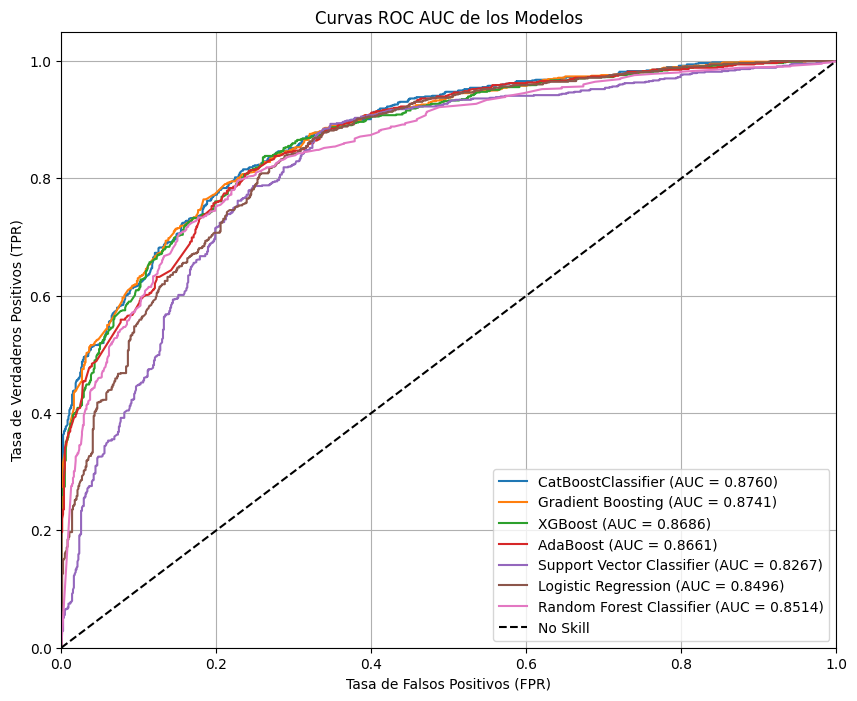

In [14]:
# Inicializar los clasificadores con los mejores parámetros (o con los predeterminados si aún no has hecho grid search)
models = {
    'CatBoostClassifier': CatBoostClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest Classifier': RandomForestClassifier(random_state=42)
    }

# Graficar las curvas ROC AUC
plt.figure(figsize=(10, 8))

for model_name, model in models.items():
    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predecir las probabilidades en el conjunto de prueba
    y_prob = model.predict_proba(X_test)[:, 1]  # Obtener la probabilidad de la clase positiva
    
    # Calcular las curvas ROC y AUC
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc_score = roc_auc_score(y_test, y_prob)
    
    # Graficar la curva ROC
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.4f})')

# Ajustar los ejes y etiquetas
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curvas ROC AUC de los Modelos')
plt.legend(loc='lower right')
plt.grid()
plt.show()

### Comparación Matrices de Confusión y Tiempo de Predicción

Learning rate set to 0.023581
0:	learn: 0.6805299	total: 4.38ms	remaining: 4.37s
1:	learn: 0.6686662	total: 7.26ms	remaining: 3.63s
2:	learn: 0.6592804	total: 9.78ms	remaining: 3.25s
3:	learn: 0.6513455	total: 12ms	remaining: 2.98s
4:	learn: 0.6415507	total: 14.3ms	remaining: 2.84s
5:	learn: 0.6322846	total: 16.6ms	remaining: 2.74s
6:	learn: 0.6250690	total: 18.9ms	remaining: 2.68s
7:	learn: 0.6167357	total: 21.4ms	remaining: 2.66s
8:	learn: 0.6110295	total: 23.5ms	remaining: 2.59s
9:	learn: 0.6033387	total: 25.9ms	remaining: 2.56s
10:	learn: 0.5956950	total: 28.2ms	remaining: 2.54s
11:	learn: 0.5888636	total: 30.6ms	remaining: 2.52s
12:	learn: 0.5835985	total: 33.2ms	remaining: 2.52s
13:	learn: 0.5771236	total: 35.6ms	remaining: 2.51s
14:	learn: 0.5713245	total: 38.1ms	remaining: 2.5s
15:	learn: 0.5658791	total: 40.4ms	remaining: 2.48s
16:	learn: 0.5612477	total: 42.4ms	remaining: 2.45s
17:	learn: 0.5560870	total: 44.9ms	remaining: 2.45s
18:	learn: 0.5516151	total: 47.3ms	remaining: 2

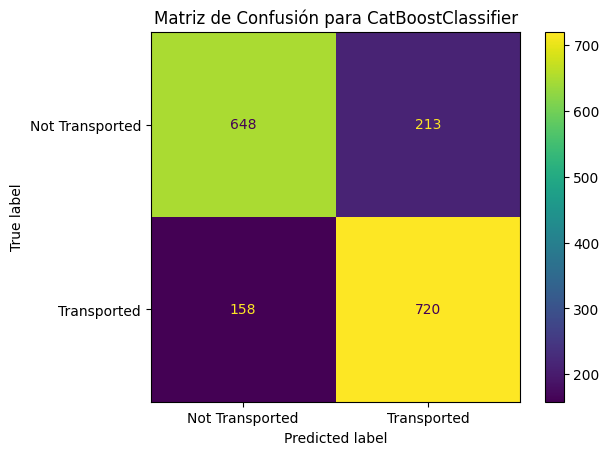

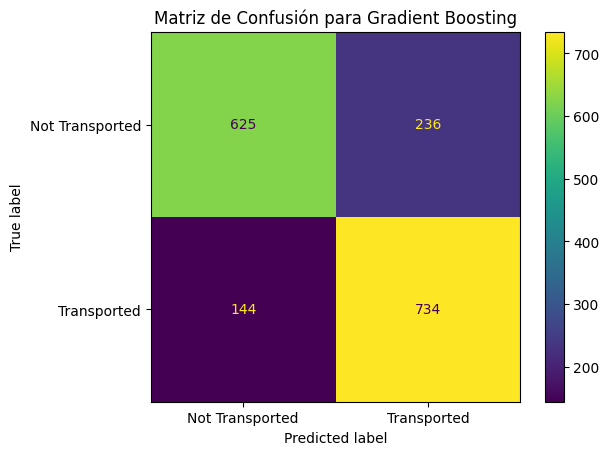

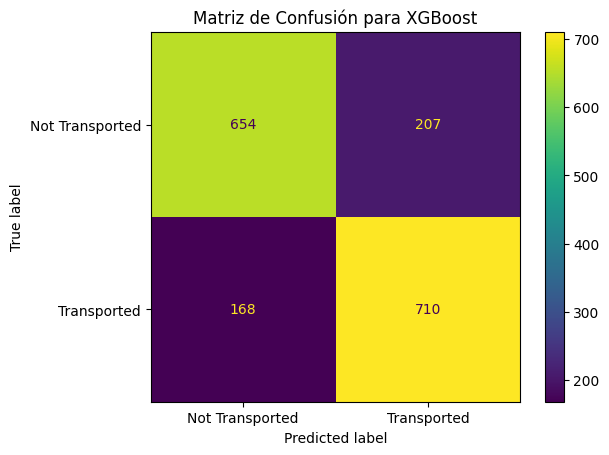

c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


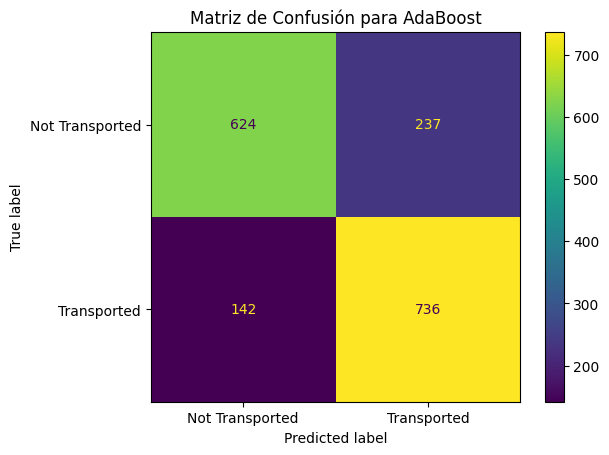

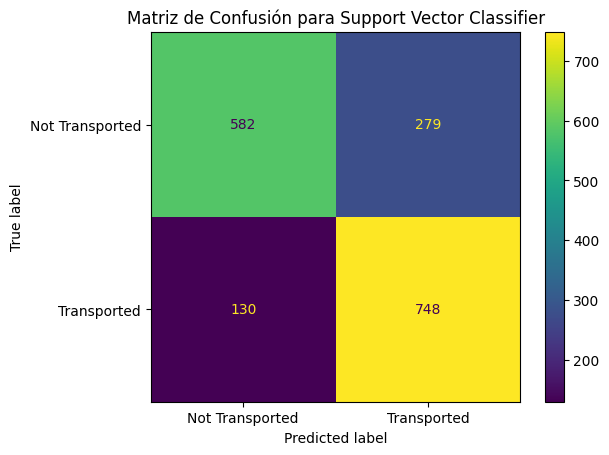

c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


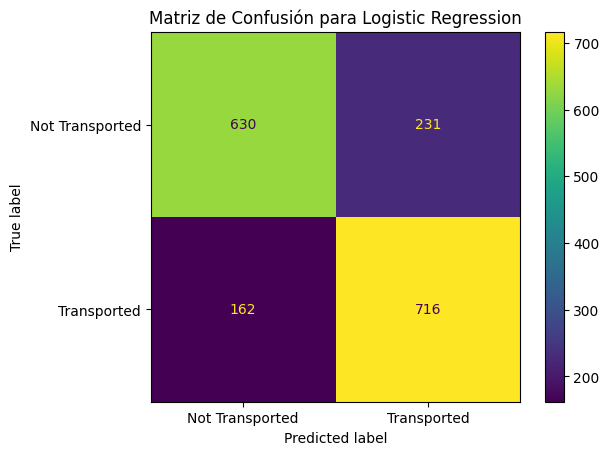

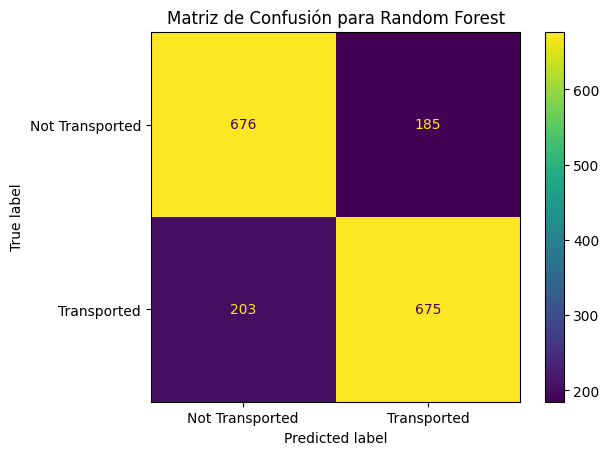

Tiempos de predicción (en segundos):
CatBoostClassifier: 2.4506 segundos
Gradient Boosting: 0.5232 segundos
XGBoost: 0.0607 segundos
AdaBoost: 0.1709 segundos
Support Vector Classifier: 3.7378 segundos
Logistic Regression: 0.0430 segundos
Random Forest: 0.5391 segundos


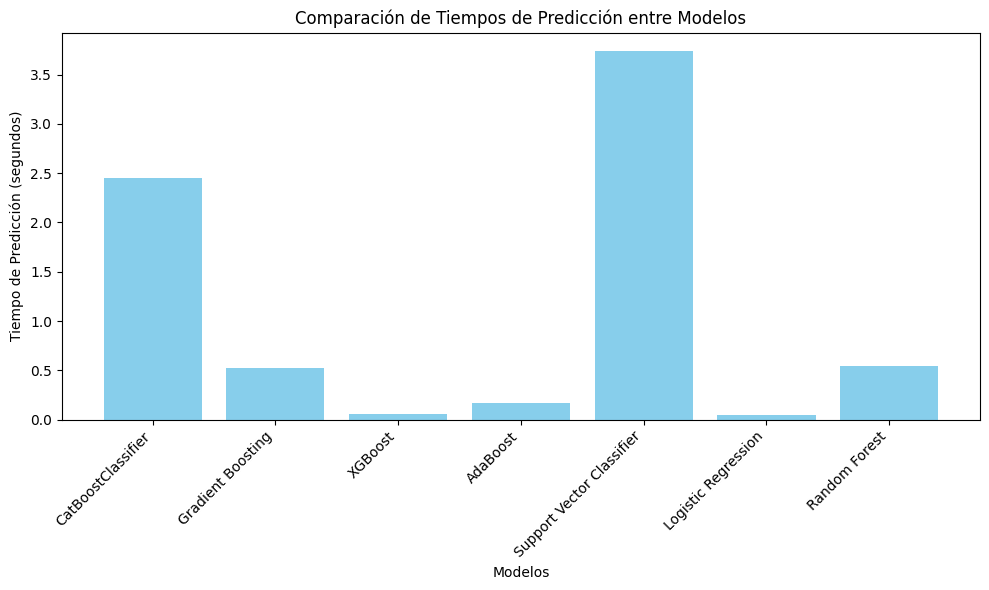

In [15]:
# Inicializar los clasificadores
models = {
    'CatBoostClassifier': CatBoostClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
}

# DataFrame para almacenar tiempos
prediction_times = {}

# Entrenamiento, predicción y medición de tiempos
for model_name, model in models.items():
    start_time = time.time()
    
    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predecir las etiquetas en el conjunto de prueba
    y_pred = model.predict(X_test)
    
    end_time = time.time()
    
    # Calcular el tiempo de predicción
    elapsed_time = end_time - start_time
    prediction_times[model_name] = elapsed_time

    # Calcular la matriz de confusión
    cm = confusion_matrix(y_test, y_pred)
    
    # Mostrar la matriz de confusión
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Transported', 'Transported'])
    disp.plot()
    plt.title(f'Matriz de Confusión para {model_name}')
    plt.show()

# Imprimir los tiempos de predicción
print("Tiempos de predicción (en segundos):")
for model_name, elapsed_time in prediction_times.items():
    print(f"{model_name}: {elapsed_time:.4f} segundos")

# Visualizar los tiempos de predicción
plt.figure(figsize=(10, 6))
plt.bar(prediction_times.keys(), prediction_times.values(), color='skyblue')
plt.xlabel('Modelos')
plt.ylabel('Tiempo de Predicción (segundos)')
plt.title('Comparación de Tiempos de Predicción entre Modelos')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### Evaluación Individual de los "Mejores Modelos"

#### Gradient Boosting

In [16]:
gb = GradientBoostingClassifier(n_estimators=100, random_state=42) 
# Entrenamiento final del modelo de descenso de gradiente en todo el conjunto de datos
gb.fit(X_train, y_train)
# Obtener predicciones en el conjunto completo para la matriz de confusión
y_pred_gb = gb.predict(X_test)

In [17]:
# Crear el clasificador AdaBoost
gb_clf = GradientBoostingClassifier(random_state=42)

# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results = cross_validate(
    gb_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para GradientBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")


Resultados de la Validación Cruzada para GradientBoost:

Accuracy:
  Media: 0.8039
  Desviación estándar: 0.0085

Precision:
  Media: 0.7840
  Desviación estándar: 0.0188

Recall:
  Media: 0.8437
  Desviación estándar: 0.0138

F1:
  Media: 0.8125
  Desviación estándar: 0.0046

Roc_auc:
  Media: 0.8036
  Desviación estándar: 0.0086


In [18]:
# Evaluar el modelo en el conjunto de prueba
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print(f"Precisión en el conjunto de prueba: {accuracy_gb:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_gb))

Precisión en el conjunto de prueba: 0.7815

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.81      0.73      0.77       861
        True       0.76      0.84      0.79       878

    accuracy                           0.78      1739
   macro avg       0.78      0.78      0.78      1739
weighted avg       0.78      0.78      0.78      1739



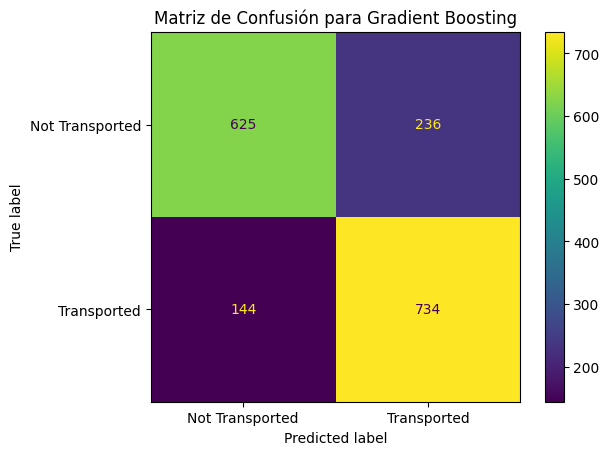

In [19]:
# Visualización de la matriz de confusión para el descenso de gradiente
cm_gb = confusion_matrix(y_test, y_pred_gb)
# Mostrar la matriz de confusión
ConfusionMatrixDisplay(cm_gb, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para Gradient Boosting')
plt.show()

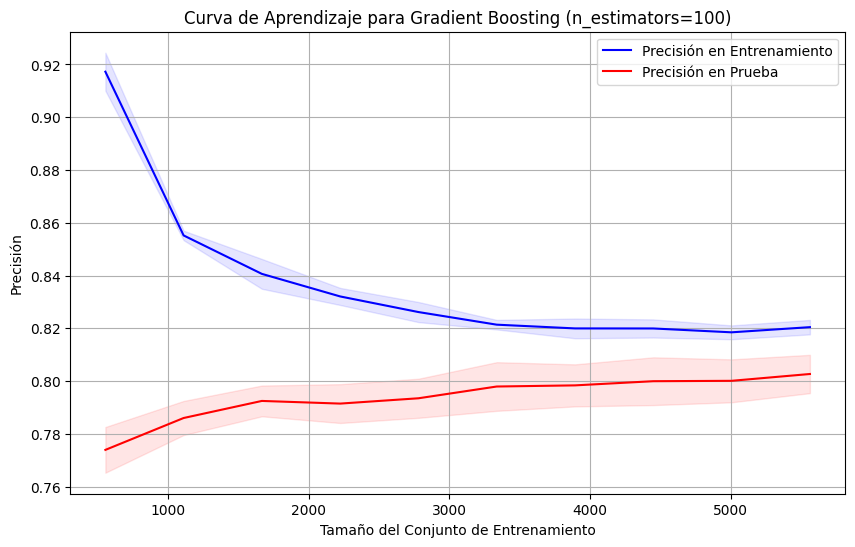

In [20]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    gb, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Gradient Boosting (n_estimators=100)')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### XGBoost

In [21]:
# Crear el clasificador XGBoost
xgb_clf = XGBClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo XGBoost en el conjunto de entrenamiento
xgb_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_xgb = xgb_clf.predict(X_test)

In [22]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada para XGBoost
cv_results = cross_validate(
    xgb_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados de la validación cruzada
print("Resultados de la Validación Cruzada para XGBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para XGBoost:

Accuracy:
  Media: 0.7957
  Desviación estándar: 0.0110

Precision:
  Media: 0.7893
  Desviación estándar: 0.0148

Recall:
  Media: 0.8109
  Desviación estándar: 0.0129

F1:
  Media: 0.7998
  Desviación estándar: 0.0100

Roc_auc:
  Media: 0.7956
  Desviación estándar: 0.0110


In [23]:
# Evaluar el modelo en el conjunto de prueba
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"Precisión en el conjunto de prueba: {accuracy_xgb:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_xgb))

Precisión en el conjunto de prueba: 0.7844

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.80      0.76      0.78       861
        True       0.77      0.81      0.79       878

    accuracy                           0.78      1739
   macro avg       0.78      0.78      0.78      1739
weighted avg       0.78      0.78      0.78      1739



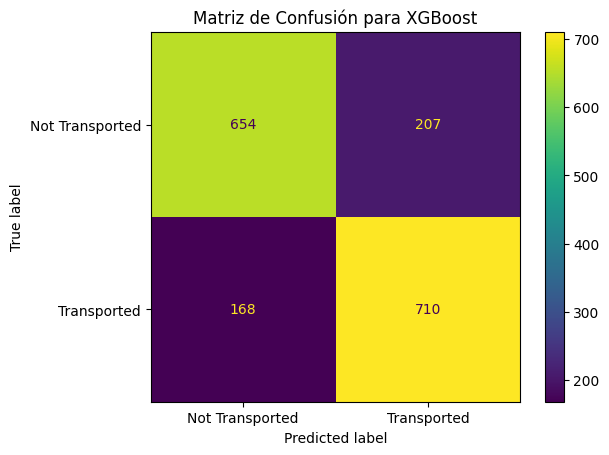

In [24]:
# Visualización de la matriz de confusión para XGBoost
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
ConfusionMatrixDisplay(cm_xgb, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para XGBoost')
plt.show()

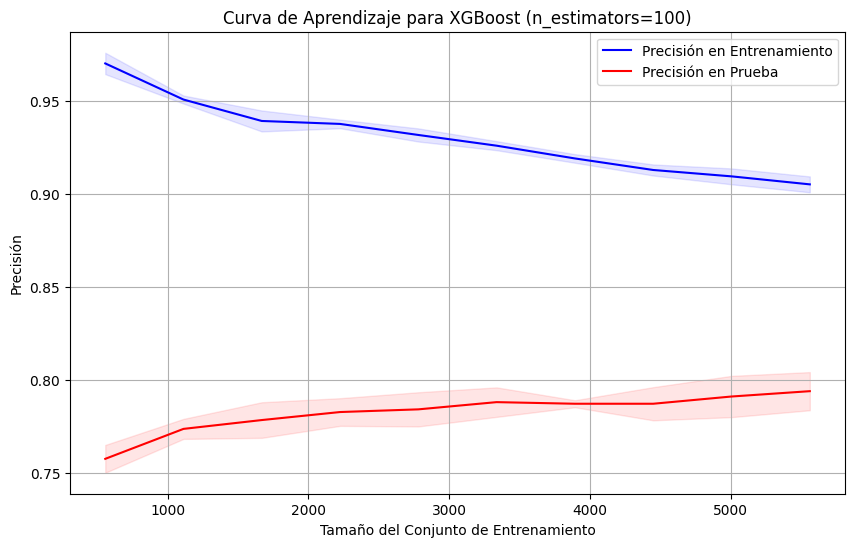

In [25]:
# Obtener las curvas de aprendizaje para XGBoost
train_sizes, train_scores, test_scores = learning_curve(
    xgb_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para XGBoost (n_estimators=100)')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### AdaBoost

In [26]:
# Entrenar el modelo AdaBoost en crudo
ada_clf = AdaBoostClassifier(random_state=42)
ada_clf.fit(X_train, y_train)
# Realizar predicciones
y_pred_ada = ada_clf.predict(X_test)

c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [27]:
# Crear el clasificador AdaBoost
ada_clf = AdaBoostClassifier(random_state=42)

# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results = cross_validate(
    ada_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para AdaBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")


c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

Resultados de la Validación Cruzada para AdaBoost:

Accuracy:
  Media: 0.7967
  Desviación estándar: 0.0112

Precision:
  Media: 0.7829
  Desviación estándar: 0.0183

Recall:
  Media: 0.8257
  Desviación estándar: 0.0155

F1:
  Media: 0.8035
  Desviación estándar: 0.0092

Roc_auc:
  Media: 0.7965
  Desviación estándar: 0.0113


c:\Users\Manuel Montufar\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [28]:
# Evaluar el modelo en el conjunto de prueba
accuracy_ada = accuracy_score(y_test, y_pred_ada)
print(f"Precisión en el conjunto de prueba: {accuracy_ada:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_ada))

Precisión en el conjunto de prueba: 0.7821

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.81      0.72      0.77       861
        True       0.76      0.84      0.80       878

    accuracy                           0.78      1739
   macro avg       0.79      0.78      0.78      1739
weighted avg       0.79      0.78      0.78      1739



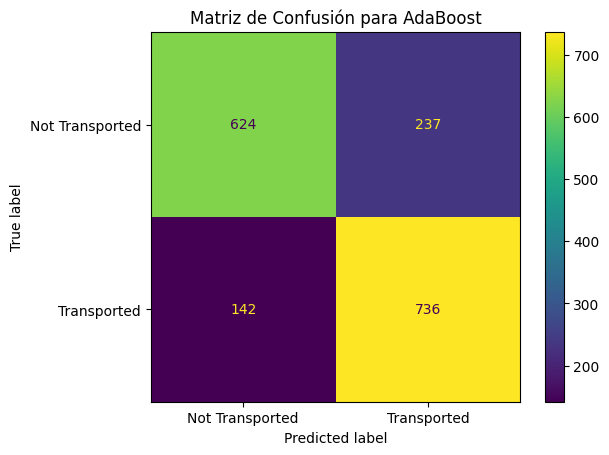

In [29]:
# Calcular la matriz de confusión
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_ada, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para AdaBoost')
plt.show()

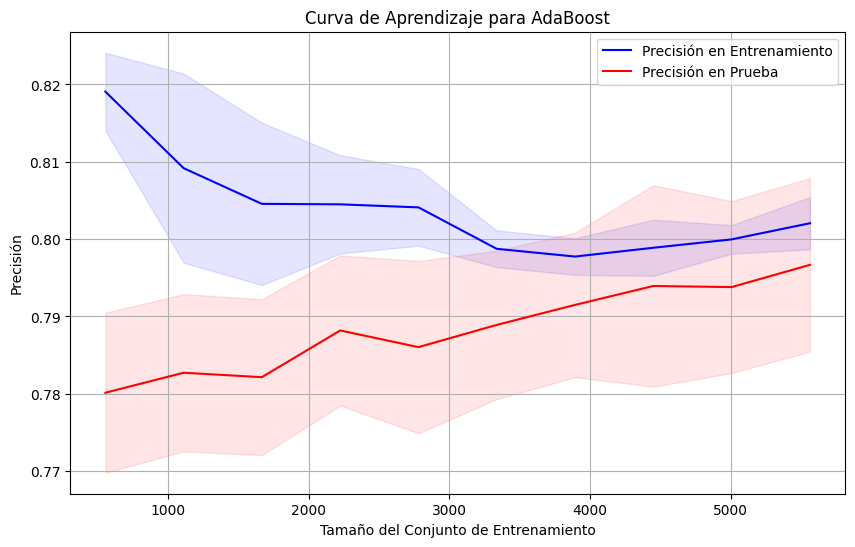

In [30]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    ada_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para AdaBoost')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### Logistic Regression

In [31]:
# Crear un pipeline con escalado y regresión logística
lr_clf = make_pipeline(StandardScaler(), LogisticRegression(random_state=42, max_iter=5000))

# Entrenar el modelo con el pipeline
lr_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_lr = lr_clf.predict(X_test)

In [32]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results = cross_validate(
    lr_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para Logistic Regression:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para Logistic Regression:

Accuracy:
  Media: 0.7903
  Desviación estándar: 0.0103

Precision:
  Media: 0.7833
  Desviación estándar: 0.0196

Recall:
  Media: 0.8080
  Desviación estándar: 0.0159

F1:
  Media: 0.7951
  Desviación estándar: 0.0077

Roc_auc:
  Media: 0.7902
  Desviación estándar: 0.0104


In [33]:
# Evaluar el modelo en el conjunto de prueba
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"Precisión en el conjunto de prueba: {accuracy_lr:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_lr))

Precisión en el conjunto de prueba: 0.7763

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.79      0.74      0.77       861
        True       0.76      0.81      0.79       878

    accuracy                           0.78      1739
   macro avg       0.78      0.78      0.78      1739
weighted avg       0.78      0.78      0.78      1739



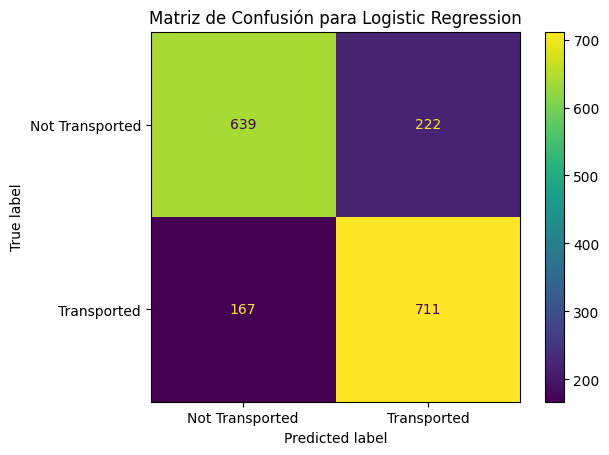

In [34]:
# Calcular la matriz de confusión
conf_matrix_lr = confusion_matrix(y_test, y_pred_lr)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_lr, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para Logistic Regression')
plt.show()


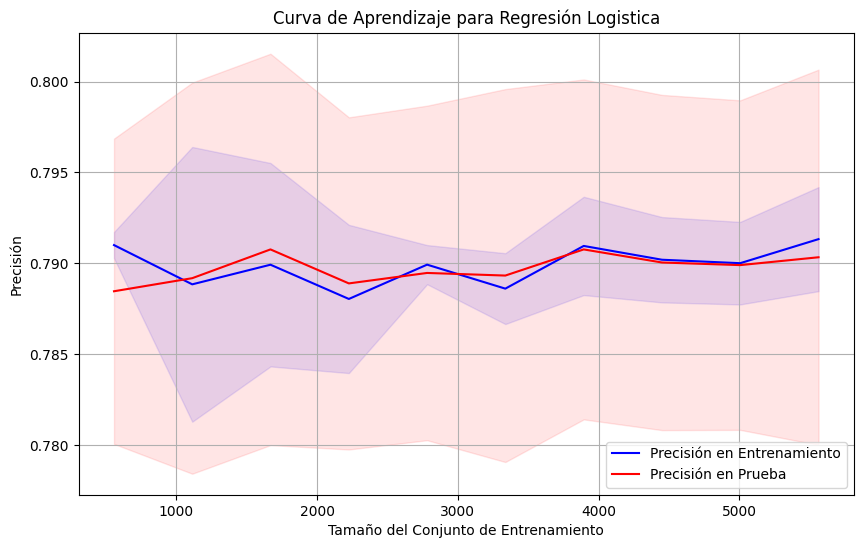

In [35]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    lr_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Regresión Logistica')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### Support Vector Classifier

In [36]:
# Crear el clasificador SVC
svc_clf = SVC(random_state=42)
svc_clf.fit(X_train, y_train)
# Obtener predicciones en el conjunto de prueba
y_pred_svc = svc_clf.predict(X_test)

In [37]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results_svc = cross_validate(
    svc_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para SVC:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results_svc[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results_svc[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para SVC:

Accuracy:
  Media: 0.7879
  Desviación estándar: 0.0118

Precision:
  Media: 0.7456
  Desviación estándar: 0.0179

Recall:
  Media: 0.8797
  Desviación estándar: 0.0145

F1:
  Media: 0.8069
  Desviación estándar: 0.0082

Roc_auc:
  Media: 0.7873
  Desviación estándar: 0.0119


In [38]:
# Evaluar el modelo en el conjunto de prueba
accuracy_svc = accuracy_score(y_test, y_pred_svc)
print(f"Precisión en el conjunto de prueba: {accuracy_svc:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_svc))

Precisión en el conjunto de prueba: 0.7648

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.82      0.68      0.74       861
        True       0.73      0.85      0.79       878

    accuracy                           0.76      1739
   macro avg       0.77      0.76      0.76      1739
weighted avg       0.77      0.76      0.76      1739



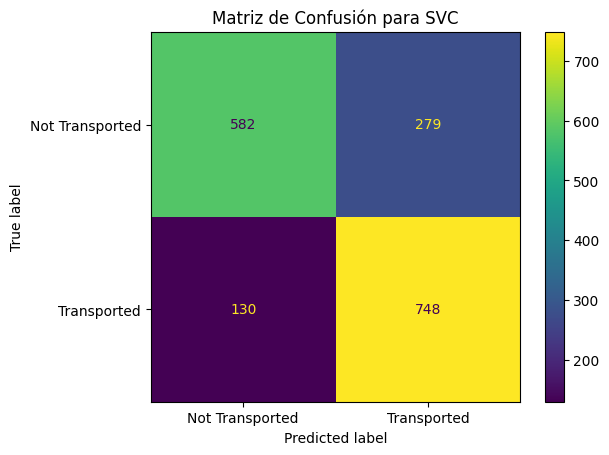

In [39]:
# Calcular la matriz de confusión
conf_matrix_svc = confusion_matrix(y_test, y_pred_svc)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_svc, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para SVC')
plt.show()

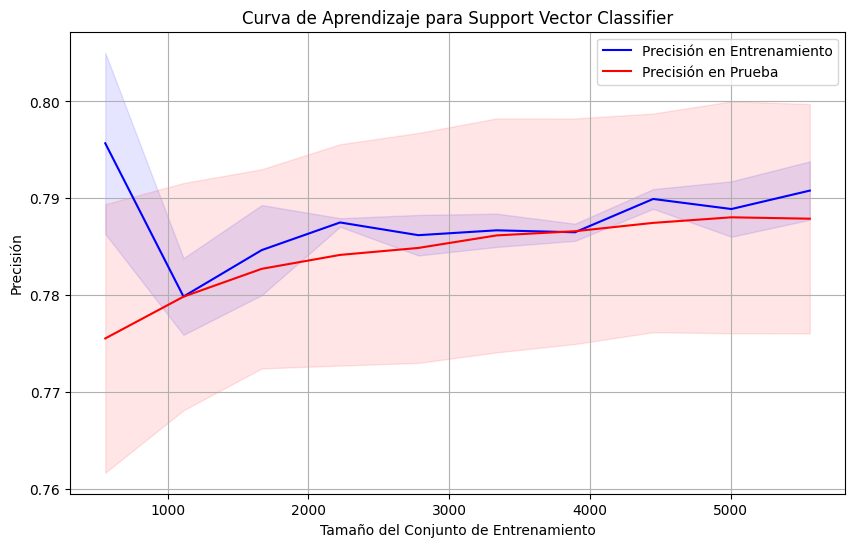

In [40]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    svc_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Support Vector Classifier')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### Random Forest

In [41]:
# Crear el clasificador Random Forest
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_rf = rf_clf.predict(X_test)

In [42]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results_rf = cross_validate(
    rf_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para Random Forest:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results_rf[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results_rf[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para Random Forest:

Accuracy:
  Media: 0.7873
  Desviación estándar: 0.0066

Precision:
  Media: 0.8027
  Desviación estándar: 0.0179

Recall:
  Media: 0.7666
  Desviación estándar: 0.0120

F1:
  Media: 0.7840
  Desviación estándar: 0.0035

Roc_auc:
  Media: 0.7875
  Desviación estándar: 0.0067


In [43]:
# Evaluar el modelo en el conjunto de prueba
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Precisión en el conjunto de prueba: {accuracy_rf:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_rf))

Precisión en el conjunto de prueba: 0.7769

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.77      0.79      0.78       861
        True       0.78      0.77      0.78       878

    accuracy                           0.78      1739
   macro avg       0.78      0.78      0.78      1739
weighted avg       0.78      0.78      0.78      1739



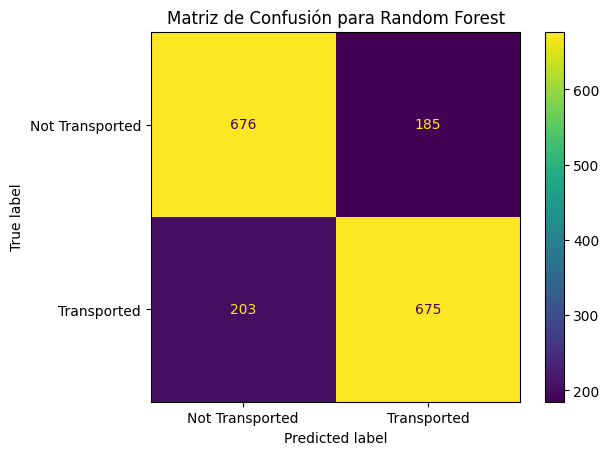

In [44]:
# Calcular la matriz de confusión
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_rf, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para Random Forest')
plt.show()

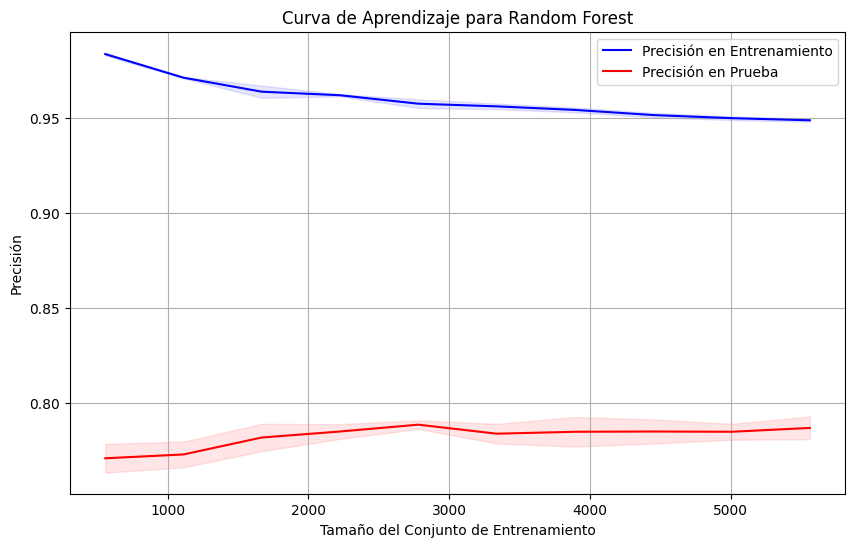

In [45]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    rf_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Random Forest')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### CatBoost

In [46]:
# Crear el clasificador CatBoost
cat_clf = CatBoostClassifier(random_state=42, verbose=0)  # `verbose=0` para evitar demasiada salida
cat_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_cat = cat_clf.predict(X_test)

In [47]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results_cat = cross_validate(
    cat_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para CatBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results_cat[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results_cat[f'test_{metric}']):.4f}")


Resultados de la Validación Cruzada para CatBoost:

Accuracy:
  Media: 0.8011
  Desviación estándar: 0.0076

Precision:
  Media: 0.7865
  Desviación estándar: 0.0168

Recall:
  Media: 0.8314
  Desviación estándar: 0.0162

F1:
  Media: 0.8080
  Desviación estándar: 0.0052

Roc_auc:
  Media: 0.8009
  Desviación estándar: 0.0077


In [48]:
# Evaluar el modelo en el conjunto de prueba
accuracy_cat = accuracy_score(y_test, y_pred_cat)
print(f"Precisión en el conjunto de prueba: {accuracy_cat:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_cat))

Precisión en el conjunto de prueba: 0.7867

Reporte de Clasificación:
              precision    recall  f1-score   support

       False       0.80      0.75      0.78       861
        True       0.77      0.82      0.80       878

    accuracy                           0.79      1739
   macro avg       0.79      0.79      0.79      1739
weighted avg       0.79      0.79      0.79      1739



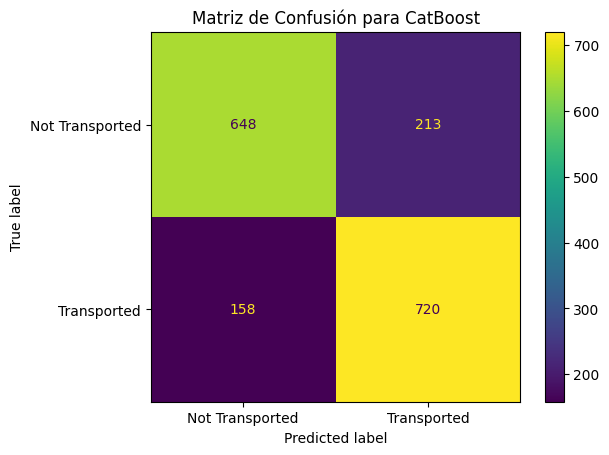

In [49]:
# Calcular la matriz de confusión
conf_matrix_cat = confusion_matrix(y_test, y_pred_cat)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_cat, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para CatBoost')
plt.show()

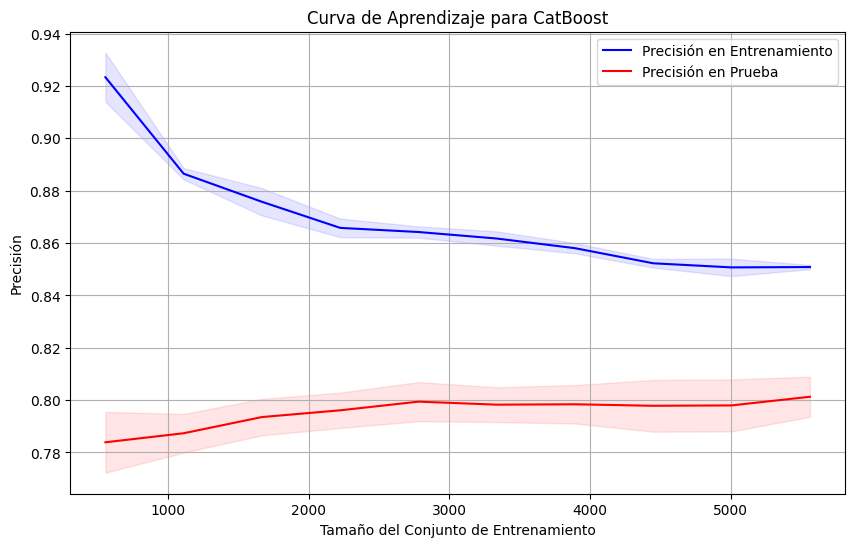

In [50]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    cat_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para CatBoost')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()